### Load Python packages and configure some global settings

In [ ]:
# each section after loading is more or less independent

In [1]:
#!pip install scanpy leidenalg bbknn scrublet wget

In [2]:
#pip install umap-learn

In [3]:
#pip install virtualenv

In [4]:
#!virtualenv testrun

In [1]:
# Import Python packages
import pandas as pd
import numpy as np
#!pip install matplotlib==3.1.3
import matplotlib.pyplot as plt
import scanpy as sc
import scipy.sparse
import os, sys, wget, pickle
import bbknn
import scrublet as scr
from IPython.display import Image
from IPython.display import display

# Suppress 'FutureWarnings'
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Don't limit pandas column #
pd.options.display.max_columns=None

In [2]:
#!pip install pydeseq2 adjustText

In [3]:
#%%bash 
#module load git
#git clone https://github.com/wagnerde/scTools-py.git


In [ ]:
# taken from git above
sys.path.append('/home/tht38/scTools-py')
import scTools_dew as dew

In [5]:
# Install LFTP
#!sudo apt-get install lftp

In [6]:
from matplotlib.pyplot import rc_context

### load spatial data

In [ ]:
import scanpy as sc
import squidpy as sq
import geopandas as gpd
import pandas as pd
import numpy as np
import re
import json
import matplotlib.pyplot as plt


adata = sc.read_10x_h5('/scratch/tht38/rep2segmentation/filtered_feature_cell_matrix.h5')
adata.var_names_make_unique()
print(f"{adata.n_obs} cells × {adata.n_vars} genes loaded")

# load cell segmentation polygons
gdf = gpd.read_file("/scratch/tht38/rep2segmentation/cell_segmentations.geojson")
print(f"{len(gdf)} polygons loaded")
gdf["cell_id"] = gdf["cell_id"].astype(str)


s = pd.Series(list(adata.obs_names), index=adata.obs_names, name="orig_id")

extracted = s.str.extract(r"(\d{6,9})")[0]

#remove leading 0s
def normalize_series(series):
    mask = series.notna()
    series_norm = pd.Series(index=series.index, dtype=object)
    try:
        series_norm[mask] = series[mask].astype(int).astype(str)
    except Exception:
        series_norm[mask] = series[mask].astype(str).str.lstrip("0")
    series_norm[~mask] = np.nan
    return series_norm

normalized = normalize_series(extracted)

if normalized.isna().any():
    print("NaNs detected — applying fallback regex extraction...")
    def get_num(x):
        m = re.search(r"(\d{6,9})", x)
        return str(int(m.group(1))) if m else None
    normalized = s.map(get_num)

adata.obs["cell_numeric_id"] = normalized.values

# Confirm
print("Extracted cell_numeric_id examples:")
print(adata.obs["cell_numeric_id"].head())
print(f"NaNs in cell_numeric_id: {adata.obs['cell_numeric_id'].isna().sum()}")

# Align expression (adata) and segmentation (gdf)
common_ids = adata.obs["cell_numeric_id"][adata.obs["cell_numeric_id"].isin(gdf["cell_id"])]

adata = adata[adata.obs["cell_numeric_id"].isin(common_ids)].copy()
gdf = gdf.set_index("cell_id").loc[common_ids]

assert len(adata) == len(gdf), "Mismatch between expression and segmentation cell counts"
print(f"Aligned {len(adata)} cells with matching segmentations")

# Compute centroids and assign to adata.obsm["spatial"]
gdf["centroid"] = gdf.geometry.centroid
adata.obsm["spatial"] = np.vstack([gdf.centroid.x, gdf.centroid.y]).T

adata.uns["cell_polygons"] = gdf.geometry

#scale factors
try:
    with open("/scratch/tht38/rep2segmentation/spatial/scalefactors_json.json") as f:
        scalefactors = json.load(f)
    adata.uns["scalefactors"] = scalefactors
    print("Loaded scalefactors_json.json")
except FileNotFoundError:
    print("No scalefactors_json.json found — skipping.")


#adata.write("visiumhd_segmented_aligned.h5ad")


In [ ]:
adata

In [ ]:
# load metadata
sample_info = pd.read_csv("/scratch/tht38/rep2segmentation/SegTimepoints.csv", index_col=0)
adata.obs["time"] = sample_info["Timepoints"].reindex(adata.obs.index)

sample_info = pd.read_csv("/scratch/tht38/rep2segmentation/SegGraphBased.csv", index_col=0)
adata.obs["GraphBased"] = sample_info["Graph-based"].reindex(adata.obs.index)

sample_info = pd.read_csv("/scratch/tht38/rep2segmentation/2.16recluster.csv", index_col=0)
adata.obs["Recluster2.16"] = sample_info["2.16recluster"].reindex(adata.obs.index)

sample_info = pd.read_csv("/home/tht38/spatial.python/rep2seg/metadataRep2cellseg.csv", index_col=0)
adata.obs["CC.CellType"] = sample_info["CC.CellType"].reindex(adata.obs.index)

In [ ]:
# graphs to check bins/cells properly input
#sq.pl.spatial_scatter(adata, color="GraphBased", shape=None, vmax = 3)

In [ ]:
#sq.pl.spatial_scatter(adata, color = 'time', shape = None)

In [ ]:
adata_Verzi = adata
del adata

In [ ]:
adata_Verzi.obs['n_counts'] = adata_Verzi.X.sum(1).A1

In [ ]:
# filter for 40 counts per cell minimum
adata_Verzi = adata_Verzi[adata_Verzi.obs['n_counts'] > 40].copy()

In [ ]:
adata_Verzi = adata_Verzi[~adata_Verzi.obs["time"].isna()]  # Remove cells with time labels as NaNs

In [ ]:
adata_Verzi

### raw count gene plots

In [ ]:
# looking at raw expression across genome

In [ ]:
# label cells by gene expression
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]

/tmp/ipykernel_44027/852323114.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]


In [18]:
print(adata_Verzi.obs['Mki67+'].value_counts())

Mki67+
low_expression     324558
high_expression     22191
Name: count, dtype: int64


In [ ]:
# filter cells for ki67+ and (epcam+ or vil1+)
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Mki67+'] == 'high_expression') &
    ((adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression'))
].copy()

In [123]:
filtered_adata

AnnData object with n_obs × n_vars = 17475 × 19059
    obs: 'cell_numeric_id', 'time', 'GraphBased', 'Recluster2.16', 'CC.CellType', 'n_counts', 'Epcam+', 'Vil1+', 'Mki67+'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'cell_polygons', 'scalefactors', 'GraphBased_colors', 'time_colors'
    obsm: 'spatial'

In [124]:
filtered_adata = filtered_adata[~filtered_adata.obs["time"].isna()]  # Remove NaNs

In [125]:
filtered_adata.obs['time'].value_counts()

time
D5    8835
D3    4108
D0    2102
D1    2093
D2     337
Name: count, dtype: int64

/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.var` of view

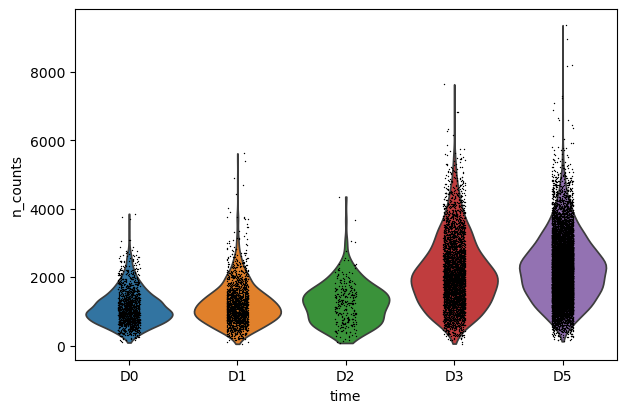

In [22]:
sc.pl.violin(filtered_adata, 'n_counts', groupby = 'time')

In [23]:
#print(filtered_adata.obs.groupby(['time'])[['n_counts','n_genes']].mean())

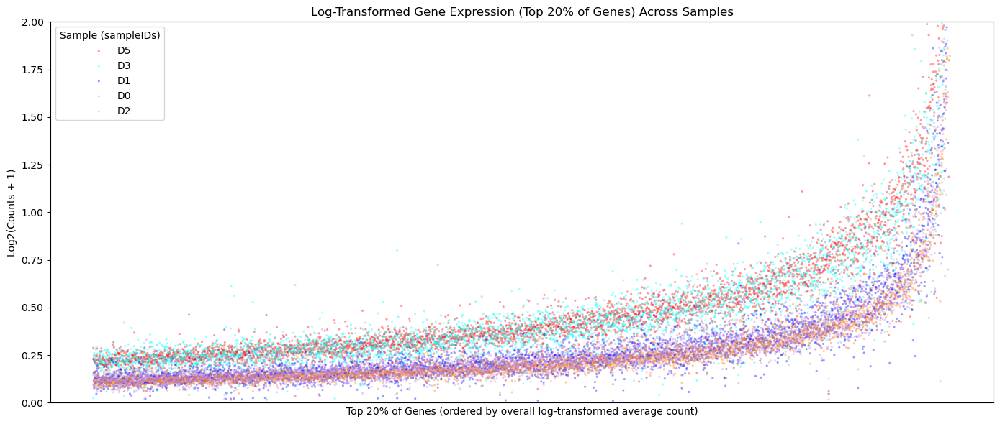

In [25]:
# expression per gene

gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["time"] = filtered_adata.obs["time"].values

average_counts = (
    gene_counts.groupby("time")
    .mean()
    .transpose()  # Genes as rows, samples as columns
)

log_transformed_counts = np.log2(average_counts + 1)

log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

x = np.arange(top_percent.shape[0])
genes = top_percent.index

times = filtered_adata.obs["time"].unique()
custom_colors = {
    "D0": "#ff7f0e",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    'D5': '#FF0000'}
    

plt.figure(figsize=(14, 6))
for sampleIDs in filtered_adata.obs["time"].unique():
    y = top_percent[sampleIDs].values
    plt.scatter(x, y, label=sampleIDs, s= 5, alpha=0.4, color=custom_colors.get(sampleIDs), edgecolors='none',marker='o')

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
plt.title(f"Log-Transformed Gene Expression (Top {percent_label}% of Genes) Across Samples")
plt.legend(title="Sample (sampleIDs)")
plt.ylim(0, 2)
#plt.xlim(0, 10000)
plt.xticks([], [])
plt.gca().invert_xaxis()
#plt.savefig('/home/tht38/spatial.python/rep2/rep2geneplot20.dpi1200.png', dpi = 1200)
plt.tight_layout()

In [202]:
# gene plot with rolling average line
gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["time"] = filtered_adata.obs["time"].values

average_counts = (
    gene_counts.groupby("time")
    .mean()
    .transpose()  # Genes as rows, samples as columns
)

log_transformed_counts = np.log2(average_counts + 1)

log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

x = np.arange(top_percent.shape[0])
genes = top_percent.index

#times = filtered_adata.obs["time"].unique()
times = ["D0", "D1", "D2", "D3", "D5"]
custom_colors = {
    "D0": "#0000ff",
    "D1": "#ff7f0e",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    'D5': '#FF0000'}
    


plt.figure(figsize=(14, 6), dpi = 1200)

for timepoint in times:
    y = top_percent[timepoint].rolling(
        window=100, center=True, min_periods=1
    ).mean()

    plt.plot(
        x,
        y,
        label=timepoint,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(timepoint)
    )

#plt.xlabel(f"Top {int(top_gene_fraction * 100)}% of Genes (ordered by mean z-score)")
#plt.ylabel("Z-score vs Muscle")
#plt.title("ProlifEpi vs Muscle across replicates")
plt.ylim(0, 2)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()

plt.tight_layout()
plt.show()


In [ ]:
# percentage of genes that a timepoint has the highest expression for

gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["sampleIDs"] = filtered_adata.obs["sampleIDs"].values

testingtimepoint = 'D1'

average_counts = (
    gene_counts.groupby("sampleIDs")
    .mean()
    .transpose()  # Genes as rows, samples as columns
)

is_highest = (average_counts[testingtimepoint] >
              average_counts.drop(columns=testingtimepoint).max(axis=1))

proportion_highest = is_highest.sum() / average_counts.shape[0]
print(f"Proportion of genes where {testingtimepoint} is higher than the others: {proportion_highest:.2%}")

In [ ]:
# percentage of genes where a timepoint has the lowest average expression

gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["sampleIDs"] = filtered_adata.obs["sampleIDs"].values

testingtimepoint = 'D1'

average_counts = (
    gene_counts.groupby("sampleIDs")
    .mean()
    .transpose()  # Genes as rows, samples as columns
)

is_lowest = (average_counts[testingtimepoint] <
             average_counts.drop(columns="Control inner all").min(axis=1))

proportion_lowest = is_lowest.sum() / average_counts.shape[0]

print(f"Proportion of genes where {testingtimepoint} has the lowest average expression: {proportion_lowest:.2%}")

#### Ki67- vs Ki67+, D0, epithelial

In [51]:
# ki67- vs ki67+ D0 only, epithelial only
keep_values = ["D0"]
adata_Verzi = adata_Verzi[adata_Verzi.obs['time'].isin(keep_values)].copy()

In [52]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]

In [28]:
filtered_adata = adata_Verzi[
    ((adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression'))
].copy()

In [ ]:
gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["Mki67+"] = filtered_adata.obs["Mki67+"].values

average_counts = (
    gene_counts.groupby("Mki67+")
    .mean()
    .transpose()  # Genes as rows, samples as columns
)

log_transformed_counts = np.log2(average_counts + 1)

log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

x = np.arange(top_percent.shape[0])
genes = top_percent.index

#ki67 = filtered_adata.obs["Mki67+"].unique()
custom_colors = {
    "D0": "#ff7f0e",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    'D5': '#FF0000'}
    

plt.figure(figsize=(14, 6))
for sampleIDs in filtered_adata.obs["Mki67+"].unique():
    y = top_percent[sampleIDs].values
    plt.scatter(x, y, label=sampleIDs, s= 5, alpha=0.4, color=custom_colors.get(sampleIDs), edgecolors='none',marker='o')

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
plt.title(f"Log-Transformed Gene Expression (Top {percent_label}% of Genes) Across Samples")
plt.legend(title="Sample (sampleIDs)")
plt.ylim(0, 2)
#plt.xlim(0, 10000)
plt.xticks([], [])
plt.gca().invert_xaxis()
#plt.savefig('/home/tht38/spatial.python/rep2/rep2geneplot20.epi.ki67compd0.png', dpi = 600)
plt.tight_layout()



In [136]:
# ki67- vs ki67+ D0 only, epithelial only
keep_values = ["D5"]
filtered_adata = filtered_adata[filtered_adata.obs['time'].isin(keep_values)].copy()

In [135]:
filtered_adata = adata_Verzi[
    ((adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression'))
].copy()

In [ ]:
gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["Mki67+"] = filtered_adata.obs["Mki67+"].values

average_counts = (
    gene_counts.groupby("Mki67+")
    .mean()
    .transpose()  # Genes as rows, samples as columns
)

log_transformed_counts = np.log2(average_counts + 1)

log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

x = np.arange(top_percent.shape[0])
genes = top_percent.index

#ki67 = filtered_adata.obs["Mki67+"].unique()
custom_colors = {
    "D0": "#ff7f0e",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    'D5': '#FF0000'}
    

plt.figure(figsize=(14, 6))
for sampleIDs in filtered_adata.obs["Mki67+"].unique():
    y = top_percent[sampleIDs].values
    plt.scatter(x, y, label=sampleIDs, s= 5, alpha=0.4, color=custom_colors.get(sampleIDs), edgecolors='none',marker='o')

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
plt.title(f"Log-Transformed Gene Expression (Top {percent_label}% of Genes) Across Samples")
plt.legend(title="Sample (sampleIDs)")
plt.ylim(0, 2)
#plt.xlim(0, 10000)
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.savefig('/home/tht38/spatial.python/rep2/rep2geneplot20.epi.ki67compd5.png', dpi = 600)
plt.tight_layout()



In [138]:
filtered_adata.obs

,n_counts,time,stromalregions,Epcam+,Vil1+,Mki67+
s_008um_00563_00699-1,2644.0,D5,NaN,high_expression,high_expression,low_expression
s_008um_00226_00670-1,956.0,D5,NaN,high_expression,high_expression,low_expression
s_008um_00241_00428-1,2147.0,D5,NaN,high_expression,high_expression,low_expression
s_008um_00388_00048-1,262.0,D5,NaN,low_expression,high_expression,low_expression
s_008um_00356_00057-1,250.0,D5,NaN,high_expression,low_expression,low_expression
...,...,...,...,...,...,...
s_008um_00655_00610-1,962.0,D5,NaN,high_expression,low_expression,low_expression
s_008um_00380_00086-1,66.0,D5,NaN,low_expression,high_expression,low_expression
s_008um_00349_00050-1,2027.0,D5,NaN,high_expression,low_expression,high_expression
s_008um_00399_00769-1,5429.0,D5,NaN,high_expression,high_expression,high_expression


### normalized

In [ ]:
# extraneous normalized analyses

In [ ]:
adata_Verzi

In [ ]:
adata_Verzi.obs

In [18]:
adata_Verzi = adata_Verzi[adata_Verzi.obs['n_counts'] > 40].copy()

In [21]:
sc.pp.filter_cells(adata_Verzi, min_genes=10)

/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/scanpy/preprocessing/_simple.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


In [22]:
sc.pp.normalize_per_cell(adata_subset, counts_per_cell_after=10**6)
sc.pp.log1p(adata_subset)
#sc.pp.scale(adata_subset)

/home/tht38/anaconda3/envs/newenv/lib/python3.13/functools.py:934: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


In [ ]:
sc.tl.pca(adata_subset)
sc.pp.neighbors(adata_subset, n_neighbors=100, n_pcs = 10)

In [ ]:
sc.tl.leiden(adata_subset, resolution=0.1)

In [ ]:
sc.tl.umap(adata_subset, random_state=1)

In [ ]:
adata_subset.obs

In [ ]:
sc.pl.umap(adata_subset, color=['leiden'])

In [25]:
#sc.pp.scale(adata_Verzi)

In [26]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Mki67+'] == 'high_expression') &
    ((adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression'))
].copy()

In [33]:
sc.set_figure_params(dpi_save = 600)

In [ ]:
genes = [
    "Ada", "Slc28a2", "Nt5e", "Cyp3a11", "Cubn", "Slc5a4b", "Slc5a4a", "Rdh7",
    "Reg3a", "Car4", "Ms4a18", "Ces1f", "Hist1h1b", "Top2a", "Ccna2", "Mki67",
    "Clca3a1", "Fam151a", "Slc52a3", "Mep1a", "Tmigd1", "Fabp6", "Lamc2", "Areg",
    "Sprr2a3", "Lyz1", "Defa21", "Ang4", "Jchain", "Gzma", "Gbp2b", "Mzb1", "Saa3",
    "Mmp12", "Cxcl19", "Mmrn1", "Ccl11", "Ccl21a", "Ccl19", "Lyz2", "C3", "C4b",
    "Cxcl13", "Vip", "Snap25", "Calb2", "Tubb3", "Actg2", "Des", "Cnn1", "Pgm5", "Synm"
]
sc.pl.dotplot(adata_Verzi, 

In [ ]:
sc.pl.dotplot(filtered_adata, ['Cad', 'Dhodh', 'Umps', 'Nme1', 'Nme2', 'Ctps'], groupby = 'time', standard_scale = 'var', save = 'pyrimidine.png')

In [ ]:
sc.pl.dotplot(filtered_adata, ['Prps1', 'Prps2', 'Ppat', 'Gart', 'Pfas', 'Paics', 'Adsl', 'Atic', 'Impdh1', 'Gmps', 'Adss', 'Adsl', 'Ak1', 'Nme1', 'Nme2'], groupby = 'time', standard_scale='var', save = 'purine.png')

In [20]:
keep_values = ["D0", 'D3']
adata_Verzi = adata_Verzi[adata_Verzi.obs['time'].isin(keep_values)].copy()

In [32]:
keep_values = ["Day 0 crypt", "Day 0 tip C4", "Day 0 Mature epi C1", "Day 0 Young villus C8", "Day 0 junction C7", "D0 Villus stroma", "D0 Intercrypt", "D0 Subcrypt", "Day 3 Crypt C5", "Day 3 intercrypt", "Day 3 Junction C10", "Day 3 subcrypt", "Day 3 tip", "day 3 villus", "Day 3 Villus epi C13"]
adata_Verzi = adata_Verzi[adata_Verzi.obs['stromalregions'].isin(keep_values)].copy()

In [73]:
keep_values = ["D0", 'D3']
adata_Verzi2 = adata_Verzi2[adata_Verzi2.obs['time'].isin(keep_values)].copy()
keep_values = ["Day 0 crypt", "Day 0 tip C4", "Day 0 Mature epi C1", "Day 0 Young villus C8", "Day 0 junction C7", 
               "D0 Villus stroma", "D0 Intercrypt", "D0 Subcrypt", "Day 3 Crypt C5", "Day 3 intercrypt", "Day 3 Junction C10", 
               "Day 3 subcrypt", "Day 3 tip", "day 3 villus", "Day 3 Villus epi C13"]
adata_Verzi2 = adata_Verzi2[adata_Verzi2.obs['stromalregions'].isin(keep_values)].copy()

In [15]:
adata_Verzi

AnnData object with n_obs × n_vars = 123640 × 19059
    obs: 'n_counts', 'time', 'stromalregions'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'log1p'

In [ ]:
genes = ["B2m", "Hprt",
    "Tubb5", "Hmbs", "Pgk1", "Ppia", "Ywhaz", "Tbp"
]

sc.pl.dotplot(adata_Verzi, genes, groupby = 'time', standard_scale = 'var')
sc.pl.dotplot(adata_Verzi, genes, groupby = 'time')
#sc.pl.dotplot(adata_Verzi2, genes, groupby = 'time', standard_scale = 'var')
#sc.pl.dotplot(adata_Verzi2, genes, groupby = 'time')


In [34]:
sc.set_figure_params(dpi=300, figsize=(4,4), fontsize=8)

In [ ]:
fts = ['Tgfb1','Acvr1b', 'Tgfbr2','Tgfbr1', 'Acvr1','Acvr1c', 'Tgfb2','Tgfb3']
sc.pl.dotplot(adata_Verzi, fts, groupby = 'time')
fts = ['Tgfb1','Acvr1b', 'Tgfbr2','Tgfbr1', 'Acvr1']
sc.pl.dotplot(adata_Verzi, fts, groupby = 'time', save = 'retgfb.png')

In [ ]:
fts = ['Col4a1', 'Itga3', 'Itgb1', 'Sdc1', 'Col1a1', 'Col1a2', 'Sdc4', 
         'Itga1', 'Itga2', 'Itga9', 'Cd44', 'Col6a1', 'Itga11', 'Col6a3', 
         'Col6a2', 'Col4a2', 'Col6a4', 'Col4a5', 'Col4a6', 'Col6a5', 
         'Itgav', 'Itgb8', 'Col4a3', 'Col9a3', 'Col4a4', 'Col2a1']
sc.pl.dotplot(adata_Verzi, fts, groupby = 'time')
fts = ['Col4a1', 'Sdc1', 'Col1a1', 'Col1a2']
sc.pl.dotplot(adata_Verzi, fts, groupby = 'time', dot_max = 0.65, save = 'collagen.png')


In [ ]:
sc.pl.matrixplot(adata_Verzi, fts, groupby='time', cmap = 'bwr')

In [ ]:
fts = ["Aldh1a1", "Aldh1a2", "Aldh1a3", "Rara", "Rxra", "Crabp2", "Rxrb", "Rarb", "Rarg", "Rorb"]
sc.pl.dotplot(adata_Verzi, fts, groupby = 'time')
fts = ['Aldh1a1', 'Rara', 'Rxra', 'Rxrb']
sc.pl.dotplot(adata_Verzi, fts, groupby = 'time', save = 'RA.png')

In [ ]:
fts = ["Ptges3", "Ptger4", "Ptges2", "Ptger2", "Ptger1", "Ptges", "Ptger3", 
        "Prxl2b", "Ptgfr", "Ptgis", "Ptgir", "Tbxas1", "Tbxa2r"]
sc.pl.dotplot(adata_Verzi, fts, groupby = 'time')
fts = ['Ptges3', 'Ptges2', 'Ptges', 'Ptger4', 'Ptger2']
sc.pl.dotplot(adata_Verzi, fts, groupby = 'time', save = 'prostaglandin.png')

In [ ]:

main = ['Tgfb1', 'Mif', 'Nrg1', 'C3', 'Areg', 'Vegfa', 'Angptl2', 'Tnf', 'Lgals9', 'Il6', 'Igf1', 'Col4a1', 'Tnc', 'Ptges3', 'Aldh1a1']
sc.pl.dotplot(adata_Verzi, main, groupby = 'time', standard_scale = 'var')

In [ ]:
fts = ['Tgfb1', 'Mif', 'Nrg1', 'C3', 'Areg', 'Vegfa', 'Angptl2', 'Tnf', 'Lgals9', 'Igf1', 'Col4a1', 'Tnc']
sc.pl.dotplot(adata_Verzi, fts, groupby = 'time', standard_scale = 'var',  dot_max = 0.65, save = 'summary.png')

In [ ]:
sc.pl.matrixplot(adata_Verzi, main, groupby = 'time', standard_scale = 'var', cmap = 'bwr')

### proportion of ki67+ cells by timepoint

In [17]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]


filtered_adata = adata_Verzi[
    ((adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression'))
].copy()

In [28]:
filtered_adata.obs

,n_counts,time,stromalregions,Epcam+,Vil1+,Mki67+
s_008um_00547_00611-1,951.0,D3,Day 3 Villus epi C13,high_expression,high_expression,low_expression
s_008um_00693_00628-1,539.0,D1,NaN,high_expression,high_expression,low_expression
s_008um_00137_00810-1,172.0,D2,NaN,high_expression,low_expression,low_expression
s_008um_00819_00322-1,945.0,D3,Day 3 tip,high_expression,low_expression,low_expression
s_008um_00154_00449-1,411.0,D1,NaN,high_expression,high_expression,low_expression
...,...,...,...,...,...,...
s_008um_00810_00777-1,1482.0,NaN,NaN,high_expression,high_expression,high_expression
s_008um_00655_00060-1,1390.0,D3,Day 3 Crypt C5,high_expression,low_expression,high_expression
s_008um_00565_00596-1,564.0,D3,Day 3 Villus epi C13,high_expression,high_expression,low_expression
s_008um_00172_00448-1,603.0,D1,NaN,high_expression,low_expression,low_expression


In [29]:
# Group by 'time' and count the number of cells with 'Mki67+' == 'high'
high_counts = filtered_adata.obs[filtered_adata.obs['Mki67+'] == 'high_expression'].groupby('time').size()

# Count total cells in each 'time' group
total_counts = filtered_adata.obs.groupby('time').size()

# Calculate proportion
proportion_high = (high_counts / total_counts).fillna(0)

# Convert to DataFrame
proportion_df = proportion_high.reset_index()
proportion_df.columns = ['time', 'proportion_Mki67_high']

print(proportion_df)

  time  proportion_Mki67_high
0   D0               0.027368
1   D1               0.040107
2   D2               0.024367
3   D3               0.076709
4   D5               0.155356


In [36]:
count1 = ((filtered_adata.obs['time'] == 'D3') & (filtered_adata.obs['Mki67+'] == 'high_expression')).sum()
print(count1)

4227


In [37]:
(filtered_adata.obs['time'] == 'D3').sum()

np.int64(55104)

### part 2 statistics and muscle

In [ ]:
#hypertranscription across replicates; using L2FC or z-score to normalize to muscle of same tissue or D0 of same replicate
## for reviewers mostly

In [126]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]


filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Mki67+'] == 'high_expression') &
    ((adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression'))
].copy()

/tmp/ipykernel_69344/647576352.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]


In [ ]:
#baseline

gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["time"] = filtered_adata.obs["time"].values

average_counts = (
    gene_counts.groupby("time")
    .mean()
    .transpose()  # Genes as rows, samples as columns
)

log_transformed_counts = np.log2(average_counts + 1)

log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

x = np.arange(top_percent.shape[0])
genes = top_percent.index

custom_colors = {
    "D0": "#ff7f0e",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    'D5': '#FF0000'}
    

plt.figure(figsize=(14, 6))
for sampleIDs in filtered_adata.obs["time"].unique():
    y = top_percent[sampleIDs].values
    plt.scatter(x, y, label=sampleIDs, s= 5, alpha=0.4, color=custom_colors.get(sampleIDs), edgecolors='none',marker='o')

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
plt.title(f"Log-Transformed Gene Expression (Top {percent_label}% of Genes) Across Samples")
plt.legend(title="Sample (sampleIDs)")
plt.ylim(0, 2)
#plt.xlim(0, 10000)
plt.xticks([], [])
plt.gca().invert_xaxis()
#plt.savefig('/home/tht38/spatial.python/rep2/rep2geneplot20.dpi1200.png', dpi = 1200)
plt.tight_layout()



In [24]:
from scipy.stats import wilcoxon

d3 = top_percent["D3"]
d5 = top_percent["D5"]
d0 = top_percent["D0"]

# 
stat1, pval1 = wilcoxon(d3, d0, alternative='greater')

# 
stat2, pval2 = wilcoxon(d5, d0, alternative='greater')

print('D3 > D0', f"Wilcoxon statistic: {stat1}, p-value: {pval1}")

print('D5 > D0', f"Wilcoxon statistic: {stat2}, p-value: {pval2}")

D3 > D0 Wilcoxon statistic: 7099322.0, p-value: 0.0
D5 > D0 Wilcoxon statistic: 7143460.0, p-value: 0.0


In [27]:
from scipy.stats import wilcoxon

d3 = average_counts["D3"]
d5 = average_counts["D5"]
d0 = average_counts["D0"]

# 
stat1, pval1 = wilcoxon(d3, d0, alternative='greater')

# 
stat2, pval2 = wilcoxon(d5, d0, alternative='greater')

print('D3 > D0', f"Wilcoxon statistic: {stat1}, p-value: {pval1}")

print('D5 > D0', f"Wilcoxon statistic: {stat2}, p-value: {pval2}")



d3 = log_transformed_counts["D3"]
d5 = log_transformed_counts["D5"]
d0 = log_transformed_counts["D0"]

# 
stat1, pval1 = wilcoxon(d3, d0, alternative='greater')

# 
stat2, pval2 = wilcoxon(d5, d0, alternative='greater')

print('D3 > D0', f"Wilcoxon statistic: {stat1}, p-value: {pval1}")

print('D5 > D0', f"Wilcoxon statistic: {stat2}, p-value: {pval2}")

D3 > D0 Wilcoxon statistic: 156353984.0, p-value: 0.0
D5 > D0 Wilcoxon statistic: 160623707.0, p-value: 0.0
D3 > D0 Wilcoxon statistic: 156473022.0, p-value: 0.0
D5 > D0 Wilcoxon statistic: 160661176.0, p-value: 0.0


In [42]:
d3 = log_transformed_counts["D3"]
d5 = log_transformed_counts["D5"]
d0 = log_transformed_counts["D0"]

# top_percent  ,  log_transformed_counts

# 
stat1, pval1 = wilcoxon(d3, d5, alternative='greater')

# 
stat2, pval2 = wilcoxon(d5, d3, alternative='greater')

print('D3 > D5', f"Wilcoxon statistic: {stat1}, p-value: {pval1}")

print('D5 > D3', f"Wilcoxon statistic: {stat2}, p-value: {pval2}")

D3 > D5 Wilcoxon statistic: 91153473.0, p-value: 0.013701515292022839
D5 > D3 Wilcoxon statistic: 87839187.0, p-value: 0.9862984847079772


In [ ]:
ir_mean = (rep1 + rep2) / 2
stat, pval = wilcoxon(ir_mean, nonir, alternative='greater')

print(stat, pval)

In [31]:
log_transformed_counts

time,D0,D1,D2,D3,D5,overall_mean
Xkr4,0.000686,0.001378,0.000000,0.001755,0.004077,0.001579
Rp1,0.000686,0.000000,0.000000,0.000000,0.000490,0.000235
Sox17,0.006164,0.010303,0.017023,0.018841,0.009440,0.012354
Lypla1,0.497728,0.645041,0.606210,0.772213,1.094487,0.723136
Tcea1,0.380306,0.346938,0.410750,0.696002,0.563190,0.479437
...,...,...,...,...,...,...
mt-Nd4,1.353428,1.526346,1.582106,1.871721,2.164927,1.699705
mt-Nd5,1.695680,1.881720,1.997858,2.244745,2.563107,2.076622
mt-Nd6,0.658551,0.732271,0.758213,0.945971,0.818671,0.782735
mt-Cytb,3.050413,3.322617,3.292956,3.711205,4.087252,3.492889


In [32]:
from scipy.stats import friedmanchisquare

res = friedmanchisquare(log_transformed_counts["D0"], log_transformed_counts["D1"], log_transformed_counts["D2"], log_transformed_counts["D3"], log_transformed_counts["D5"])
res.statistic, res.pvalue

(np.float64(22280.2931878058), np.float64(0.0))

#### muscle layer included

In [ ]:
# labeling cells
mask = (
    (adata_Verzi.obs['Mki67+'] == 'high_expression') &
    (
        (adata_Verzi.obs['Epcam+'] == 'high_expression') |
        (adata_Verzi.obs['Vil1+'] == 'high_expression')
    )
)

adata_Verzi.obs['ProlifEpi'] = 'No'
adata_Verzi.obs.loc[mask, 'ProlifEpi'] = 'Yes'

In [74]:
adata_Verzi.obs

,cell_numeric_id,time,GraphBased,Recluster2.16,CC.CellType,n_counts,Epcam+,Vil1+,Mki67+,ProlifEpi
cellid_000290166-1,290166,D3,Cluster 5,NaN,NaN,1319.0,low_expression,low_expression,low_expression,No
cellid_000290167-1,290167,D3,Cluster 5,NaN,NaN,691.0,low_expression,low_expression,low_expression,No
cellid_000290169-1,290169,D0,Cluster 1,NaN,Villus epithelium,1775.0,high_expression,high_expression,low_expression,No
cellid_000290170-1,290170,D0,Cluster 5,NaN,NaN,1277.0,low_expression,low_expression,low_expression,No
cellid_000290172-1,290172,D0,Cluster 11,NaN,Crypt stroma,675.0,low_expression,low_expression,low_expression,No
...,...,...,...,...,...,...,...,...,...,...
cellid_000557536-1,557536,D1,Cluster 10,NaN,Crypt stroma,85.0,high_expression,low_expression,low_expression,No
cellid_000557542-1,557542,D1,Cluster 1,NaN,Villus epithelium,1637.0,high_expression,high_expression,low_expression,No
cellid_000557546-1,557546,D1,Cluster 17,NaN,Villus stroma,1015.0,high_expression,low_expression,low_expression,No
cellid_000557549-1,557549,D1,Cluster 7,NaN,Villus epithelium,2375.0,high_expression,high_expression,low_expression,No


In [129]:
adata_Verzi.obs['ProlifEpi'].value_counts()

ProlifEpi
No     135083
Yes     17475
Name: count, dtype: int64

In [130]:
filtered_adata = adata_Verzi[
    ((adata_Verzi.obs['ProlifEpi'] == 'Yes') | (adata_Verzi.obs['GraphBased'] == 'Cluster 5'))
].copy()

In [131]:
filtered_adata.obs

,cell_numeric_id,time,GraphBased,Recluster2.16,CC.CellType,n_counts,Epcam+,Vil1+,Mki67+,ProlifEpi
cellid_000290166-1,290166,D3,Cluster 5,NaN,NaN,1319.0,low_expression,low_expression,low_expression,No
cellid_000290167-1,290167,D3,Cluster 5,NaN,NaN,691.0,low_expression,low_expression,low_expression,No
cellid_000290170-1,290170,D0,Cluster 5,NaN,NaN,1277.0,low_expression,low_expression,low_expression,No
cellid_000290174-1,290174,D3,Cluster 5,NaN,NaN,837.0,high_expression,low_expression,low_expression,No
cellid_000290175-1,290175,D3,Cluster 2,Cluster 13,Crypt epithelium,1197.0,high_expression,high_expression,high_expression,Yes
...,...,...,...,...,...,...,...,...,...,...
cellid_000557382-1,557382,D1,Cluster 5,NaN,NaN,741.0,low_expression,low_expression,low_expression,No
cellid_000557383-1,557383,D1,Cluster 12,NaN,Junction,1580.0,high_expression,low_expression,high_expression,Yes
cellid_000557448-1,557448,D1,Cluster 5,NaN,NaN,783.0,low_expression,low_expression,low_expression,No
cellid_000557528-1,557528,D1,Cluster 5,NaN,NaN,1043.0,low_expression,low_expression,low_expression,No


In [132]:
filtered_adata = filtered_adata[~(
    (filtered_adata.obs["GraphBased"] == "Cluster 5") &
    (filtered_adata.obs["ProlifEpi"] == "Yes")
)].copy()

In [83]:
filtered_adata.obs

,cell_numeric_id,time,GraphBased,Recluster2.16,CC.CellType,n_counts,Epcam+,Vil1+,Mki67+,ProlifEpi
cellid_000290166-1,290166,D3,Cluster 5,NaN,NaN,1319.0,low_expression,low_expression,low_expression,No
cellid_000290167-1,290167,D3,Cluster 5,NaN,NaN,691.0,low_expression,low_expression,low_expression,No
cellid_000290170-1,290170,D0,Cluster 5,NaN,NaN,1277.0,low_expression,low_expression,low_expression,No
cellid_000290174-1,290174,D3,Cluster 5,NaN,NaN,837.0,high_expression,low_expression,low_expression,No
cellid_000290175-1,290175,D3,Cluster 2,Cluster 13,Crypt epithelium,1197.0,high_expression,high_expression,high_expression,Yes
...,...,...,...,...,...,...,...,...,...,...
cellid_000557382-1,557382,D1,Cluster 5,NaN,NaN,741.0,low_expression,low_expression,low_expression,No
cellid_000557383-1,557383,D1,Cluster 12,NaN,Junction,1580.0,high_expression,low_expression,high_expression,Yes
cellid_000557448-1,557448,D1,Cluster 5,NaN,NaN,783.0,low_expression,low_expression,low_expression,No
cellid_000557528-1,557528,D1,Cluster 5,NaN,NaN,1043.0,low_expression,low_expression,low_expression,No


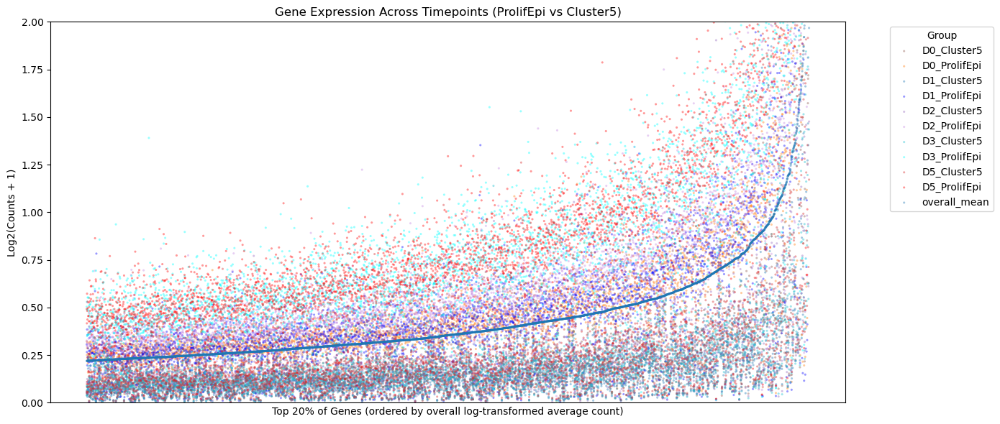

In [84]:
# Convert to DataFrame
gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)

# Add metadata
gene_counts["time"] = filtered_adata.obs["time"].values
gene_counts["ProlifEpi"] = filtered_adata.obs["ProlifEpi"].values
gene_counts["GraphBased"] = filtered_adata.obs["GraphBased"].values

# Create combined group label
gene_counts["group"] = None

gene_counts.loc[gene_counts["ProlifEpi"] == "Yes", "group"] = (
    gene_counts["time"].astype(str) + "_ProlifEpi"
)
gene_counts.loc[gene_counts["GraphBased"] == "Cluster 5", "group"] = (
    gene_counts["time"].astype(str) + "_Cluster5"
)

# Keep only rows that belong to either group
gene_counts = gene_counts[gene_counts["group"].notna()]

# Keep only numeric gene expression columns
gene_only = gene_counts.drop(columns=["time", "ProlifEpi", "GraphBased", "group"], errors="ignore")

# Compute averages
average_counts = (
    gene_only.groupby(gene_counts["group"])
    .mean()
    .transpose()
)

# Log transform
log_transformed_counts = np.log2(average_counts + 1)

# Rank genes
log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

# Plot
x = np.arange(top_percent.shape[0])
genes = top_percent.index

# Expanded color scheme (pair colors per timepoint)
custom_colors = {
    "D0_ProlifEpi": "#ff7f0e",
    "D0_Cluster5": "#8c564b",
    "D1_ProlifEpi": "#0000ff",
    "D1_Cluster5": "#1f77b4",
    "D2_ProlifEpi": "#C589E2",
    "D2_Cluster5": "#9467bd",
    "D3_ProlifEpi": "#00FFFF",
    "D3_Cluster5": "#17becf",
    "D5_ProlifEpi": "#FF0000",
    "D5_Cluster5": "#d62728",
}

plt.figure(figsize=(14, 6))

for group in top_percent.columns:
    y = top_percent[group].values
    plt.scatter(
        x, y,
        label=group,
        s=5,
        alpha=0.4,
        color=custom_colors.get(group),
        edgecolors='none'
    )

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
plt.title(f"Gene Expression Across Timepoints (ProlifEpi vs Cluster5)")
plt.legend(title="Group", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylim(0, 2)
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()

In [ ]:
# Convert to DataFrame
gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)

# Add metadata
gene_counts["time"] = filtered_adata.obs["time"].values
gene_counts["ProlifEpi"] = filtered_adata.obs["ProlifEpi"].values
gene_counts["GraphBased"] = filtered_adata.obs["GraphBased"].values

# Create combined group label
gene_counts["group"] = None

gene_counts.loc[gene_counts["ProlifEpi"] == "Yes", "group"] = (
    gene_counts["time"].astype(str) + "_ProlifEpi"
)
gene_counts.loc[gene_counts["GraphBased"] == "Cluster 5", "group"] = (
    gene_counts["time"].astype(str) + "_Cluster5"
)

# Keep only rows that belong to either group
gene_counts = gene_counts[gene_counts["group"].notna()]

# Keep only numeric gene expression columns
gene_only = gene_counts.drop(columns=["time", "ProlifEpi", "GraphBased", "group"], errors="ignore")

# Compute averages
average_counts = (
    gene_only.groupby(gene_counts["group"])
    .mean()
    .transpose()
)

# Log transform
log_transformed_counts = np.log2(average_counts + 1)

# Rank genes
log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

# Plot
x = np.arange(top_percent.shape[0])
genes = top_percent.index

# Expanded color scheme (pair colors per timepoint)
custom_colors = {
    "D0_ProlifEpi": "#ff7f0e",
    "D0_Cluster5": "#8c564b",
    "D1_ProlifEpi": "#0000ff",
    "D1_Cluster5": "#1f77b4",
    "D2_ProlifEpi": "#C589E2",
    "D2_Cluster5": "#9467bd",
    "D3_ProlifEpi": "#00FFFF",
    "D3_Cluster5": "#17becf",
    "D5_ProlifEpi": "#FF0000",
    "D5_Cluster5": "#d62728",
}

top_percent = top_percent.drop(columns=["overall_mean"])

plt.figure(figsize=(14, 6))

window = 100  # adjust depending on number of genes

for group in top_percent.columns:
    y = top_percent[group].rolling(window, center=True, min_periods=1).mean()
    plt.plot(
        x, y,
        label=group,
        linewidth=2,
        alpha=0.9,
        color=custom_colors.get(group)
    )

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
plt.title(f"Gene Expression Across Timepoints (ProlifEpi vs Cluster5)")
plt.legend(title="Group", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylim(0, 2)
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()

In [ ]:
plt.figure(figsize=(14, 6))

window = 100  # adjust depending on number of genes

for group in top_percent.columns:
    y = top_percent[group].rolling(window, center=True, min_periods=1).mean()

    linestyle = "-" if "ProlifEpi" in group else "--"

    plt.plot(
        x, y,
        label=group,
        linewidth=2,
        linestyle=linestyle,
        color=custom_colors.get(group)
    )

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
#plt.title(f"Gene Expression Across Timepoints (ProlifEpi vs Cluster5)")
plt.legend(title="Group", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylim(0, 2)
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()

In [ ]:
# L2FC proliferating against muscle cells per timepoint

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

prolif_cells = filtered_adata[filtered_adata.obs['ProlifEpi'] == 'Yes']

gene_counts = pd.DataFrame(prolif_cells.X.toarray(), columns=prolif_cells.var.index)
gene_counts["time"] = prolif_cells.obs["time"].values

# Average per gene per timepoint
average_counts = gene_counts.groupby("time").mean().transpose()  # genes x timepoints


muscle_cells = filtered_adata[filtered_adata.obs['GraphBased'] == 'Cluster 5']

muscle_counts = pd.DataFrame(muscle_cells.X.toarray(), columns=muscle_cells.var.index)
muscle_counts["time"] = muscle_cells.obs["time"].values

# Average per gene per timepoint for muscle cells
control_mean = muscle_counts.groupby("time").mean().transpose()  # genes x timepoints

# L2FC (log2(avg) - log2(control))
# Log2 transform
log_counts = np.log2(average_counts + 1)
log_control = np.log2(control_mean + 1)   # question for what to +1 or 0.000001

# Subtract control per timepoint
scaled_counts = log_counts - log_control



scaled_counts["overall_mean"] = scaled_counts.mean(axis=1)
sorted_scaled_counts = scaled_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_scaled_counts.iloc[:int(sorted_scaled_counts.shape[0] * top_gene_fraction)]


x = np.arange(top_percent.shape[0])
genes = top_percent.index
times = filtered_adata.obs["time"].unique()
custom_colors = {
    "D0": "#ff7f0e",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D5": "#FF0000"
}

plt.figure(figsize=(14, 6))

for sampleID in times:
    y = top_percent[sampleID].values
    plt.scatter(
        x, y,
        label=sampleID,
        s=5,
        alpha=0.4,
        color=custom_colors.get(sampleID),
        edgecolors='none',
        marker='o'
    )

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall mean scaled counts)")
plt.ylabel("Log2(Prolif Counts / Muscle Counts)")
plt.title(f"Raw counts L2FC Proliferating Cells against Muscle cells")
plt.legend(title="Timepoint")
plt.ylim(-0.5, 8)  # Adjust based on observed scaled values
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(14, 6))

window = 100  # adjust depending on number of genes

for sampleID in times:
    y = top_percent[sampleID].rolling(window, center=True, min_periods=1).mean()
    plt.plot(
        x, y,
        label=sampleID,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(sampleID)
    )

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall mean scaled counts)")
plt.ylabel("Log2(Prolif Counts / Muscle Counts)")
plt.title(f"Raw counts L2FC Proliferating Cells against Muscle cells")
plt.legend(title="Timepoint")
#plt.ylim(0, 2)
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [162]:
from scipy.stats import wilcoxon

data_for_test = top_percent[times]  # shape: genes x timepoints

stat, p_value = wilcoxon(data_for_test['D3'], data_for_test['D0'], alternative = 'greater')
print(f"statistic={stat}, p-value={p_value}")

statistic=158144545.0, p-value=0.0


In [ ]:
# z-score with muscle cells as 'population' control

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

prolif_cells = filtered_adata[filtered_adata.obs['ProlifEpi'] == 'Yes']

# Convert sparse matrix to dense
gene_counts = pd.DataFrame(prolif_cells.X.toarray(), columns=prolif_cells.var.index)
gene_counts["time"] = prolif_cells.obs["time"].values

# Average per gene per timepoint
average_counts = gene_counts.groupby("time").mean().transpose()  # genes x timepoints

# muscle as internal control
muscle_cells = filtered_adata[filtered_adata.obs['GraphBased'] == 'Cluster 5']

muscle_counts = pd.DataFrame(muscle_cells.X.toarray(), columns=muscle_cells.var.index)
muscle_counts["time"] = muscle_cells.obs["time"].values

# Mean and std per gene per timepoint
muscle_mean = muscle_counts.groupby("time").mean().transpose()
muscle_std = muscle_counts.groupby("time").std().transpose()

# Avoid division by zero
muscle_std.replace(0, 1, inplace=True)

# z-score normalization to muscle cell control
z_scores = (average_counts - muscle_mean) / muscle_std

# select top percent of genes to include
z_scores["overall_mean"] = z_scores.mean(axis=1)
sorted_z_scores = z_scores.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_z_scores.iloc[:int(sorted_z_scores.shape[0] * top_gene_fraction)]

# plotting
x = np.arange(top_percent.shape[0])
genes = top_percent.index
times = filtered_adata.obs["time"].unique()

custom_colors = {
    "D0": "#ff7f0e",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D5": "#FF0000"
}

plt.figure(figsize=(14, 6))

for sampleID in times:
    y = top_percent[sampleID].values
    plt.scatter(
        x, y,
        label=sampleID,
        s=5,
        alpha=0.4,
        color=custom_colors.get(sampleID),
        edgecolors='none',
        marker='o'
    )

percent_label = int(top_gene_fraction * 100)

plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall z-score)")
plt.ylabel("Z-score relative to Muscle Cells")
plt.title(f"Proliferating Cells Z-score vs Muscle Cells")
plt.legend(title="Timepoint")
plt.ylim(0, 7)  
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(14, 6))

window = 100  # adjust depending on number of genes

for sampleID in times:
    y = top_percent[sampleID].rolling(window, center=True, min_periods=1).mean()
    plt.plot(
        x, y,
        label=sampleID,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(sampleID)
    )

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall z-score)")
plt.ylabel("Z-score relative to Muscle Cells")
plt.title(f"Proliferating Cells Z-score vs Muscle Cells")
plt.legend(title="Timepoint")
plt.ylim(0, 7)  
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [170]:
data_for_test = top_percent[times]  # shape: genes x timepoints

from scipy.stats import wilcoxon

# Example: compare D0 vs D1
stat, p_value = wilcoxon(data_for_test['D1'], data_for_test['D0'], alternative = 'greater')
print(f"Wilcoxon test D0 vs D1: statistic={stat}, p-value={p_value}")

Wilcoxon test D0 vs D1: statistic=5191587.0, p-value=5.733629046522578e-117


#### cross rep / z-score

In [7]:
adata = sc.read_10x_h5('/scratch/tht38/rep2segmentation/filtered_feature_cell_matrix.h5')
adata.var_names_make_unique()

sample_info = pd.read_csv("/scratch/tht38/rep2segmentation/SegTimepoints.csv", index_col=0)
adata.obs["time"] = sample_info["Timepoints"].reindex(adata.obs.index)

sample_info = pd.read_csv("/scratch/tht38/rep2segmentation/SegGraphBased.csv", index_col=0)
adata.obs["GraphBased"] = sample_info["Graph-based"].reindex(adata.obs.index)

adata.obs['n_counts'] = adata.X.sum(1).A1

adata = adata[adata.obs['n_counts'] > 40].copy()

adata = adata[~adata.obs["time"].isna()]  # Remove NaNs

adata_rep2 = adata

del adata

/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [8]:
adata_Verzi = sc.read_10x_h5('/home/tht38/spatial.python/rep1/filtered_feature_bc_matrix.h5')
adata_Verzi.obs['n_counts'] = adata_Verzi.X.sum(1).A1
adata_Verzi.var_names_make_unique()

sample_info = pd.read_csv("/home/tht38/spatial.python/rep1/Rep1barcodes_timepoints all tissue.csv", index_col=0)
adata_Verzi.obs["time"] = sample_info["timepoints all tissue"].reindex(adata_Verzi.obs.index)

sample_info = pd.read_csv("/home/tht38/spatial.python/rep1/Graph.Based.csv", index_col=0)
adata_Verzi.obs["graphbased"] = sample_info["Graph-based"].reindex(adata_Verzi.obs.index)

adata_Verzi.obs["time"] = adata_Verzi.obs["time"].replace({
    "control all ": "Non-IR 1",
    'Control inner all':'Non-IR 2',
    'IR--D1 all': 'D1',
    'IR-D3 all':'D3',
    "IR-D5 all": "D5"
})

adata_Verzi.obs['time'] = adata_Verzi.obs['time'].astype('category')

adata_Verzi.obs['time'] = adata_Verzi.obs['time'].cat.reorder_categories(['Non-IR 1', 'Non-IR 2', 'D1', 'D3', 'D5'], ordered=True)

adata_Verzi = adata_Verzi[adata_Verzi.obs['n_counts'] > 40].copy()

adata_Verzi = adata_Verzi[~adata_Verzi.obs["time"].isna()]  # Remove NaNs

adata_rep1 = adata_Verzi

del adata_Verzi


/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [9]:
adata = sc.read_10x_h5('/home/tht38/spatial.python/rep3/filtered_feature_bc_matrix.h5')
adata.var_names_make_unique()

sample_info = pd.read_csv("/home/tht38/spatial.python/rep3/Rep 3 Timepoints.csv", index_col=0)
adata.obs["time"] = sample_info["Timepoints"].reindex(adata.obs.index)

sample_info = pd.read_csv("/home/tht38/spatial.python/rep3/Graph-Based.csv", index_col=0)
adata.obs["GraphBased"] = sample_info["Graph-based"].reindex(adata.obs.index)

adata.obs['n_counts'] = adata.X.sum(1).A1

adata = adata[adata.obs['n_counts'] > 40].copy()

adata = adata[~adata.obs["time"].isna()]  # Remove NaNs

adata_rep3 = adata

del adata

/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [10]:
adata = sc.read_10x_h5('/home/tht38/spatial.python/rep3/filtered_feature_bc_matrix.h5')
adata.var_names_make_unique()

sample_info = pd.read_csv("/home/tht38/spatial.python/rep3/Rep 3 Timepoints.csv", index_col=0)
adata.obs["time"] = sample_info["Timepoints"].reindex(adata.obs.index)

sample_info = pd.read_csv("/home/tht38/spatial.python/rep3/Graph-Based.csv", index_col=0)
adata.obs["GraphBased"] = sample_info["Graph-based"].reindex(adata.obs.index)

adata.obs['n_counts'] = adata.X.sum(1).A1

adata = adata[adata.obs['n_counts'] > 40].copy()

adata = adata[~adata.obs["time"].isna()]  # Remove NaNs

adata_rep3 = adata

del adata

/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [11]:
adata = sc.read_10x_h5('/home/tht38/spatial.python/rep4/filtered_feature_bc_matrix.h5')
adata.var_names_make_unique()

sample_info = pd.read_csv("/home/tht38/spatial.python/rep4/Rep 4 Timepoints.csv", index_col=0)
adata.obs["time"] = sample_info["Timepoints"].reindex(adata.obs.index)

sample_info = pd.read_csv("/home/tht38/spatial.python/rep4/Graph-Based.csv", index_col=0)
adata.obs["GraphBased"] = sample_info["Graph-based"].reindex(adata.obs.index)

adata.obs['n_counts'] = adata.X.sum(1).A1

adata = adata[adata.obs['n_counts'] > 40].copy()

adata = adata[~adata.obs["time"].isna()]  # Remove NaNs

adata_rep4 = adata

del adata

/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/anndata/_core/anndata.py:1776: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [12]:
adata_rep1.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep1[:, 'Epcam'].X]
adata_rep1.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep1[:, 'Vil1'].X]
adata_rep1.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep1[:, 'Mki67'].X]

filtered_rep1 = adata_rep1[
    (adata_rep1.obs['Mki67+'] == 'high_expression') &
    ((adata_rep1.obs['Epcam+'] == 'high_expression') | (adata_rep1.obs['Vil1+'] == 'high_expression'))
].copy()

/tmp/ipykernel_82465/3990308237.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_rep1.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep1[:, 'Epcam'].X]


In [13]:
#filtered_rep1 = adata_rep1[
#    (adata_rep1.obs['graphbased'] == 'Cluster 3') | (adata_rep1.obs['graphbased'] == 'Cluster 5')
#].copy()

In [14]:
adata_rep2.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep2[:, 'Epcam'].X]
adata_rep2.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep2[:, 'Vil1'].X]
adata_rep2.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep2[:, 'Mki67'].X]

filtered_rep2 = adata_rep2[
    (adata_rep2.obs['Mki67+'] == 'high_expression') &
    ((adata_rep2.obs['Epcam+'] == 'high_expression') | (adata_rep2.obs['Vil1+'] == 'high_expression'))
].copy()

/tmp/ipykernel_82465/1614694506.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_rep2.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep2[:, 'Epcam'].X]


In [15]:
adata_rep3.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep3[:, 'Epcam'].X]
adata_rep3.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep3[:, 'Vil1'].X]
adata_rep3.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep3[:, 'Mki67'].X]

filtered_rep3 = adata_rep3[
    (adata_rep3.obs['Mki67+'] == 'high_expression') &
    ((adata_rep3.obs['Epcam+'] == 'high_expression') | (adata_rep3.obs['Vil1+'] == 'high_expression'))
].copy()

/tmp/ipykernel_82465/1897949471.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_rep3.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep3[:, 'Epcam'].X]


In [16]:
adata_rep4.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep4[:, 'Epcam'].X]
adata_rep4.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep4[:, 'Vil1'].X]
adata_rep4.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep4[:, 'Mki67'].X]

filtered_rep4 = adata_rep4[
    (adata_rep4.obs['Mki67+'] == 'high_expression') &
    ((adata_rep4.obs['Epcam+'] == 'high_expression') | (adata_rep4.obs['Vil1+'] == 'high_expression'))
].copy()

/tmp/ipykernel_82465/3956206729.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_rep4.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_rep4[:, 'Epcam'].X]


In [ ]:
# rep 2 each time vs d0

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Convert sparse matrix to dense DataFrame
gene_counts = pd.DataFrame(filtered_rep2.X.toarray(), columns=filtered_rep2.var.index)
gene_counts["time"] = filtered_rep2.obs["time"].values

# Compute average counts per gene per timepoint
average_counts = gene_counts.groupby("time").mean().transpose()

# Log2 transformation
log2_counts = np.log2(average_counts + 1)

# Rank genes by overall mean log2 count
log2_counts["overall_mean"] = log2_counts.mean(axis=1)
sorted_log_counts = log2_counts.sort_values(by="overall_mean", ascending=False)

# Select top fraction of genes
top_gene_fraction = 0.2
top_genes = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)].index
top_counts = average_counts.loc[top_genes]

# Calculate log2 fold change vs D0
log2fc_vs_D0 = np.log2(top_counts + 1).subtract(np.log2(top_counts["D0"] + 1), axis=0)   #   'v' value ? 

x = np.arange(top_counts.shape[0])
times = filtered_rep2.obs["time"].unique()
custom_colors = {
    "D0": "#ff7f0e",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D5": "#FF0000"
}
percent_label = int(top_gene_fraction * 100)

# Plot
plt.figure(figsize=(14, 6))
for timepoint in times:
    y = log2fc_vs_D0[timepoint].values
    plt.scatter(
        x,
        y,
        label=timepoint,
        s=5,
        alpha=0.4,
        color=custom_colors.get(timepoint),
        edgecolors='none',
        marker='o'
    )

plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log2 count)")
plt.ylabel("Log2 Fold Change vs D0")
plt.title(f"Log2 Fold Change vs D0 (Top {percent_label}% of Genes)")
plt.ylim(-1, 2)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

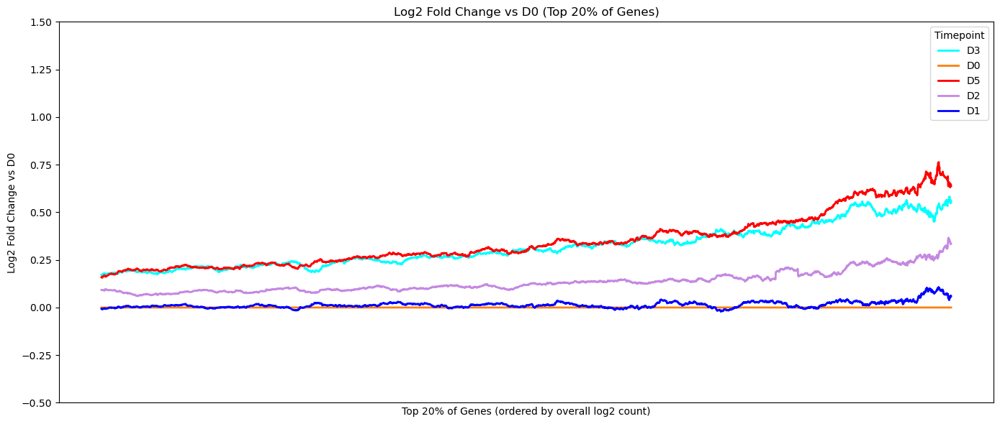

In [182]:
plt.figure(figsize=(14, 6))

for timepoint in times:
    y = log2fc_vs_D0[timepoint].rolling(window = 100, center = True, min_periods = 1).mean()
    plt.plot(
        x, y,
        label=timepoint,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(timepoint)
    )

plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log2 count)")
plt.ylabel("Log2 Fold Change vs D0")
plt.title(f"Log2 Fold Change vs D0 (Top {percent_label}% of Genes)")
plt.ylim(-0.5, 1.5)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [ ]:
# D3 per rep

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


replicates = {
    "rep1": filtered_rep1,
    "rep2": filtered_rep2,
    "rep3": filtered_rep3
}

top_gene_fraction = 0.2  # Top 20% of genes

# one replicate to define top genes (rep2)
gene_counts_rep2 = pd.DataFrame(filtered_rep2.X.toarray(), columns=filtered_rep2.var.index)
gene_counts_rep2["time"] = filtered_rep2.obs["time"].values
average_counts_rep2 = gene_counts_rep2.groupby("time").mean().transpose()

# Rank by overall mean log2 counts
log2_counts_rep2 = np.log2(average_counts_rep2 + 1)
log2_counts_rep2["overall_mean"] = log2_counts_rep2.mean(axis=1)
sorted_log_counts = log2_counts_rep2.sort_values(by="overall_mean", ascending=False)

top_genes = sorted_log_counts.iloc[:int(sorted_log_counts.shape[0] * top_gene_fraction)].index

# Store log2FC for plotting
log2fc_D3_dict = {}

for rep_name, rep_data in replicates.items():
    gene_counts = pd.DataFrame(rep_data.X.toarray(), columns=rep_data.var.index)
    gene_counts["time"] = rep_data.obs["time"].values
    average_counts = gene_counts.groupby("time").mean().transpose()

    # Keep only top genes
    top_counts = average_counts.loc[top_genes]

    # multiple D0 columns 
    D0_cols = [col for col in top_counts.columns if "D0" in col or "Non-IR" in col] 
    if len(D0_cols) > 1:
        D0_mean = top_counts[D0_cols].mean(axis=1)
    else:
        D0_mean = top_counts[D0_cols[0]]

    # log2FC D3 vs D0
    log2fc_D3 = np.log2(top_counts["D3"] + 1) - np.log2(D0_mean + 1)
    log2fc_D3_dict[rep_name] = log2fc_D3

# X-axis
x = np.arange(len(top_genes))
custom_colors = {
    "rep1": "#1f77b4",
    "rep2": "#ff7f0e",
    "rep3": "#2ca02c"
}

# Plot
plt.figure(figsize=(14, 6))

for rep_name, y in log2fc_D3_dict.items():
    y_smooth = pd.Series(y.values).rolling(window=50, center=True, min_periods=1).mean()
    plt.plot(
        x,
        y_smooth,
        label=rep_name,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(rep_name)
    )

plt.xlabel(f"Top {int(top_gene_fraction*100)}% of Genes (ordered by overall log2 count in rep2)")
plt.ylabel("Log2 Fold Change D3 vs D0")
plt.title("Log2 Fold Change D3 vs D0 for Each Replicate")
plt.ylim(-0.5, 1)
plt.legend(title="Replicate")
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [ ]:
# D5 per rep

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

replicates = {
    "rep1": filtered_rep1,
    "rep2": filtered_rep2,
    "rep3": filtered_rep3
}

top_gene_fraction = 0.2  # Top 20% of genes

gene_counts_rep2 = pd.DataFrame(filtered_rep2.X.toarray(), columns=filtered_rep2.var.index)
gene_counts_rep2["time"] = filtered_rep2.obs["time"].values
average_counts_rep2 = gene_counts_rep2.groupby("time").mean().transpose()

# Rank by overall mean log2 counts
log2_counts_rep2 = np.log2(average_counts_rep2 + 1)
log2_counts_rep2["overall_mean"] = log2_counts_rep2.mean(axis=1)
sorted_log_counts = log2_counts_rep2.sort_values(by="overall_mean", ascending=False)

top_genes = sorted_log_counts.iloc[:int(sorted_log_counts.shape[0] * top_gene_fraction)].index

# Store log2FC for plotting
log2fc_D5_dict = {}

for rep_name, rep_data in replicates.items():
    gene_counts = pd.DataFrame(rep_data.X.toarray(), columns=rep_data.var.index)
    gene_counts["time"] = rep_data.obs["time"].values
    average_counts = gene_counts.groupby("time").mean().transpose()

    # Keep only top genes
    top_counts = average_counts.loc[top_genes]

    D0_cols = [col for col in top_counts.columns if "D0" in col or "Non-IR" in col]  # adjust if needed
    if len(D0_cols) > 1:
        D0_mean = top_counts[D0_cols].mean(axis=1)
    else:
        D0_mean = top_counts[D0_cols[0]]

    # log2FC D5 vs D0
    log2fc_D5 = np.log2(top_counts["D5"] + 1) - np.log2(D0_mean + 1)       # what to put for 'v' ? avoid log(0)
    log2fc_D5_dict[rep_name] = log2fc_D5

# X-axis
x = np.arange(len(top_genes))
custom_colors = {
    "rep1": "#1f77b4",
    "rep2": "#ff7f0e",
    "rep3": "#2ca02c"
}

# Plot
plt.figure(figsize=(14, 6))

for rep_name, y in log2fc_D5_dict.items():
    y_smooth = pd.Series(y.values).rolling(window=50, center=True, min_periods=1).mean()
    plt.plot(
        x,
        y_smooth,
        label=rep_name,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(rep_name)
    )

plt.xlabel(f"Top {int(top_gene_fraction*100)}% of Genes (ordered by overall log2 count in rep2)")
plt.ylabel("Log2 Fold Change D5 vs D0")
plt.title("Log2 Fold Change D5 vs D0 for Each Replicate")
plt.ylim(-0.5, 1)
plt.legend(title="Replicate")
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [28]:
filtered_rep4.obs['time'].unique()

array(['D4 outer 2', 'D4 inner 1', 'D6', 'D0', 'D2 outer 2', 'D2 inner 1'],
      dtype=object)

In [ ]:
replicates = [filtered_rep1, filtered_rep2, filtered_rep3, filtered_rep4]

rep_l2fc_list = []

for rep in replicates:
    gene_counts = pd.DataFrame(rep.X.toarray(), columns=rep.var.index)
    gene_counts["time"] = rep.obs["time"].values

    # Average counts per gene per timepoint
    avg_counts = gene_counts.groupby("time").mean().transpose()

    # Skip replicates without D0
    if "D0" not in avg_counts.columns:
        continue

    # Log2FC vs D0
    log2fc = np.log2(avg_counts + 1).subtract(np.log2(avg_counts["D0"] + 1), axis=0)

    rep_l2fc_list.append(log2fc)

common_genes = set(rep_l2fc_list[0].index)
for df in rep_l2fc_list[1:]:
    common_genes = common_genes.intersection(df.index)

common_genes = list(common_genes)

rep_l2fc_list = [df.loc[common_genes] for df in rep_l2fc_list]

# Stack all replicates
combined = pd.concat(rep_l2fc_list, keys=range(len(rep_l2fc_list)), names=["replicate", "gene"])

# Average across replicates
mean_l2fc = combined.groupby("gene").mean()

log2_counts = np.log2(mean_l2fc + 1)
log2_counts["overall_mean"] = log2_counts.mean(axis=1)

sorted_log_counts = log2_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_genes = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)].index

top_l2fc = mean_l2fc.loc[top_genes]

x = np.arange(top_l2fc.shape[0])
times = [t for t in top_l2fc.columns if t != "D0"]  # exclude D0 since it's 0

custom_colors = {
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D4": "#00FF00",
    "D5": "#FF0000",
    "D6": "#FFA500"
}

plt.figure(figsize=(14, 6))

for timepoint in times:
    if timepoint not in top_l2fc.columns:
        continue  # skip missing timepoints

    y = top_l2fc[timepoint].rolling(window=100, center=True, min_periods=1).mean()

    plt.plot(
        x, y,
        label=timepoint,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(timepoint)
    )

plt.xlabel(f"Top {int(top_gene_fraction * 100)}% of Genes")
plt.ylabel("Mean Log2 Fold Change vs D0")
plt.title("Average Log2 Fold Change vs D0 Across Replicates")

plt.ylim(-0.5, 1)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [52]:
mean_l2fc.loc['Serpinb12']

time
D0    0.000000
D1    0.000288
D3    0.002250
D5    0.000899
D2    0.000643
D4   -0.001705
D6   -0.001771
Name: Serpinb12, dtype: float32

In [41]:
rep_l2fc_list

[time        D0        D1        D3        D5
 Serpinb12  0.0  0.000000  0.006550  0.000974
 Eif4e3     0.0  0.000230  0.016194  0.006844
 Klrc3      0.0 -0.008930 -0.005651 -0.006011
 Ppp1ca     0.0 -0.024608  0.081369  0.066003
 Leng1      0.0 -0.033387  0.058799  0.089788
 ...        ...       ...       ...       ...
 Ppp2r2c    0.0  0.000000  0.000000  0.000974
 Tas2r135   0.0  0.000000  0.000000  0.000000
 Osm        0.0  0.000000  0.001640  0.000000
 Stab1      0.0 -0.003447 -0.001807  0.002386
 Tmem262    0.0  0.000000  0.000000  0.001947
 
 [19059 rows x 4 columns],
 time        D0        D1        D2        D3        D5
 Serpinb12  0.0  0.002066  0.004275  0.001404  0.001469
 Eif4e3     0.0  0.000400  0.061747  0.124750  0.178722
 Klrc3      0.0  0.000003  0.007850  0.000016  0.000620
 Ppp1ca     0.0  0.027986  0.049206  0.404412  0.412027
 Leng1      0.0 -0.007281 -0.017155  0.052700  0.105955
 ...        ...       ...       ...       ...       ...
 Ppp2r2c    0.0 -0.003423  

In [69]:
timepoint_avg

time,D0,D2,D4,D6
Xkr4,0.000000,0.000000,0.001401,0.002871
Rp1,0.000000,0.000000,0.000284,0.000000
Sox17,0.001244,0.002618,0.003228,0.004390
Lypla1,0.251348,0.319671,0.629947,0.679331
Tcea1,0.099959,0.083078,0.248438,0.235731
...,...,...,...,...
mt-Nd4,0.412692,0.539706,1.252546,1.642519
mt-Nd5,0.862298,0.979712,2.207460,2.679163
mt-Nd6,0.499793,0.340875,0.578145,0.447484
mt-Cytb,2.724181,3.587509,8.106643,10.651976


In [42]:
l2fc_df

,Xkr4,Rp1,Sox17,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Npbwr1,Rb1cc1,Alkal1,St18,Pcmtd1,Sntg1,Rrs1,Adhfe1,Vxn,Mybl1,Vcpip1,Sgk3,Mcmdc2,Tcf24,Ppp1r42,Cops5,Cspp1,Arfgef1,Cpa6,Prex2,Sulf1,Slco5a1,Prdm14,Ncoa2,Tram1,Lactb2,Xkr9,Eya1,Msc,Trpa1,Kcnb2,Terf1,Sbspon,Rdh10,Stau2,Ube2w,Eloc,Tmem70,Ly96,Jph1,Gdap1,Pi15,Crispld1,Crisp4,Defb18,Defb41,Tfap2d,Tfap2b,Pkhd1,Il17a,Il17f,Mcm3,Paqr8,Efhc1,Tram2,Tmem14a,Gsta3,Khdc1a,Khdc1c,Khdc1b,Kcnq5,Rims1,Ogfrl1,Smap1,Sdhaf4,Fam135a,Col9a1,Col19a1,Lmbrd1,Adgrb3,Phf3,Lgsn,Pih1d3,Khdrbs2,Prim2,Rab23,Bag2,Zfp451,Bend6,Dst,Ccdc115,Imp4,Ptpn18,Prss39,Cfc1,Prss40,Amer3,Arhgef4,Arhgef4-1,Fam168b,Plekhb2,Hs6st1,Uggt1,Neurl3,Arid5a,Kansl3,Fer1l5,Lman2l,Cnnm4,Cnnm3,Ankrd23,Ankrd39,Sema4c,Fam178b,Cox5b,Actr1b,Zap70,Tmem131,Vwa3b,Cnga3,Inpp4a,Coa5,Unc50,Mgat4a,Tsga10,Lipt1,Mitd1,Lyg2,Lyg1,Txndc9,Eif5b,Rev1,Aff3,Lonrf2,Chst10,Nms,Pdcl3,Npas2,Tbc1d8,Cnot11,Rnf149,Creg2,Rfx8,Map4k4,Il1r2,Il1r1,Il1rl2,Il1rl1,Il18r1,Il18rap,Slc9a4,Slc9a2,Mfsd9,Tmem182,Pou3f3,Gpr45,Tgfbrap1,AI597479,Fhl2,Nck2,Ecrg4,Uxs1,Tpp2,Mettl21c,Tex30,Poglut2,Bivm,Ercc5,Mettl21e,Gulp1,Col3a1,Col5a2,Wdr75,Slc40a1,Dnah7b,Slc39a10,Tmeff2,Cavin2,Nabp1,Myo1b,Stat4,Stat1,Gls,Nab1,Nemp2,Mfsd6,Inpp1,Hibch,Mstn,Pms1,Ormdl1,Osgepl1,Asnsd1,Dnah7a,Stk17b,Hecw2,Ccdc150,Gtf3c3,Pgap1,Ankrd44,Sf3b1,Coq10b,Hspd1,Hspe1,Mob4,Rftn2,Mars2,Boll,Plcl1,Hsfy2,Satb2,Tyw5,Maip1,Spats2l,Kctd18,Sgo2a,Aox1,Aox3,Aox4,Aox2,Bzw1,Clk1,Ppil3,Nif3l1,Orc2,Fam126b,Ndufb3,Flacc1,Cflar,Casp8,Trak2,Stradb,C2cd6,Tmem237,Mpp4,Als2,Cdk15,Fzd7,Sumo1,Nop58,Bmpr2,Fam117b,Ica1l,Wdr12,Carf,Nbeal1,Cyp20a1,Abi2,Raph1,Cd28,Ctla4,Icos,Pard3b,Nrp2,Ino80d,Ndufs1,Eef1b2,Gpr1,Zdbf2,Adam23,Dytn,Mdh1b,Fastkd2,Klf7,Creb1,Mettl21a,Ccnyl1,Fzd5,Plekhm3,Akr1cl,Crygd,Crygc,Crygb,Cryga,Idh1,Pikfyve,Pth2r,Crygf,Map2,Unc80,Rpe,Kansl1l,Acadl,Myl1,Lancl1,Cps1,Erbb4,Ikzf2,Spag16,Vwc2l,Bard1,Abca12,Atic,Fn1,Mreg,Pecr,Tmem169,Xrcc5,March4,Smarcal1,Ankar,Igfbp2,Igfbp5,Tnp1,Tns1,Rufy4,Cxcr2,Cxcr1,Arpc2,Gpbar1,Aamp,Pnkd,Tmbim1,Catip,Slc11a1,Ctdsp1,Vil1,Usp37,Cnot9,Plcd4,Zfp142,Bcs1l,Rnf25,Stk36,Ttll4,Cyp27a1,Prkag3,Wnt6,Wnt10a,Cdk5r2,Fev,Cryba2,Cfap65,Ihh,Nhej1,Slc23a3,Cnppd1,Retreg2,Zfand2b,Abcb6,Atg9a,Ankzf1,Glb1l,Stk16,Tuba4a,Dnajb2,Ptprn,Resp18,Dnpep,Des,Speg,Gmppa,Asic4,Chpf,Obsl1,Tmem198,Inha,Stk11ip,Slc4a3,Epha4,Pax3,Sgpp2,Farsb,BC035947,Mogat1,Acsl3,Utp14b,Kcne4,Scg2,Ap1s3,Wdfy1,Serpine2,Fam124b,Cul3,Dock10,Nyap2,Irs1,Rhbdd1,Col4a4,Col4a3,Mff,Tm4sf20,Agfg1,Slc19a3,Krtap28-10,Krtap28-13,Ccl20,Daw1,Sphkap,Pid1,Dner,Trip12,Fbxo36,Slc16a14,Sp110,Sp140,Sp100,Cab39,Itm2c,Gpr55,Spata3,Psmd1,Htr2b,Armc9,B3gnt7,Ncl,Nmur1,Tex44,Ptma,Pde6d,Cops7b,Nppc,Dis3l2,Alppl2,Alpi,Akp3,Ecel1,Prss56,Chrnd,Chrng,Eif4e2,Efhd1,Gigyf2,Kcnj13,Snorc,Ngef,Neu2,Inpp5d,Atg16l1,Dgkd,Usp40,Ugt1a10,Ugt1a9,Ugt1a8,Ugt1a7c,Dnajb3,Ugt1a1,Hjurp,Trpm8,Spp2,Glrp1,Arl4c,Sh3bp4,Agap1,Gbx2,Asb18,Iqca,Ackr3,Cops8,Col6a3,Mlph,Prlh,Rab17,Lrrfip1,Rbm44,Ramp1,Ube2f,Scly,Espnl,Klhl30,Erfe,Ilkap,Hes6,Per2,Traf3ip1,Asb1,Twist2,Hdac4,Ndufa10,Olfr1416,Olfr1415,Olfr1414,Olfr1413,Olfr1412,Olfr1411,Olfr1410,Olfr12,Cops9,Otos,Gpc1,Dusp28,Rnpepl1,Capn10,Gpr35,Aqp12,Kif1a,Agxt,Mab21l4,Crocc2,Sned1,Mterf4,Pask,Ppp1r7,Ano7,Hdlbp,Sept2,Farp2,Stk25,Bok,Thap4,Atg4b,Dtymk,Ing5,D2hgdh,Gal3st2,Gal3st2b,Gal3st2c,Neu4,Pdcd1,Fam174a,St8sia4,Slco4c1,Slco6c1,D1Ertd622e,Ppip5k2,Gin1,Pam,Slco6d1,Cntnap5b,Cdh20,Rnf152,Pign,Relch,Tnfrsf11a,Zcchc2,Phlpp1,Bcl2,Kdsr,Vps4b,Serpinb5,Serpinb12,Serpinb13,Serpinb3a,Serpinb3d,Serpinb3b,Serpinb3c,Serpinb11,Serpinb7,Serpinb2,Serpinb8,Cdh7,Cdh19,Dsel,Cntnap5a,Tsn,Nifk,Clasp1,Tfcp2l1,Gli2,Inhbb,Ralb,Tmem185b,Epb41l5,Ptpn4,Tmem177,Cfap221,Sctr,Tmem37,Dbi,Steap3,C1ql2,Marco,En1,Insig2,Ccdc93,Htr5b,Ddx18,Dpp10,Actr3,Slc35f5,Gpr39,Lypd1,Nckap5,Mgat5,Tmem163,Acmsd,Ccnt2,Map3k19,Rab3gap1,Zranb3,R3hdm1,Ubxn4,Lct,Mcm6,Dars,Cxcr4,Thsd7b,Cd55b,Cd55,Zp3r,C4bp,Pfkfb2,Yod1,AA986860,Fcamr,Pigr,Fcmr,Il24,Il20,Il19,Il10,Mapkapk2,Dyrk3,Eif2d,Rassf5,Ikbke,Srgap2,Fam72a,Avpr1b,Ctse,Rab7b,Slc26a9,Pm20d1,Slc41a1,Rab29,Nucks1,Slc45a3,Elk4,Mfsd4a,Cdk18,Klhdc8a,Nuak2,Tmcc2,Ds

In [43]:
log2fc

time,D2,D4,D6
Xkr4,0.000000,0.002020,0.004136
Rp1,0.000000,0.000410,0.000000
Sox17,0.001973,0.002856,0.004526
Lypla1,0.075074,0.381275,0.424404
Tcea1,-0.022371,0.182668,0.167916
...,...,...,...
mt-Nd4,0.112751,0.673099,0.903467
mt-Nd5,0.078429,0.784141,0.982294
mt-Nd6,-0.161694,0.073397,-0.051216
mt-Cytb,0.274167,1.289996,1.645580


In [ ]:
# L2FC of each timepoint vs D0 (within rep)
# with sem ;
# also Duplicates within replicate treated independently (D0 still averaged), and average is done for all across replicates
# with log(avg +1) for log(0)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# normalize labels
def normalize_time_label(label):
    if "Non-IR" in label:
        return "D0"
    for t in ["D0", "D1", "D2", "D3", "D4", "D5", "D6"]:
        if t in label:
            return t
    return None

replicates = [filtered_rep1, filtered_rep2, filtered_rep3, filtered_rep4]

rep_l2fc_list = []


for rep_idx, rep in enumerate(replicates):

    gene_counts = pd.DataFrame(rep.X.toarray(), columns=rep.var.index)

    gene_counts["raw_time"] = rep.obs["time"].values
    gene_counts["time"] = gene_counts["raw_time"].apply(normalize_time_label)

    # Drop unmapped rows
    gene_counts = gene_counts.dropna(subset=["time"])

    # average per subgroup
    numeric_cols = gene_counts.select_dtypes(include=[np.number]).columns
    subgroup_avg = gene_counts.groupby("raw_time")[numeric_cols].mean()

    # Map subgroup to timepoint
    subgroup_avg["time"] = subgroup_avg.index.map(normalize_time_label)

    subgroup_avg[numeric_cols] = subgroup_avg[numeric_cols].apply(
        pd.to_numeric, errors="coerce"
    )

    # compute L2FC per subgroup vs all D0 subgroups
    d0_subgroups = subgroup_avg[subgroup_avg["time"] == "D0"]

    l2fc_values = []
    l2fc_times = []

    for idx, row in subgroup_avg.iterrows():
        time = row["time"]

        if time == "D0":
            continue

        row_vals = row[numeric_cols].to_numpy(dtype=float)

        for _, d0_row in d0_subgroups.iterrows():
            d0_vals = d0_row[numeric_cols].to_numpy(dtype=float)

            l2fc = np.log2(row_vals + 1) - np.log2(d0_vals + 1)

            l2fc_values.append(l2fc)
            l2fc_times.append(time)

    l2fc_df = pd.DataFrame(l2fc_values, columns=numeric_cols)
    l2fc_df["time"] = l2fc_times
    l2fc_df["replicate"] = rep_idx

    # keep all rows (no averaging)
    # Convert to long format
    l2fc_long = l2fc_df.melt(
        id_vars=["time", "replicate"],
        var_name="gene",
        value_name="l2fc"
    )

    rep_l2fc_list.append(l2fc_long)

# Combine replicates and average globally
combined = pd.concat(rep_l2fc_list, ignore_index=True)

mean_l2fc = combined.groupby(["gene", "time"])["l2fc"].mean().unstack()
sem_l2fc = combined.groupby(["gene", "time"])["l2fc"].sem().unstack()

# Select top genes

log2_counts = np.log2(mean_l2fc + 1)
log2_counts["overall_mean"] = log2_counts.mean(axis=1)

sorted_log_counts = log2_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_n = int(sorted_log_counts.shape[0] * top_gene_fraction)

top_genes = sorted_log_counts.iloc[:top_n].index
top_l2fc = mean_l2fc.loc[top_genes]
top_sem = sem_l2fc.loc[top_genes]

# Plot
x = np.arange(top_l2fc.shape[0])

times = [t for t in ["D1", "D2", "D3", "D4", "D5", "D6"] if t in top_l2fc.columns]

custom_colors = {
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D4": "orange",
    "D5": "#FF0000",
    "D6": "#8B8000"
}

plt.figure(figsize=(14, 6), dpi = 900)

for timepoint in times:
    y = top_l2fc[timepoint].rolling(window=100, center=True, min_periods=1).mean()
    y_sem = top_sem[timepoint].rolling(window=100, center=True, min_periods=1).mean()

    plt.plot(
        x,
        y,
        label=timepoint,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(timepoint)
    )

    plt.fill_between(
        x,
        y - y_sem,
        y + y_sem,
        color=custom_colors.get(timepoint),
        alpha=0.2
    )

plt.xlabel(f"{int(top_gene_fraction * 100)}% of Genes (ordered by mean expression)")
plt.ylabel("Mean L2FC vs D0")
plt.title("L2FC vs D0")

plt.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.3)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()

plt.tight_layout()
plt.show()

In [22]:
plt.figure(figsize=(14, 6), dpi = 900)

for timepoint in times:
    y = top_l2fc[timepoint].rolling(window=100, center=True, min_periods=1).mean()
    y_sem = top_sem[timepoint].rolling(window=100, center=True, min_periods=1).mean()

    plt.plot(
        x,
        y,
        label=timepoint,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(timepoint)
    )

    plt.fill_between(
        x,
        y - y_sem,
        y + y_sem,
        color=custom_colors.get(timepoint),
        alpha=0.2
    )

plt.xlabel(f"{int(top_gene_fraction * 100)}% of Genes (ordered by mean expression)")
plt.ylabel("Mean L2FC vs D0")
plt.title("L2FC vs D0")

plt.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.3)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()

plt.tight_layout()
plt.show()

In [100]:
d1_vals

0         0.000000
1         0.000000
6        -0.010971
7         0.000000
12        0.000000
            ...   
247752   -0.156212
247755   -0.161082
247758   -0.087083
247761   -0.339871
247764   -0.013618
Name: l2fc, Length: 76236, dtype: float64

In [101]:
rep_means = (
    combined[combined["time"] == "D1"]
    .groupby("replicate")["l2fc"]
    .mean()
)

from scipy.stats import ttest_1samp
ttest_1samp(rep_means, 0, alternative='less')

TtestResult(statistic=np.float64(-0.8899910810498208), pvalue=np.float64(0.23368758732602601), df=np.int64(2))

In [98]:
from scipy.stats import ttest_1samp

d1_vals = combined[combined["time"] == "D1"]["l2fc"].dropna()

from scipy.stats import wilcoxon

wilcoxon(d1_vals - 0, alternative='less')

WilcoxonResult(statistic=np.float64(585260556.5), pvalue=np.float64(0.0))

In [ ]:
# L2FC of each timepoint vs D0 (within rep)
# remove all genes with 0 avg for each timepoint 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def normalize_time_label(label):
    if "Non-IR" in label:
        return "D0"
    for t in ["D0", "D1", "D2", "D3", "D4", "D5", "D6"]:
        if t in label:
            return t
    return None

replicates = [filtered_rep1, filtered_rep2, filtered_rep3, filtered_rep4]

rep_l2fc_list = []


for rep in replicates:
    gene_counts = pd.DataFrame(rep.X.toarray(), columns=rep.var.index)

    gene_counts["raw_time"] = rep.obs["time"].values

    gene_counts["time"] = gene_counts["raw_time"].apply(normalize_time_label)

    gene_counts = gene_counts.dropna(subset=["time"])


    numeric_cols = gene_counts.select_dtypes(include=[np.number]).columns
    subgroup_avg = gene_counts.groupby("raw_time")[numeric_cols].mean()

    subgroup_avg["time"] = subgroup_avg.index.map(normalize_time_label)

    timepoint_avg = subgroup_avg.groupby("time").mean().transpose()


    valid_genes = (timepoint_avg > 0).all(axis=1)
    filtered = timepoint_avg.loc[valid_genes]

    log2fc = np.log2(filtered).subtract(
        np.log2(filtered["D0"]), axis=0
    )


    rep_l2fc_list.append(log2fc)


common_genes = set(rep_l2fc_list[0].index)
for df in rep_l2fc_list[1:]:
    common_genes = common_genes.intersection(df.index)

common_genes = list(common_genes)
rep_l2fc_list = [df.loc[common_genes] for df in rep_l2fc_list]


combined = pd.concat(rep_l2fc_list, keys=range(len(rep_l2fc_list)), names=["replicate", "gene"])
mean_l2fc = combined.groupby("gene").mean()


log2_counts = np.log2(mean_l2fc + 1)
log2_counts["overall_mean"] = log2_counts.mean(axis=1)

sorted_log_counts = log2_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 1
top_n = int(sorted_log_counts.shape[0] * top_gene_fraction)

top_genes = sorted_log_counts.iloc[:top_n].index
top_l2fc = mean_l2fc.loc[top_genes]


x = np.arange(top_l2fc.shape[0])

times = [t for t in ["D1", "D2", "D3", "D4", "D5", "D6"] if t in top_l2fc.columns]

custom_colors = {
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D4": "#00FF00",
    "D5": "#FF0000",
    "D6": "#808080"
}

plt.figure(figsize=(14, 6))

for timepoint in times:
    y = top_l2fc[timepoint].rolling(window=100, center=True, min_periods=1).mean()

    plt.plot(
        x,
        y,
        label=timepoint,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(timepoint)
    )

plt.xlabel(f"Top {int(top_gene_fraction * 100)}% of Genes (ordered by mean expression)")
plt.ylabel("Mean L2FC vs D0")
plt.title("L2FC vs D0 across replicates")

plt.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.3) # plot x-axis
plt.ylim(-1.5, 3)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()

plt.tight_layout()
plt.show()

In [27]:
filtered

time,D0,D2,D4,D6
Sox17,0.001244,0.002618,0.003228,0.004390
Lypla1,0.251348,0.319671,0.629947,0.679331
Tcea1,0.099959,0.083078,0.248438,0.235731
Rgs20,0.000830,0.001786,0.000900,0.001182
Atp6v1h,0.123185,0.175309,0.481064,0.416245
...,...,...,...,...
mt-Nd4,0.412692,0.539706,1.252546,1.642519
mt-Nd5,0.862298,0.979712,2.207460,2.679163
mt-Nd6,0.499793,0.340875,0.578145,0.447484
mt-Cytb,2.724181,3.587509,8.106643,10.651976


In [76]:
timepoint_avg

time,D0,D2,D4,D6
Xkr4,0.000000,0.000000,0.001401,0.002871
Rp1,0.000000,0.000000,0.000284,0.000000
Sox17,0.001244,0.002618,0.003228,0.004390
Lypla1,0.251348,0.319671,0.629947,0.679331
Tcea1,0.099959,0.083078,0.248438,0.235731
...,...,...,...,...
mt-Nd4,0.412692,0.539706,1.252546,1.642519
mt-Nd5,0.862298,0.979712,2.207460,2.679163
mt-Nd6,0.499793,0.340875,0.578145,0.447484
mt-Cytb,2.724181,3.587509,8.106643,10.651976


In [ ]:
# z-score , separated by replicate; prolif epi at timepoint against prolif epi D0

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def normalize_time_label(label):
    if "Non-IR" in label:
        return "D0"
    for t in ["D0", "D1", "D2", "D3", "D4", "D5", "D6"]:
        if t in label:
            return t
    return None

# select timepoint
target_timepoint = "D1"
top_gene_fraction = 0.2


replicates = [filtered_rep1, filtered_rep2, filtered_rep3, filtered_rep4]

rep_zscore_list = []


for rep in replicates:
    gene_counts = pd.DataFrame(rep.X.toarray(), columns=rep.var.index)

    gene_counts["raw_time"] = rep.obs["time"].values
    gene_counts["time"] = gene_counts["raw_time"].apply(normalize_time_label)

    gene_counts = gene_counts.dropna(subset=["time"])

    numeric_cols = gene_counts.select_dtypes(include=[np.number]).columns


    d0_cells = gene_counts[gene_counts["time"] == "D0"]
    if d0_cells.empty:
        continue

    d0_mean = d0_cells[numeric_cols].mean()
    d0_std = d0_cells[numeric_cols].std(ddof=0)
    d0_std[d0_std == 0] = 1  # avoid division by zero

    subgroup_avg = gene_counts.groupby("raw_time")[numeric_cols].mean()
    subgroup_avg["time"] = subgroup_avg.index.map(normalize_time_label)
    subgroup_avg = subgroup_avg.dropna(subset=["time"])

    timepoint_avg = subgroup_avg.groupby("time").mean().transpose()

    # z-score vs D0
    zscore = (timepoint_avg - d0_mean.values[:, np.newaxis]) / d0_std.values[:, np.newaxis]

    rep_zscore_list.append(zscore)



common_genes = set(rep_zscore_list[0].index)
for df in rep_zscore_list[1:]:
    common_genes = common_genes.intersection(df.index)

common_genes = list(common_genes)
rep_zscore_list = [df.loc[common_genes] for df in rep_zscore_list]


tp_list = []

for i, df in enumerate(rep_zscore_list):
    if target_timepoint in df.columns:
        tp = df[[target_timepoint]].copy()
        tp.columns = [f"rep{i+1}"]
        tp_list.append(tp)


# Merge replicates
tp_combined = pd.concat(tp_list, axis=1)

#  all genes present across replicates
tp_combined = tp_combined.dropna()


tp_combined["mean"] = tp_combined.mean(axis=1)
tp_sorted = tp_combined.sort_values(by="mean", ascending=False)

top_n = int(tp_sorted.shape[0] * top_gene_fraction)
top_tp = tp_sorted.iloc[:top_n].drop(columns="mean")

# plot
x = np.arange(top_tp.shape[0])

plt.figure(figsize=(14, 6))

for col in top_tp.columns:
    y = top_tp[col].rolling(window=100, center=True, min_periods=1).mean()
    plt.plot(x, y, label=col, linewidth=2)

plt.xlabel(f"Top {int(top_gene_fraction * 100)}% of Genes (ordered by {target_timepoint} z-score)")
plt.ylabel(f"Z-score vs D0 ({target_timepoint})")
plt.title(f"{target_timepoint} Z-score per replicate")

plt.legend(title="Replicate")
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [ ]:
# z-score prolif epi at timepoint against prolif epi D0

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def normalize_time_label(label):
    if "Non-IR" in label:
        return "D0"
    for t in ["D0", "D1", "D2", "D3", "D4", "D5", "D6"]:
        if t in label:
            return t
    return None


replicates = [filtered_rep1, filtered_rep2, filtered_rep3, filtered_rep4]

rep_zscore_list = []


for rep in replicates:
    gene_counts = pd.DataFrame(rep.X.toarray(), columns=rep.var.index)

    gene_counts["raw_time"] = rep.obs["time"].values

    gene_counts["time"] = gene_counts["raw_time"].apply(normalize_time_label)

    gene_counts = gene_counts.dropna(subset=["time"])

    numeric_cols = gene_counts.select_dtypes(include=[np.number]).columns

    # D0 mean and std per gene
    d0_cells = gene_counts[gene_counts["time"] == "D0"]

    # Per-gene D0 mean and std
    d0_mean = d0_cells[numeric_cols].mean()
    d0_std = d0_cells[numeric_cols].std(ddof=0)  # population std per gene

    # Avoid division by zero
    d0_std[d0_std == 0] = 1

    # compute average per subgroup
    subgroup_avg = gene_counts.groupby("raw_time")[numeric_cols].mean()
    subgroup_avg["time"] = subgroup_avg.index.map(normalize_time_label)
    subgroup_avg = subgroup_avg.dropna(subset=["time"])

    timepoint_avg = subgroup_avg.groupby("time").mean().transpose()

    # gene-level z-score vs D0
    zscore = (timepoint_avg - d0_mean.values[:, np.newaxis]) / d0_std.values[:, np.newaxis]

    rep_zscore_list.append(zscore)

# align genes
common_genes = set(rep_zscore_list[0].index)
for df in rep_zscore_list[1:]:
    common_genes = common_genes.intersection(df.index)

common_genes = list(common_genes)
rep_zscore_list = [df.loc[common_genes] for df in rep_zscore_list]

# average z-score across replicates

combined = pd.concat(rep_zscore_list, keys=range(len(rep_zscore_list)), names=["replicate", "gene"])
mean_zscore = combined.groupby("gene").mean()

# select genes
mean_zscore["overall_mean"] = mean_zscore.mean(axis=1)
sorted_zscore = mean_zscore.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_n = int(sorted_zscore.shape[0] * top_gene_fraction)

top_genes = sorted_zscore.iloc[:top_n].index
top_zscore = mean_zscore.loc[top_genes]

# plot
x = np.arange(top_zscore.shape[0])
times = [t for t in ["D1", "D2", "D3", "D4", "D5", "D6"] if t in top_zscore.columns]

custom_colors = {
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D4": "#00FF00",
    "D5": "#FF0000",
    "D6": "#FFA500"
}

plt.figure(figsize=(14, 6))

for timepoint in times:
    y = top_zscore[timepoint].rolling(window=100, center=True, min_periods=1).mean()
    plt.plot(x, y, label=timepoint, linewidth=2, linestyle='-', color=custom_colors.get(timepoint))

plt.xlabel(f"Top {int(top_gene_fraction * 100)}% of Genes (ordered by mean z-score)")
plt.ylabel("Z-score vs D0")
plt.title("Z-score vs D0 across replicates")
plt.ylim(-0.5, 3)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

In [ ]:
# z-score prolif epi at timepoint against prolif epi D0 ; with SEM

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def normalize_time_label(label):
    if "Non-IR" in label:
        return "D0"
    for t in ["D0", "D1", "D2", "D3", "D4", "D5", "D6"]:
        if t in label:
            return t
    return None


replicates = [filtered_rep1, filtered_rep2, filtered_rep3, filtered_rep4]

rep_zscore_list = []

for rep in replicates:
    gene_counts = pd.DataFrame(rep.X.toarray(), columns=rep.var.index)

    gene_counts["raw_time"] = rep.obs["time"].values
    gene_counts["time"] = gene_counts["raw_time"].apply(normalize_time_label)

    gene_counts = gene_counts.dropna(subset=["time"])
    numeric_cols = gene_counts.select_dtypes(include=[np.number]).columns

    # D0
    d0_cells = gene_counts[gene_counts["time"] == "D0"]

    d0_mean = d0_cells[numeric_cols].mean()
    d0_std = d0_cells[numeric_cols].std(ddof=0)
    d0_std[d0_std == 0] = 1

    # subgroup average
    subgroup_avg = gene_counts.groupby("raw_time")[numeric_cols].mean()
    subgroup_avg["time"] = subgroup_avg.index.map(normalize_time_label)
    subgroup_avg = subgroup_avg.dropna(subset=["time"])

    # timepoint average
    timepoint_avg = subgroup_avg.groupby("time").mean().transpose()

    # z-score vs d0
    zscore = (timepoint_avg - d0_mean.values[:, np.newaxis]) / d0_std.values[:, np.newaxis]

    rep_zscore_list.append(zscore)


common_genes = set(rep_zscore_list[0].index)
for df in rep_zscore_list[1:]:
    common_genes = common_genes.intersection(df.index)

common_genes = list(common_genes)
rep_zscore_list = [df.loc[common_genes] for df in rep_zscore_list]

#  mean + SEM across replicates
stacked = np.stack([df.values for df in rep_zscore_list], axis=0)

mean_zscore = pd.DataFrame(
    stacked.mean(axis=0),
    index=rep_zscore_list[0].index,
    columns=rep_zscore_list[0].columns
)

sem_zscore = pd.DataFrame(
    stacked.std(axis=0) / np.sqrt(stacked.shape[0]),
    index=rep_zscore_list[0].index,
    columns=rep_zscore_list[0].columns
)

# top genes
mean_zscore["overall_mean"] = mean_zscore.mean(axis=1)
sorted_zscore = mean_zscore.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_n = int(sorted_zscore.shape[0] * top_gene_fraction)

top_genes = sorted_zscore.iloc[:top_n].index

top_mean = mean_zscore.loc[top_genes]
top_sem = sem_zscore.loc[top_genes]

# plot with shaded sem
x = np.arange(top_mean.shape[0])
times = [t for t in ["D1", "D2", "D3", "D4", "D5", "D6"] if t in top_mean.columns]

custom_colors = {
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D4": "#00FF00",
    "D5": "#FF0000",
    "D6": "#FFA500"
}

plt.figure(figsize=(14, 6))

for timepoint in times:
    y = top_mean[timepoint].rolling(window=100, center=True, min_periods=1).mean()
    sem = top_sem[timepoint].rolling(window=100, center=True, min_periods=1).mean()

    color = custom_colors.get(timepoint)

    plt.plot(x, y, label=timepoint, linewidth=2, color=color) #mean
    
    #sem
    plt.fill_between(
        x,
        y - sem,
        y + sem,
        color=color,
        alpha=0.2
    )

plt.xlabel(f"Top {int(top_gene_fraction * 100)}% of Genes (ordered by mean z-score)")
plt.ylabel("Z-score vs D0")
plt.title("Z-score vs D0 across replicates (mean ± SEM)")
plt.ylim(-0.5, 3)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()
plt.tight_layout()
plt.show()

#### muscle cross rep

In [ ]:
# labeling/filtering cells for each rep for cells that are proliferative epi or muscle (but not both)

mask = (
    (adata_rep1.obs['Mki67+'] == 'high_expression') &
    (
        (adata_rep1.obs['Epcam+'] == 'high_expression') |
        (adata_rep1.obs['Vil1+'] == 'high_expression')
    )
)

adata_rep1.obs['ProlifEpi'] = 'No'
adata_rep1.obs.loc[mask, 'ProlifEpi'] = 'Yes'

filtered_rep1 = adata_rep1[
    ((adata_rep1.obs['ProlifEpi'] == 'Yes') | (adata_rep1.obs['graphbased'] == 'Cluster 6'))
].copy()

filtered_rep1 = filtered_rep1[~(
    (filtered_rep1.obs["graphbased"] == "Cluster 6") &
    (filtered_rep1.obs["ProlifEpi"] == "Yes")
)].copy()

In [39]:
adata_rep1.obs['graphbased'].value_counts()

graphbased
Cluster 2     79623
Cluster 3     45964
Cluster 1     44344
Cluster 4     27409
Cluster 5     24758
Cluster 8     17861
Cluster 7     16138
Cluster 9     13798
Cluster 6      9027
Cluster 10     2089
Name: count, dtype: int64

In [40]:
mask = (
    (adata_rep2.obs['Mki67+'] == 'high_expression') &
    (
        (adata_rep2.obs['Epcam+'] == 'high_expression') |
        (adata_rep2.obs['Vil1+'] == 'high_expression')
    )
)

adata_rep2.obs['ProlifEpi'] = 'No'
adata_rep2.obs.loc[mask, 'ProlifEpi'] = 'Yes'

filtered_rep2 = adata_rep2[
    ((adata_rep2.obs['ProlifEpi'] == 'Yes') | (adata_rep2.obs['GraphBased'] == 'Cluster 5'))
].copy()

filtered_rep2 = filtered_rep2[~(
    (filtered_rep2.obs["GraphBased"] == "Cluster 5") &
    (filtered_rep2.obs["ProlifEpi"] == "Yes")
)].copy()


filtered_rep2.obs["Muscle"] = filtered_rep2.obs["GraphBased"].isin(["Cluster 5"]).map({True: "Yes", False: "No"})


In [41]:
mask = (
    (adata_rep3.obs['Mki67+'] == 'high_expression') &
    (
        (adata_rep3.obs['Epcam+'] == 'high_expression') |
        (adata_rep3.obs['Vil1+'] == 'high_expression')
    )
)

adata_rep3.obs['ProlifEpi'] = 'No'
adata_rep3.obs.loc[mask, 'ProlifEpi'] = 'Yes'

filtered_rep3 = adata_rep3[
    ((adata_rep3.obs['ProlifEpi'] == 'Yes') | (adata_rep3.obs['GraphBased'] == 'Cluster 2'))
].copy()

filtered_rep3 = filtered_rep3[~(
    (filtered_rep3.obs["GraphBased"] == "Cluster 2") &
    (filtered_rep3.obs["ProlifEpi"] == "Yes")
)].copy()

filtered_rep3.obs["Muscle"] = filtered_rep3.obs["GraphBased"].isin(["Cluster 2"]).map({True: "Yes", False: "No"})


In [42]:
mask = (
    (adata_rep4.obs['Mki67+'] == 'high_expression') &
    (
        (adata_rep4.obs['Epcam+'] == 'high_expression') |
        (adata_rep4.obs['Vil1+'] == 'high_expression')
    )
)

adata_rep4.obs['ProlifEpi'] = 'No'
adata_rep4.obs.loc[mask, 'ProlifEpi'] = 'Yes'

adata_rep4.obs["Muscle"] = adata_rep4.obs["GraphBased"].isin(["Cluster 8", "Cluster 12"]).map({True: "Yes", False: "No"})

filtered_rep4 = adata_rep4[
    ((adata_rep4.obs['ProlifEpi'] == 'Yes') | (adata_rep4.obs['Muscle'] == 'Yes'))
].copy()

filtered_rep4 = filtered_rep4[~(
    (filtered_rep4.obs["Muscle"] == "Yes") &
    (filtered_rep4.obs["ProlifEpi"] == "Yes")
)].copy()

In [48]:
zscore

time,D0,D2,D4,D6
Xkr4,-0.021637,-0.043743,0.014644,0.033187
Rp1,-0.015298,-0.021856,0.000285,-0.018306
Sox17,-0.015772,0.053840,0.016329,0.004125
Lypla1,1.608639,2.026652,3.523739,3.256225
Tcea1,0.684682,0.643724,1.715095,1.492311
...,...,...,...,...
mt-Nd4,0.215123,0.729232,2.176143,2.303261
mt-Nd5,0.798903,1.325936,3.448725,3.542512
mt-Nd6,0.997399,0.831537,1.544398,1.218770
mt-Cytb,1.089399,2.572339,6.236524,6.564675


In [ ]:
# z-score against muscle ; no rep1

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def normalize_time_label(label):
    if "Non-IR" in label:
        return "D0"
    for t in ["D0", "D1", "D2", "D3", "D4", "D5", "D6"]:
        if t in label:
            return t
    return None


replicates = [filtered_rep2, filtered_rep3, filtered_rep4]

rep_zscore_list = []


for rep in replicates:
    gene_counts = pd.DataFrame(rep.X.toarray(), columns=rep.var.index)

    # Metadata
    gene_counts["raw_time"] = rep.obs["time"].values
    gene_counts["time"] = gene_counts["raw_time"].apply(normalize_time_label)
    gene_counts["ProlifEpi"] = rep.obs["ProlifEpi"].values
    gene_counts["Muscle"] = rep.obs["Muscle"].values

    gene_counts = gene_counts.dropna(subset=["time"])

    numeric_cols = gene_counts.select_dtypes(include=[np.number]).columns

    # split muscle and profifepi
    prolif_cells = gene_counts[gene_counts["ProlifEpi"] == "Yes"]
    muscle_cells = gene_counts[gene_counts["Muscle"] == "Yes"]

    if prolif_cells.empty or muscle_cells.empty:
        continue

    # prolifepi aaveraging subgroups
    subgroup_avg = prolif_cells.groupby("raw_time")[numeric_cols].mean()

    subgroup_avg["time"] = subgroup_avg.index.map(normalize_time_label)
    subgroup_avg = subgroup_avg.dropna(subset=["time"])

    # subgroups to timepoint
    prolif_time_avg = subgroup_avg.groupby("time").mean().transpose()

    # muscle per timepoint
    muscle_grouped = muscle_cells.groupby("time")[numeric_cols]

    muscle_mean = muscle_grouped.mean().transpose()     # genes x time
    muscle_std = muscle_grouped.std(ddof=0).transpose() # genes x time

    # Avoid division by zero
    muscle_std = muscle_std.replace(0, 1)

    # align timepoints
    common_times = sorted(
        list(set(prolif_time_avg.columns).intersection(muscle_mean.columns))
    )

    if len(common_times) == 0:
        continue

    prolif_time_avg = prolif_time_avg[common_times]
    muscle_mean = muscle_mean[common_times]
    muscle_std = muscle_std[common_times]

    # z-score
    zscore = (prolif_time_avg - muscle_mean) / muscle_std

    rep_zscore_list.append(zscore)

# align genes
common_genes = set(rep_zscore_list[0].index)
for df in rep_zscore_list[1:]:
    common_genes = common_genes.intersection(df.index)

common_genes = list(common_genes)
rep_zscore_list = [df.loc[common_genes] for df in rep_zscore_list]

# average z-scores across reps
combined = pd.concat(
    rep_zscore_list,
    keys=range(len(rep_zscore_list)),
    names=["replicate", "gene"]
)

mean_zscore = combined.groupby("gene").mean()

# select top genes
mean_zscore["overall_mean"] = mean_zscore.mean(axis=1)
sorted_zscore = mean_zscore.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_n = int(sorted_zscore.shape[0] * top_gene_fraction)

top_genes = sorted_zscore.iloc[:top_n].index
top_zscore = mean_zscore.loc[top_genes]

# plot
x = np.arange(top_zscore.shape[0])

times = [t for t in ['D0', "D1", "D2", "D3", "D4", "D5", "D6"] if t in top_zscore.columns]

custom_colors = {
    'D0': "#FFA500",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D4": "#00FF00",
    "D5": "#FF0000",
    "D6": "#808080"
}

plt.figure(figsize=(14, 6))

for timepoint in times:
    y = top_zscore[timepoint].rolling(
        window=100, center=True, min_periods=1
    ).mean()

    plt.plot(
        x,
        y,
        label=timepoint,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(timepoint)
    )

plt.xlabel(f"Top {int(top_gene_fraction * 100)}% of Genes (ordered by mean z-score)")
plt.ylabel("Z-score vs Muscle")
plt.title("ProlifEpi vs Muscle across replicates")
plt.ylim(-0.5, 15)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()

plt.tight_layout()
plt.show()

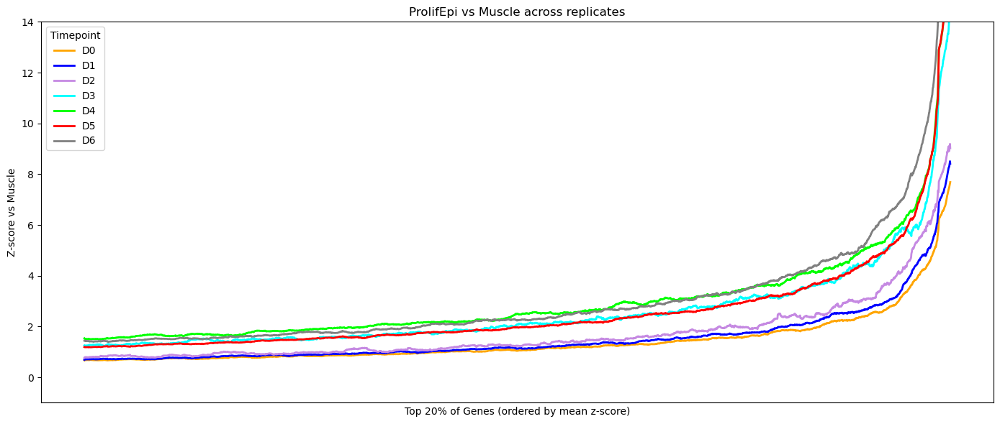

In [ ]:

mean_zscore["overall_mean"] = mean_zscore.mean(axis=1)
sorted_zscore = mean_zscore.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_n = int(sorted_zscore.shape[0] * top_gene_fraction)

top_genes = sorted_zscore.iloc[:top_n].index
top_zscore = mean_zscore.loc[top_genes]

# plot
x = np.arange(top_zscore.shape[0])

times = [t for t in ['D0', "D1", "D2", "D3", "D4", "D5", "D6"] if t in top_zscore.columns]

custom_colors = {
    'D0': "#FFA500",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D4": "#00FF00",
    "D5": "#FF0000",
    "D6": "#808080"
}

plt.figure(figsize=(14, 6))

for timepoint in times:
    y = top_zscore[timepoint].rolling(
        window=100, center=True, min_periods=1
    ).mean()

    plt.plot(
        x,
        y,
        label=timepoint,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(timepoint)
    )

plt.xlabel(f"Top {int(top_gene_fraction * 100)}% of Genes (ordered by mean z-score)")
plt.ylabel("Z-score vs Muscle")
plt.title("ProlifEpi vs Muscle across replicates")
plt.ylim(-1, 14)
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()

plt.tight_layout()
plt.show()

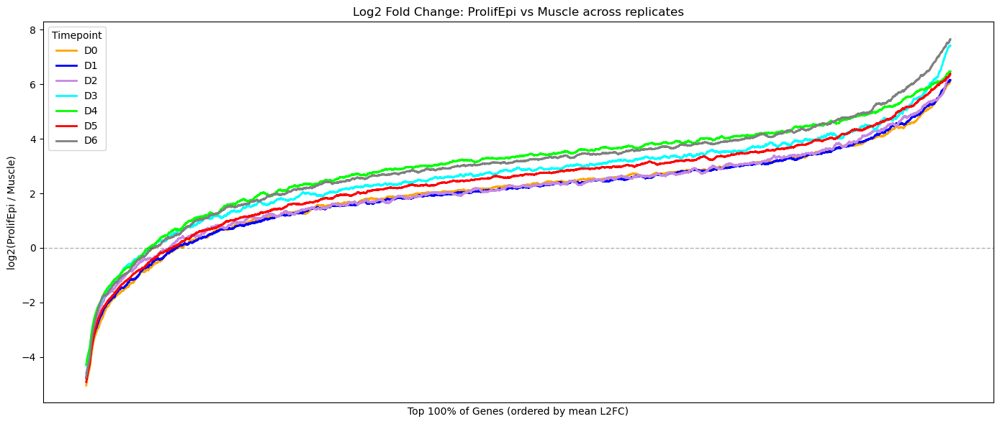

In [ ]:
# log2 fold-change vs muscle ; no rep1
# remove genes with 0 count in any timepoint (muscle or prolifepi)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def normalize_time_label(label):
    if "Non-IR" in label:
        return "D0"
    for t in ["D0", "D1", "D2", "D3", "D4", "D5", "D6"]:
        if t in label:
            return t
    return None


replicates = [filtered_rep2, filtered_rep3, filtered_rep4]

rep_fc_list = []

# pseudocount to avoid log(0)
eps = 0


for rep in replicates:
    gene_counts = pd.DataFrame(rep.X.toarray(), columns=rep.var.index)

    # Metadata
    gene_counts["raw_time"] = rep.obs["time"].values
    gene_counts["time"] = gene_counts["raw_time"].apply(normalize_time_label)
    gene_counts["ProlifEpi"] = rep.obs["ProlifEpi"].values
    gene_counts["Muscle"] = rep.obs["Muscle"].values

    gene_counts = gene_counts.dropna(subset=["time"])

    numeric_cols = gene_counts.select_dtypes(include=[np.number]).columns


    prolif_cells = gene_counts[gene_counts["ProlifEpi"] == "Yes"]
    muscle_cells = gene_counts[gene_counts["Muscle"] == "Yes"]

    if prolif_cells.empty or muscle_cells.empty:
        continue

    # prolif epi averaging
    subgroup_avg = prolif_cells.groupby("raw_time")[numeric_cols].mean()

    subgroup_avg["time"] = subgroup_avg.index.map(normalize_time_label)
    subgroup_avg = subgroup_avg.dropna(subset=["time"])

    prolif_time_avg = subgroup_avg.groupby("time").mean().transpose()

    # muscle mean
    muscle_mean = (
        muscle_cells.groupby("time")[numeric_cols]
        .mean()
        .transpose()
    )

    # align timepoints
    common_times = sorted(
        list(set(prolif_time_avg.columns).intersection(muscle_mean.columns))
    )

    if len(common_times) == 0:
        continue

    prolif_time_avg = prolif_time_avg[common_times]
    muscle_mean = muscle_mean[common_times]

    # l2fc
    valid_mask = (prolif_time_avg > 0) & (muscle_mean > 0)
    valid_genes = valid_mask.all(axis=1)
    prolif_time_avg = prolif_time_avg.loc[valid_genes]
    muscle_mean = muscle_mean.loc[valid_genes]

    log2_fc = np.log2(prolif_time_avg / muscle_mean)
    
    rep_fc_list.append(log2_fc)

#align genes
common_genes = set(rep_fc_list[0].index)
for df in rep_fc_list[1:]:
    common_genes = common_genes.intersection(df.index)

common_genes = list(common_genes)
rep_fc_list = [df.loc[common_genes] for df in rep_fc_list]

# average across reps
combined = pd.concat(
    rep_fc_list,
    keys=range(len(rep_fc_list)),
    names=["replicate", "gene"]
)

mean_fc = combined.groupby("gene").mean()

# select top genes
mean_fc["overall_mean"] = mean_fc.mean(axis=1)
sorted_fc = mean_fc.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 1
top_n = int(sorted_fc.shape[0] * top_gene_fraction)

top_genes = sorted_fc.iloc[:top_n].index
top_fc = mean_fc.loc[top_genes]

# plot
x = np.arange(top_fc.shape[0])

times = [t for t in ['D0', "D1", "D2", "D3", "D4", "D5", "D6"] if t in top_fc.columns]

custom_colors = {
    'D0': "#FFA500",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    "D4": "#00FF00",
    "D5": "#FF0000",
    "D6": "#808080"
}

plt.figure(figsize=(14, 6))

for timepoint in times:
    y = top_fc[timepoint].rolling(
        window=100, center=True, min_periods=1
    ).mean()

    plt.plot(
        x,
        y,
        label=timepoint,
        linewidth=2,
        linestyle='-',
        color=custom_colors.get(timepoint)
    )


plt.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.3) # plot x-axis
plt.xlabel(f"Top {int(top_gene_fraction * 100)}% of Genes (ordered by mean L2FC)")
plt.ylabel("log2(ProlifEpi / Muscle)")
plt.title("Log2 Fold Change: ProlifEpi vs Muscle across replicates")
plt.legend(title="Timepoint")
plt.xticks([], [])
plt.gca().invert_xaxis()

plt.tight_layout()
plt.show()

### ISC coexpression

In [10]:
plt.rcParams['figure.figsize'] = [20, 20]

In [ ]:
#epithelial filtering
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression')
].copy()

In [ ]:
#
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 4 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 4 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression')
].copy()

In [ ]:
genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']

expr = adata_Verzi[:, genes].X.toarray() if hasattr(adata_Verzi[:, genes].X, "toarray") else adata_Verzi[:, genes].X

df = pd.DataFrame(expr, columns=genes)

corr = df.corr()

sns.clustermap(corr, annot=True, center=0, vmax = 0.35)
plt.show()


In [ ]:
# filtered epithelial stem correlation matrix
genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']

expr = filtered_adata[:, genes].X.toarray() if hasattr(adata_Verzi[:, genes].X, "toarray") else filtered_adata[:, genes].X

df = pd.DataFrame(expr, columns=genes)

corr = df.corr()

sns.clustermap(corr, annot=True, center=0, vmax = 0.35)
plt.show()


In [ ]:
# filtered epi correlation matrix
genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg', 'Ada', 'Bmp8a']

expr = filtered_adata[:, genes].X.toarray() if hasattr(adata_Verzi[:, genes].X, "toarray") else filtered_adata[:, genes].X

# Create DataFrame
df = pd.DataFrame(expr, columns=genes)

corr = df.corr()

# Plot heatmap
sns.heatmap(corr, annot=True, center=0, vmax = 0.35)
plt.show()


In [ ]:
# percent gene expressed and percent with each other
import numpy as np
import pandas as pd
import itertools

genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']
valid_genes = [g for g in genes if g in adata_Verzi.var_names]

expr = adata_Verzi[:, valid_genes].X
if hasattr(expr, "toarray"):  # for sparse matrices
    expr = expr.toarray()

bin_expr = (expr > 0).astype(int)

df_bin = pd.DataFrame(bin_expr, columns=valid_genes)

# co-expression frequency for all gene pairs
results = {}
for g1, g2 in itertools.combinations(valid_genes, 2):
    both = ((df_bin[g1] == 1) & (df_bin[g2] == 1)).sum()
    freq = both / df_bin.shape[0]  # fraction of all cells
    results[(g1, g2)] = freq

# matrix (gene x gene)
coexpr_matrix = pd.DataFrame(
    np.zeros((len(valid_genes), len(valid_genes))),
    index=valid_genes,
    columns=valid_genes
)

for (g1, g2), freq in results.items():
    coexpr_matrix.loc[g1, g2] = freq
    coexpr_matrix.loc[g2, g1] = freq

# Diagonal = fraction of cells expressing each gene individually
for g in valid_genes:
    coexpr_matrix.loc[g, g] = df_bin[g].sum() / df_bin.shape[0]

coexpr_matrix


Valid genes: ['Ascl2', 'Lgr5', 'Olfm4', 'Lrig1', 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']


,Ascl2,Lgr5,Olfm4,Lrig1,Tert,Hopx,Bmi1,Ly6a,Tacstd2,Anxa1,Spp1,Clu,Areg
Ascl2,0.008478,0.000257,0.004973,0.003718,0.000213,0.003659,0.000772,0.001730,0.000021,0.000497,0.000006,0.001115,0.001171
Lgr5,0.000257,0.004686,0.001813,0.001142,0.000050,0.001074,0.000322,0.000562,0.000006,0.000198,0.000012,0.000399,0.000571
Olfm4,0.004973,0.001813,0.082789,0.026185,0.001500,0.026398,0.005579,0.007221,0.000092,0.002698,0.000112,0.005638,0.006200
Lrig1,0.003718,0.001142,0.026185,0.093251,0.001677,0.022609,0.006324,0.009436,0.000112,0.003470,0.000124,0.007579,0.009052
Tert,0.000213,0.000050,0.001500,0.001677,0.008830,0.002242,0.000562,0.000825,0.000015,0.000251,0.000003,0.000624,0.001118
Hopx,0.003659,0.001074,0.026398,0.022609,0.002242,0.101043,0.006490,0.010540,0.000118,0.003488,0.000112,0.007224,0.014598
Bmi1,0.000772,0.000322,0.005579,0.006324,0.000562,0.006490,0.033959,0.003514,0.000018,0.001094,0.000053,0.002550,0.004733
Ly6a,0.001730,0.000562,0.007221,0.009436,0.000825,0.010540,0.003514,0.047995,0.000124,0.003940,0.000154,0.007925,0.009448
Tacstd2,0.000021,0.000006,0.000092,0.000112,0.000015,0.000118,0.000018,0.000124,0.000429,0.000071,0.000000,0.000204,0.000139
Anxa1,0.000497,0.000198,0.002698,0.003470,0.000251,0.003488,0.001094,0.003940,0.000071,0.017654,0.000133,0.003834,0.003514


In [ ]:
# Conditional probability matrix: P(B|A) = P(A and B) / P(A)
# full data

import numpy as np
import pandas as pd
import itertools

genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']
valid_genes = [g for g in genes if g in adata_Verzi.var_names]

expr = adata_Verzi[:, valid_genes].X
if hasattr(expr, "toarray"): 
    expr = expr.toarray()

bin_expr = (expr > 0).astype(int)
df_bin = pd.DataFrame(bin_expr, columns=valid_genes)

n_cells = df_bin.shape[0]

# Matrix of unconditional frequencies
freq_matrix = pd.DataFrame(
    np.zeros((len(valid_genes), len(valid_genes))),
    index=valid_genes,
    columns=valid_genes
)

for g1, g2 in itertools.product(valid_genes, valid_genes):
    both = ((df_bin[g1] == 1) & (df_bin[g2] == 1)).sum()
    freq = both / n_cells
    freq_matrix.loc[g1, g2] = freq

# Conditional probability matrix: P(B|A) = P(A and B) / P(A)
cond_matrix = pd.DataFrame(
    np.zeros((len(valid_genes), len(valid_genes))),
    index=valid_genes,
    columns=valid_genes
)

for g1, g2 in itertools.product(valid_genes, valid_genes):
    p_a = freq_matrix.loc[g1, g1]
    if p_a > 0:
        cond_matrix.loc[g1, g2] = freq_matrix.loc[g1, g2] / p_a
    else:
        cond_matrix.loc[g1, g2] = np.nan 

cond_matrix


,Ascl2,Lgr5,Olfm4,Lrig1,Tert,Hopx,Bmi1,Ly6a,Tacstd2,Anxa1,Spp1,Clu,Areg
Ascl2,1.000000,0.030356,0.586532,0.438590,0.025122,0.431612,0.091068,0.204117,0.002442,0.058618,0.000698,0.131542,0.138172
Lgr5,0.054924,1.000000,0.386995,0.243687,0.010732,0.229167,0.068813,0.119949,0.001263,0.042298,0.002525,0.085227,0.121843
Olfm4,0.060064,0.021903,1.000000,0.316290,0.018116,0.318862,0.067388,0.087219,0.001108,0.032587,0.001358,0.068103,0.074892
Lrig1,0.039874,0.012245,0.280802,1.000000,0.017986,0.242450,0.067821,0.101193,0.001205,0.037210,0.001332,0.081271,0.097069
Tert,0.024121,0.005695,0.169849,0.189950,1.000000,0.253936,0.063652,0.093467,0.001675,0.028476,0.000335,0.070687,0.126633
Hopx,0.036214,0.010627,0.261257,0.223754,0.022191,1.000000,0.064231,0.104309,0.001171,0.034516,0.001112,0.071491,0.144476
Bmi1,0.022735,0.009495,0.164286,0.186237,0.016551,0.191115,1.000000,0.103484,0.000523,0.032230,0.001568,0.075087,0.139373
Ly6a,0.036055,0.011710,0.150447,0.196610,0.017196,0.219599,0.073220,1.000000,0.002589,0.082096,0.003205,0.165116,0.196857
Tacstd2,0.048276,0.013793,0.213793,0.262069,0.034483,0.275862,0.041379,0.289655,1.000000,0.165517,0.000000,0.475862,0.324138
Anxa1,0.028150,0.011227,0.152815,0.196548,0.014243,0.197554,0.061997,0.223190,0.004021,1.000000,0.007540,0.217158,0.199062


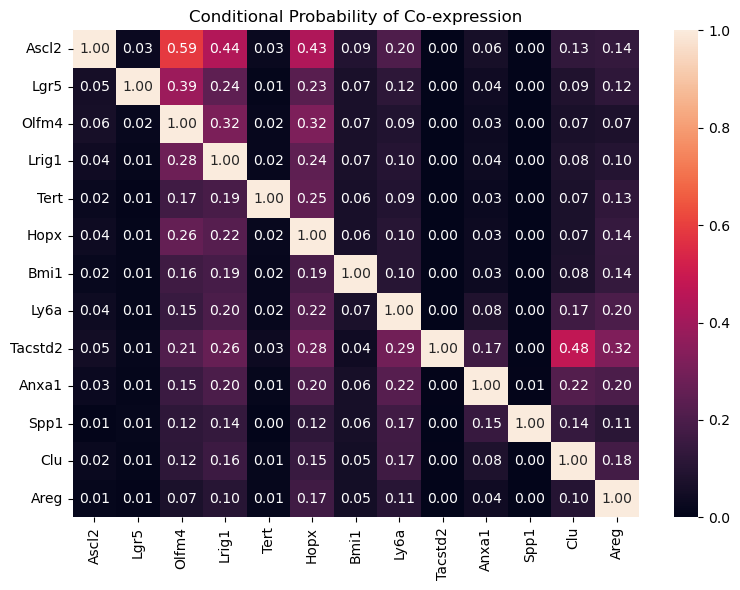

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
sns.heatmap(cond_matrix, annot=True, fmt=".2f",
            #cbar_kws={'label': 'P(B|A)'}
           )
plt.title("Conditional Probability of Co-expression")
#plt.xlabel("B")
#plt.ylabel("A")
plt.tight_layout()
plt.show()


In [ ]:
# conditional probability, epi filtered
import numpy as np
import pandas as pd
import itertools

genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']
valid_genes = [g for g in genes if g in filtered_adata.var_names]

expr = filtered_adata[:, valid_genes].X
if hasattr(expr, "toarray"): 
    expr = expr.toarray()

bin_expr = (expr > 0).astype(int)
df_bin = pd.DataFrame(bin_expr, columns=valid_genes)

n_cells = df_bin.shape[0]

# Matrix of unconditional frequencies
freq_matrix = pd.DataFrame(
    np.zeros((len(valid_genes), len(valid_genes))),
    index=valid_genes,
    columns=valid_genes
)

for g1, g2 in itertools.product(valid_genes, valid_genes):
    both = ((df_bin[g1] == 1) & (df_bin[g2] == 1)).sum()
    freq = both / n_cells
    freq_matrix.loc[g1, g2] = freq

# Conditional probability matrix: P(B|A) = P(A and B) / P(A)
cond_matrix = pd.DataFrame(
    np.zeros((len(valid_genes), len(valid_genes))),
    index=valid_genes,
    columns=valid_genes
)

for g1, g2 in itertools.product(valid_genes, valid_genes):
    p_a = freq_matrix.loc[g1, g1]
    if p_a > 0:
        cond_matrix.loc[g1, g2] = freq_matrix.loc[g1, g2] / p_a
    else:
        cond_matrix.loc[g1, g2] = np.nan 

cond_matrix


,Ascl2,Lgr5,Olfm4,Lrig1,Tert,Hopx,Bmi1,Ly6a,Tacstd2,Anxa1,Spp1,Clu,Areg
Ascl2,1.000000,0.029930,0.614877,0.486796,0.027289,0.476232,0.104313,0.230634,0.003081,0.065581,0.000880,0.143486,0.157130
Lgr5,0.054972,1.000000,0.354082,0.240097,0.010509,0.237672,0.078416,0.132579,0.001617,0.046888,0.003234,0.092158,0.135812
Olfm4,0.072459,0.022718,1.000000,0.366961,0.022044,0.381432,0.079979,0.100415,0.001349,0.035425,0.001297,0.072614,0.091079
Lrig1,0.056475,0.015165,0.361264,1.000000,0.025888,0.341963,0.084201,0.135263,0.001685,0.044781,0.001328,0.092065,0.140727
Tert,0.023547,0.004937,0.161413,0.192556,1.000000,0.262438,0.066844,0.096848,0.001519,0.028864,0.000380,0.065325,0.135207
Hopx,0.036989,0.010051,0.251402,0.228942,0.023622,1.000000,0.068679,0.107822,0.001231,0.035519,0.001128,0.071346,0.157083
Bmi1,0.027098,0.011091,0.176309,0.188543,0.020123,0.229705,1.000000,0.115253,0.000457,0.033844,0.001258,0.069975,0.172879
Ly6a,0.043751,0.013693,0.161643,0.221174,0.021291,0.263338,0.084161,1.000000,0.003340,0.093346,0.003089,0.172497,0.245137
Tacstd2,0.059829,0.017094,0.222222,0.282051,0.034188,0.307692,0.034188,0.341880,1.000000,0.188034,0.000000,0.538462,0.367521
Anxa1,0.038313,0.014914,0.175624,0.225508,0.019542,0.267164,0.076112,0.287478,0.005657,1.000000,0.008743,0.268964,0.284135


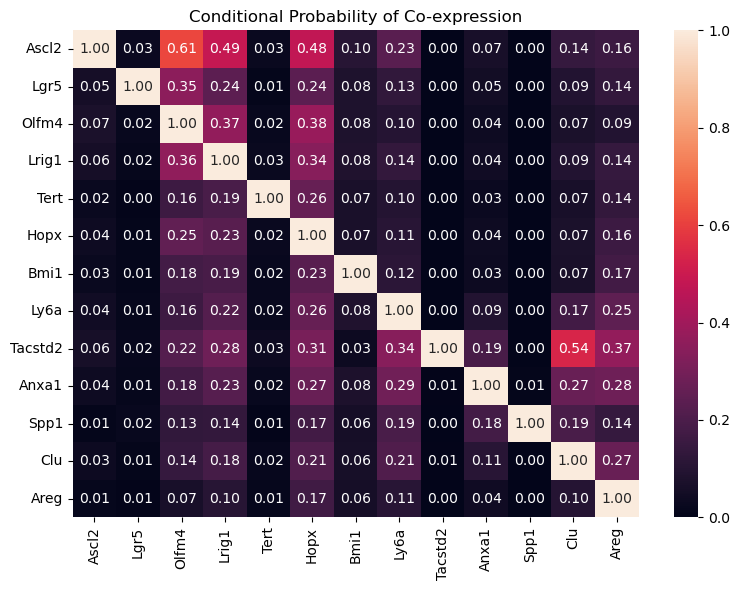

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
sns.heatmap(cond_matrix, annot=True, fmt=".2f",
            #cbar_kws={'label': 'P(B|A)'}
           )
plt.title("Conditional Probability of Co-expression")
#plt.xlabel("B")
#plt.ylabel("A")
plt.tight_layout()
plt.show()


In [ ]:
## conditional probability by metadata (obs group)


import numpy as np
import pandas as pd
import itertools

group_key = "time"
groups = adata_Verzi.obs[group_key].unique()

genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']
valid_genes = [g for g in genes if g in adata_Verzi.var_names]

cond_results = {}

for grp in groups:
    adata_sub = adata_Verzi[adata_Verzi.obs[group_key] == grp, :]

    expr = adata_sub[:, valid_genes].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray()

    bin_expr = (expr > 0).astype(int)
    df_bin = pd.DataFrame(bin_expr, columns=valid_genes)

    n_cells = df_bin.shape[0]

    # Unconditional frequencies
    freq_matrix = pd.DataFrame(
        np.zeros((len(valid_genes), len(valid_genes))),
        index=valid_genes,
        columns=valid_genes
    )

    for g1, g2 in itertools.product(valid_genes, valid_genes):
        both = ((df_bin[g1] == 1) & (df_bin[g2] == 1)).sum()
        freq = both / n_cells
        freq_matrix.loc[g1, g2] = freq

    # Conditional probabilities
    cond_matrix = pd.DataFrame(
        np.zeros((len(valid_genes), len(valid_genes))),
        index=valid_genes,
        columns=valid_genes
    )

    for g1, g2 in itertools.product(valid_genes, valid_genes):
        p_a = freq_matrix.loc[g1, g1]
        if p_a > 0:
            cond_matrix.loc[g1, g2] = freq_matrix.loc[g1, g2] / p_a
        else:
            cond_matrix.loc[g1, g2] = np.nan

    cond_results[grp] = cond_matrix


In [ ]:
# for filtered epi

import pandas as pd
import numpy as np

genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']
valid_genes = [g for g in genes if g in filtered_adata.var_names]

group_key = "time" 
groups = filtered_adata.obs[group_key].unique()

corr_results = {}

for grp in groups:
    adata_sub = filtered_adata[filtered_adata.obs[group_key] == grp, :]
    
    if adata_sub.n_obs == 0:
        continue
    
    expr = adata_sub[:, valid_genes].X
    if hasattr(expr, "toarray"):  # sparse -> dense
        expr = expr.toarray()
    
    df_expr = pd.DataFrame(expr, columns=valid_genes)
    
    corr_matrix = df_expr.corr(method="pearson")
    
    corr_results[grp] = corr_matrix


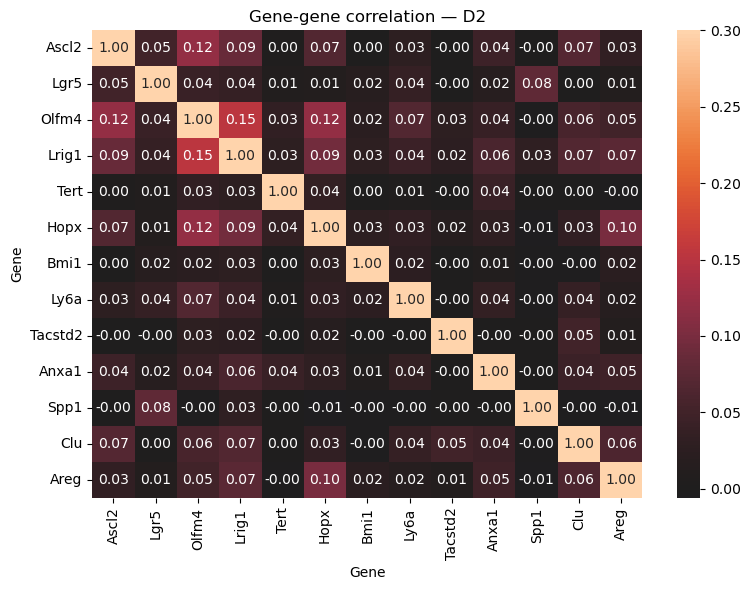

In [63]:
grp = 'D2'
plt.figure(figsize=(8,6))
sns.heatmap(corr_results[grp], annot=True, center=0, fmt=".2f", vmax = 0.3)
plt.title(f"Gene-gene correlation — {grp}")
plt.xlabel("Gene")
plt.ylabel("Gene")
plt.tight_layout()
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for grp, corr_matrix in corr_results.items():
    plt.figure(figsize=(8,6))
    sns.heatmap(corr_matrix, annot=True, center=0, fmt=".2f")
    plt.title(f"Gene-gene correlation — {grp}")
    plt.xlabel("Gene")
    plt.ylabel("Gene")
    plt.tight_layout()
    plt.show()


In [ ]:
#gene correlation filtered

genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']
valid_genes = [g for g in genes if g in filtered_adata.var_names]

group_key = "time"  
groups = filtered_adata.obs[group_key].unique()

corr_results = {}

for grp in groups:
    adata_sub = filtered_adata[filtered_adata.obs[group_key] == grp, :]
    
    if adata_sub.n_obs == 0:
        continue
    
    expr = adata_sub[:, valid_genes].X
    if hasattr(expr, "toarray"):  # sparse -> dense
        expr = expr.toarray()
    
    df_expr = pd.DataFrame(expr, columns=valid_genes)
    
    corr_matrix = df_expr.corr(method="pearson")
    
    corr_results[grp] = corr_matrix


In [ ]:
grp = 'D1'
plt.figure(figsize=(7,7))
sns.clustermap(corr_results[grp], metric = 'correlation', method = 'average', annot=True, center=0, fmt=".2f", vmax = 0.4)
plt.title(f"Gene-gene correlation — {grp}")
#plt.xlabel("Gene")
#plt.ylabel("Gene")
#plt.tight_layout()
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for grp, corr_matrix in corr_results.items():
    plt.figure(figsize=(8,6))
    sns.heatmap(corr_matrix, annot=True, center=0, fmt=".2f")
    plt.title(f"Gene-gene correlation — {grp}")
    plt.xlabel("Gene")
    plt.ylabel("Gene")
    plt.tight_layout()
    plt.show()

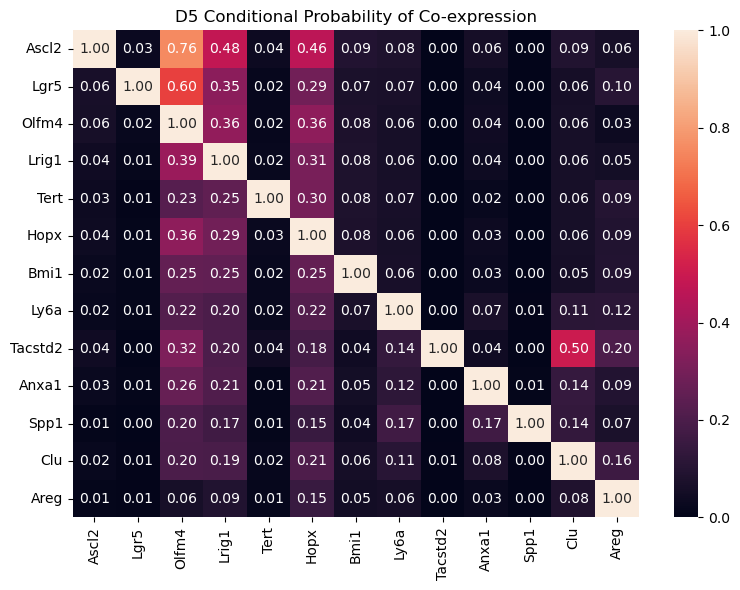

In [72]:
plt.figure(figsize=(8,6))
tempvar = 'D5'
sns.heatmap(cond_results[tempvar], annot=True, fmt=".2f",
            #cbar_kws={'label': 'P(B|A)'}
           )
plt.title(tempvar + " Conditional Probability of Co-expression")
#plt.xlabel("B")
#plt.ylabel("A")
plt.tight_layout()
plt.show()


In [ ]:
#filtered
#conditional frequency
## by obs group
import numpy as np
import pandas as pd
import itertools

group_key = "time" 
groups = filtered_adata.obs[group_key].unique()

genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6a', 'Tacstd2', 'Anxa1', 'Spp1', 'Clu', 'Areg']
valid_genes = [g for g in genes if g in filtered_adata.var_names]

cond_results = {}

for grp in groups:
    adata_sub = filtered_adata[filtered_adata.obs[group_key] == grp, :]

    expr = adata_sub[:, valid_genes].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray()

    bin_expr = (expr > 0).astype(int)
    df_bin = pd.DataFrame(bin_expr, columns=valid_genes)

    n_cells = df_bin.shape[0]

    # Unconditional frequencies
    freq_matrix = pd.DataFrame(
        np.zeros((len(valid_genes), len(valid_genes))),
        index=valid_genes,
        columns=valid_genes
    )

    for g1, g2 in itertools.product(valid_genes, valid_genes):
        both = ((df_bin[g1] == 1) & (df_bin[g2] == 1)).sum()
        freq = both / n_cells
        freq_matrix.loc[g1, g2] = freq

    # Conditional probabilities
    cond_matrix = pd.DataFrame(
        np.zeros((len(valid_genes), len(valid_genes))),
        index=valid_genes,
        columns=valid_genes
    )

    for g1, g2 in itertools.product(valid_genes, valid_genes):
        p_a = freq_matrix.loc[g1, g1]
        if p_a > 0:
            cond_matrix.loc[g1, g2] = freq_matrix.loc[g1, g2] / p_a
        else:
            cond_matrix.loc[g1, g2] = np.nan

    cond_results[grp] = cond_matrix


In [ ]:
plt.figure(figsize=(8,6))
grp = 'D5'
sns.clustermap(cond_results[grp], annot=True, fmt=".2f",
            #cbar_kws={'label': 'P(B|A)'}
           )
plt.title(grp + " Conditional Probability of Co-expression")
#plt.xlabel("B")
#plt.ylabel("A")
#plt.tight_layout()
plt.show()


In [79]:
genes = ["Ascl2", "Lgr5", "Olfm4", "Lrig1", 'Tert', 'Hopx', 'Bmi1',
    "Spp1", "Gja1", "Ctgf", "Basp1", "Tacstd2",
    "Car2", "Sftpd", "Mal", "Clu", "Wfdc2",
    "Msln", "Vsig1", "Expi", "Tubb6", "Ly6a",
    "Syt14l", "Crip2", "Anxa1", "Col4a1", "Il33",
    "Ly6f", "Sprr1a", "Lor", "Col4a2", "Krt4",
    "Igfbp7", "Akap13", "Sptssb", "Ecscr", "Ivl",
    "Gkn1", "Akr1b8", "Cdh13", "Slc45a3", "Efna5",
    "Anxa8", "1700007K13Rik", "Acsm3", "Ppic", "Anxa3",
    "Eda2r", "S100a6", "Ldh2", "Ly6c", "Efemp1",
    "Ddit4l", "Pdzk1ip1", "Ly6d", "2310002J15Rik", "Cugbp2"
]


In [ ]:
#gene corelation filtered

valid_genes = [g for g in genes if g in filtered_adata.var_names]

group_key = "time"  
groups = filtered_adata.obs[group_key].unique()

corr_results = {}

for grp in groups:
    adata_sub = filtered_adata[filtered_adata.obs[group_key] == grp, :]
    
    if adata_sub.n_obs == 0:
        continue
    
    expr = adata_sub[:, valid_genes].X
    if hasattr(expr, "toarray"):  # sparse -> dense
        expr = expr.toarray()
    
    df_expr = pd.DataFrame(expr, columns=valid_genes)
    
    corr_matrix = df_expr.corr(method="pearson").reindex(
    index=valid_genes, columns=valid_genes
)

    
    corr_results[grp] = corr_matrix


In [ ]:
grp = 'D0'
plt.figure(figsize=(800,800))
sns.clustermap(corr_results[grp], metric = 'correlation', method = 'average', annot=False, center=0, fmt=".2f", vmax = 0.4,
              cmap = 'vlag',
                  linewidths=0.5, linecolor="black")
plt.title(f"Gene-gene correlation — {grp}")
#plt.xlabel("Gene")
#plt.ylabel("Gene")
#plt.tight_layout()
plt.show()

In [ ]:
grp = 'D1'
g = sns.clustermap(
    corr_results[grp],
    metric='correlation',
    method='average',
    annot=False,
    center=0,
    fmt=".2f",
    vmax=0.4,
    cmap='vlag',
    linewidths=0.5,
    linecolor="black",
    xticklabels=True, 
    yticklabels=True
)

# Force all labels to show
#g.ax_heatmap.set_xticks(np.arange(len(corr_results[grp].columns)) + 0.5)
#g.ax_heatmap.set_xticklabels(corr_results[grp].columns, rotation=90)

#g.ax_heatmap.set_yticks(np.arange(len(corr_results[grp].index)) + 0.5)
#g.ax_heatmap.set_yticklabels(corr_results[grp].index, rotation=0)

#plt.setp(g.ax_heatmap.get_xticklabels(), fontsize=6)
#plt.setp(g.ax_heatmap.get_yticklabels(), fontsize=6)

plt.title(f"Gene-gene correlation — {grp}")
plt.show()


#### correlation

In [ ]:
adata_Verzi = adata

In [58]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression')
].copy()

/tmp/ipykernel_3325/3117326773.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]


In [59]:
#adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 10 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
#adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 10 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
#adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]
#filtered_adata = adata_Verzi[
#    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression')
#].copy()

In [60]:
sc.pp.normalize_per_cell(filtered_adata, counts_per_cell_after=10**6)
sc.pp.log1p(filtered_adata)

In [23]:
genes = ["Ascl2", "Lgr5", "Olfm4", 'Smoc2', 'Hmga2', 'Top2a', 'Msln', "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6d', 'Ly6a', 'Tacstd2', 'Anxa1', 'Anxa8', 'Anxa10', 'Spp1', 'Clu', 'Areg', 'Ereg']

In [24]:
genes = ["Ascl2", "Lgr5", "Olfm4", 'Smoc2', 'Hmga2', 'Top2a', 'Msln', "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6d', 'Tacstd2', 'Anxa1', 'Anxa8', 'Anxa10', 'Spp1', 'Clu', 'Areg', 'Ereg']
#no ly6a

In [61]:
genes = ["Ascl2", "Lgr5", "Olfm4", 'Smoc2', 'Hmga2', 'Top2a', 'Msln', "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6d', 'Tacstd2', 'Anxa1', 'Anxa8', 'Anxa10', 'Spp1', 'Clu', 'Areg', 'Ereg', 'Fgfbp1']
#no ly6a

In [62]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
#gene correlation filtered

valid_genes = [g for g in genes if g in filtered_adata.var_names]

group_key = "time"  
groups = filtered_adata.obs[group_key].unique()

corr_results = {}

for grp in groups:
    adata_sub = filtered_adata[filtered_adata.obs[group_key] == grp, :]
    
    if adata_sub.n_obs == 0:
        continue
    
    expr = adata_sub[:, valid_genes].X
    if hasattr(expr, "toarray"):  # sparse -> dense
        expr = expr.toarray()
    
    df_expr = pd.DataFrame(expr, columns=valid_genes)
    
    corr_matrix = df_expr.corr(method="pearson").reindex(
    index=valid_genes, columns=valid_genes
)

    
    corr_results[grp] = corr_matrix


In [64]:
sns.set(font_scale=1.5)

In [ ]:
grp = 'D3'
g = sns.clustermap(corr_results[grp], metric = 'correlation', method = 'average', annot=False, 
            center=0, fmt=".2f", vmax = 0.5, vmin = -0.2,
            cmap = 'vlag',
            cbar_pos=(1.05, 0.2, 0.03, 0.4),  # (x, y, width, height)
            linewidths=0.5, linecolor="black", dendrogram_ratio=(0.14), colors_ratio = 0.005, 
            figsize = (10,10),
            tree_kws=dict(linewidths=1.5))
plt.title(f"{grp}")
#plt.xlabel("Gene")
#plt.ylabel("Gene")
#plt.tight_layout()
g.ax_heatmap.tick_params(axis='both', which='both', length=0)
plt.show()

In [ ]:
#big gene list
grp = 'D1'
g = sns.clustermap(
    corr_results[grp],
    metric='correlation',
    method='average',
    annot=False,
    center=0,
    fmt=".2f",
    vmax=0.4,
    cmap='vlag',
    linewidths=0.5,
    linecolor="black",
    xticklabels=True, 
    yticklabels=True
)

# Force all labels to show
#g.ax_heatmap.set_xticks(np.arange(len(corr_results[grp].columns)) + 0.5)
#g.ax_heatmap.set_xticklabels(corr_results[grp].columns, rotation=90)

#g.ax_heatmap.set_yticks(np.arange(len(corr_results[grp].index)) + 0.5)
#g.ax_heatmap.set_yticklabels(corr_results[grp].index, rotation=0)

#plt.setp(g.ax_heatmap.get_xticklabels(), fontsize=6)  # optional: adjust font size
#plt.setp(g.ax_heatmap.get_yticklabels(), fontsize=6)

plt.title(f"Gene-gene correlation — {grp}")
plt.show()


#### other gene correlations

In [118]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [23]:
genes = ["Ascl2", "Lgr5", "Olfm4", 'Smoc2', 'Hmga2', 'Top2a', 'Msln', "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6d', 'Tacstd2', 'Anxa1', 'Anxa8', 'Anxa10', 'Spp1', 'Clu', 'Areg', 'Ereg',
        'Lyz1', 'Mmp7', 'Cd24a']

In [26]:
genes = ["Ascl2", "Lgr5", "Olfm4", 'Smoc2', 'Hmga2', 'Top2a', 'Msln', "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6d', 'Tacstd2', 'Anxa1', 'Anxa8', 'Anxa10', 'Spp1', 'Clu', 'Areg', 'Ereg',
        'Avil', 'Dclk1', 'Pou2f3', 'Trpm5']

In [29]:
genes = ["Ascl2", "Lgr5", "Olfm4", 'Smoc2', 'Hmga2', 'Top2a', 'Msln', "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6d', 'Tacstd2', 'Anxa1', 'Anxa8', 'Anxa10', 'Spp1', 'Clu', 'Areg', 'Ereg',
        'Neurog3', 'Neurod1', 'Pax4', 'Chga']

In [35]:
genes = ["Ascl2", "Lgr5", "Olfm4", 'Smoc2', 'Hmga2', 'Top2a', 'Msln', "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6d', 'Tacstd2', 'Anxa1', 'Anxa8', 'Anxa10', 'Spp1', 'Clu', 'Areg', 'Ereg',
        'Mki67', 'Pcna']

In [38]:
genes = ["Ascl2", "Lgr5", "Olfm4", 'Smoc2', 'Hmga2', 'Top2a', 'Msln', "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6d', 'Tacstd2', 'Anxa1', 'Anxa8', 'Anxa10', 'Spp1', 'Clu', 'Areg', 'Ereg',
        'Muc2', 'Tff3']

In [41]:
genes = ["Ascl2", "Lgr5", "Olfm4", 'Smoc2', 'Hmga2', 'Top2a', 'Msln', "Lrig1", 'Tert', 'Hopx', 'Bmi1', 'Ly6d', 'Tacstd2', 'Anxa1', 'Anxa8', 'Anxa10', 'Spp1', 'Clu', 'Areg', 'Ereg',
        'Alpi', 'Krt20', 'Slc10a2']

In [35]:
genes = ['Tgfb1', 'Cd14', 'Fcgr3', 'Adgre1', 'Lyz2', 'Itgam']

In [56]:
filtered_adata = adata_Verzi

In [ ]:
#gene corelation filtered

valid_genes = [g for g in genes if g in filtered_adata.var_names]

group_key = "time"  
groups = filtered_adata.obs[group_key].unique()

corr_results = {}

for grp in groups:
    adata_sub = filtered_adata[filtered_adata.obs[group_key] == grp, :]
    
    if adata_sub.n_obs == 0:
        continue
    
    expr = adata_sub[:, valid_genes].X
    if hasattr(expr, "toarray"):  # sparse -> dense
        expr = expr.toarray()
    
    df_expr = pd.DataFrame(expr, columns=valid_genes)
    
    corr_matrix = df_expr.corr(method="pearson").reindex(
    index=valid_genes, columns=valid_genes
)

    
    corr_results[grp] = corr_matrix


In [ ]:
sns.set(font_scale=1.5)

grp = 'D5'
g = sns.clustermap(corr_results[grp], metric = 'correlation', method = 'average', annot=True, 
            center=0, fmt=".2f", vmax = 0.5,
            cmap = 'vlag',
            cbar_pos=(1.05, 0.2, 0.03, 0.4),  # (x, y, width, height)
            linewidths=0.5, linecolor="black", dendrogram_ratio=(0.14), colors_ratio = 0.005, 
            figsize = (10,10),
            tree_kws=dict(linewidths=1.5))
plt.title(f"{grp}")
#plt.xlabel("Gene")
#plt.ylabel("Gene")
#plt.tight_layout()
g.ax_heatmap.tick_params(axis='both', which='both', length=0)  # optional
plt.show()

### distance SC to muscle

single genes expression distance measuring

In [113]:
adata_Verzi.uns["scalefactors"]

{'microns_per_pixel': 0.3443494972902308,
 'tissue_lowres_scalef': 0.011402725,
 'fiducial_diameter_fullres': 958.3286823324836,
 'tissue_hires_scalef': 0.114027254,
 'regist_target_img_scalef': 0.114027254}

In [114]:
#adata_Verzi = adata_Verzi[adata_Verzi.obs['time'].isin(['D0', 'D1', 'D3', 'D5'])].copy()

In [115]:
adata_Verzi.obs

,cell_numeric_id,time,GraphBased,Recluster2.16,n_counts,Epcam+,Vil1+,Mki67+,DistToC5SameTime,n_counts_norm
cellid_000290166-1,290166,D3,Cluster 5,NaN,1319.0,low_expression,low_expression,low_expression,0.000000,6616.455566
cellid_000290167-1,290167,D3,Cluster 5,NaN,691.0,low_expression,low_expression,low_expression,0.000000,3997.403076
cellid_000290169-1,290169,D0,Cluster 1,NaN,1775.0,high_expression,high_expression,low_expression,237.410599,6935.478027
cellid_000290170-1,290170,D0,Cluster 5,NaN,1277.0,low_expression,low_expression,low_expression,0.000000,6406.325684
cellid_000290172-1,290172,D0,Cluster 11,NaN,675.0,low_expression,low_expression,low_expression,32.334318,3885.188721
...,...,...,...,...,...,...,...,...,...,...
cellid_000557536-1,557536,D1,Cluster 10,NaN,85.0,high_expression,low_expression,low_expression,97.664075,770.660645
cellid_000557542-1,557542,D1,Cluster 1,NaN,1637.0,high_expression,high_expression,low_expression,348.214103,6347.085449
cellid_000557546-1,557546,D1,Cluster 17,NaN,1015.0,high_expression,low_expression,low_expression,418.813516,5255.183105
cellid_000557549-1,557549,D1,Cluster 7,NaN,2375.0,high_expression,high_expression,low_expression,248.835794,8364.028320


In [116]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]

In [23]:
adata_Verzi.obs['Olfm4+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Olfm4'].X]
adata_Verzi.obs['Lgr5+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Lgr5'].X]

In [24]:
adata_Verzi.obs['Ada+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Ada'].X]
adata_Verzi.obs['Alpi+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Alpi'].X]

In [25]:
adata_Verzi.obs['Ly6a+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Ly6a'].X]
adata_Verzi.obs['Areg+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Areg'].X]
adata_Verzi.obs['Clu+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Clu'].X]


In [26]:
adata_Verzi.obs['Ascl2+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Ascl2'].X]

In [101]:
adata_Verzi.obs['Areg_epi'] = np.where(
    (adata_Verzi.obs['Areg+'] == 'high_expression') & 
    ((adata_Verzi.obs['Vil1+'] == 'high_expression') | (adata_Verzi.obs['Epcam+'] == 'high_expression')),
    'high_expression',
    'low_expression'
)

In [52]:
adata_Verzi.obs['Olfm4epi'] = np.where(
    (adata_Verzi.obs['Olfm4+'] == 'high_expression') & 
    ((adata_Verzi.obs['Vil1+'] == 'high_expression') | (adata_Verzi.obs['Epcam+'] == 'high_expression')),
    'high_expression',
    'low_expression'
)

In [99]:
adata_Verzi.obs['Ascl2Olfm4'] = np.where(
    (adata_Verzi.obs['Olfm4+'] == 'high_expression') & 
    (adata_Verzi.obs['Ascl2+'] == 'high_expression'),
    'high_expression',
    'low_expression'
)

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
import seaborn as sns
import matplotlib.pyplot as plt

coords = adata_Verzi.obsm["spatial"]
obs = adata_Verzi.obs

# which cells are in Cluster 5
cluster5_cells = obs["graphbased"] == "Cluster 5"
cluster5_coords = coords[cluster5_cells]

# build KDTree 
tree = cKDTree(cluster5_coords)

# restrict to Mki67+ cells
mki67_cells = obs["Prolif_epi"] == "high_expression"

coords_mki67 = coords[mki67_cells]
time_mki67 = obs.loc[mki67_cells, "time"]

# query distances
dists, _ = tree.query(coords_mki67, k=1)

# make dataframe with distances and times
df = pd.DataFrame({
    "distance_to_cluster3": dists,
    "time": time_mki67.values,
    "cell_type": "Mki67+"
})


In [ ]:
plt.figure(figsize=(8,5))
sns.violinplot(
    data=df,
    x="time",                
    y="distance_to_cluster3",
    inner="box",
    cut=0
)
plt.ylabel("Distance to nearest Cluster 3 cell")
plt.xlabel("Time")
plt.title("Mki67 epi min distance to Cluster 3")
plt.show()


In [ ]:
cell_types = ["Ada+", 'Olfm4+']
dfs = []

for marker in cell_types:
    cells = obs[marker] == "high_expression"
    coords_subset = coords[cells]
    time_subset = obs.loc[cells, "time"]
    dists, _ = tree.query(coords_subset, k=1)

    um_per_pixel = adata_Verzi.uns["spatial"]["sample_name"]["scalefactors"]["microns_per_pixel"]
    dists_um = dists * um_per_pixel
    
    dfs.append(pd.DataFrame({
        "distance_to_cluster3": dists_um,
        "time": time_subset.values,
        "cell_type": marker
    }))

df_all = pd.concat(dfs)


plt.figure(figsize=(10,6))
sns.violinplot(
    data=df_all,
    x="time", y="distance_to_cluster3", hue="cell_type",
    split=False, inner="box", cut=0
)
plt.ylabel("Distance to nearest Cluster 3 cell")
plt.xlabel("Time")
plt.title("Distances to Cluster 3")
plt.ylim(-5,600)
plt.legend(title="Cell Type")
plt.show()


In [182]:
medians = df_all.groupby(["cell_type", 'time'])["distance_to_cluster3"].median()

for (cell, time), median_val in medians.items():
#    print(cell)
    print(f"{time}: {median_val:.2f} µm")

D0: 43.06 µm
D1: 32.98 µm
D3: 63.98 µm
D5: 48.65 µm
D0: 40.78 µm
D1: 33.94 µm
D3: 64.51 µm
D5: 56.57 µm


In [168]:
medians

cell_type  time
Ada+       D0      351.886781
           D1      320.148610
           D3      263.887636
           D5      347.045366
Name: distance_to_cluster3, dtype: float64

In [51]:
adata_Verzi.obs

,cell_numeric_id,time,GraphBased,Recluster2.16,n_counts,Recluster2,Recluster4
cellid_000290166-1,290166,D3,Cluster 5,NaN,1319.0,low_expression,low_expression
cellid_000290167-1,290167,D3,Cluster 5,NaN,691.0,low_expression,low_expression
cellid_000290169-1,290169,D0,Cluster 1,NaN,1775.0,low_expression,low_expression
cellid_000290170-1,290170,D0,Cluster 5,NaN,1277.0,low_expression,low_expression
cellid_000290172-1,290172,D0,Cluster 11,NaN,675.0,low_expression,low_expression
...,...,...,...,...,...,...,...
cellid_000557536-1,557536,D1,Cluster 10,NaN,85.0,low_expression,low_expression
cellid_000557542-1,557542,D1,Cluster 1,NaN,1637.0,low_expression,low_expression
cellid_000557546-1,557546,D1,Cluster 17,NaN,1015.0,low_expression,low_expression
cellid_000557549-1,557549,D1,Cluster 7,NaN,2375.0,low_expression,low_expression


#### recluster scoring distances

In [119]:
sample_info = pd.read_csv("/scratch/tht38/rep2segmentation/peyers patch.csv", index_col=0)
adata_Verzi.obs["peyers patch"] = sample_info["peyers patch"].reindex(adata_Verzi.obs.index)

/tmp/ipykernel_52785/26037445.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Verzi.obs["peyers patch"] = sample_info["peyers patch"].reindex(adata_Verzi.obs.index)


In [120]:
adata_Verzi = adata_Verzi[adata_Verzi.obs["peyers patch"] != "peyers patch"].copy()

In [121]:
adata_Verzi.obs['peyers patch'].unique()

array([nan], dtype=object)

In [122]:
adata_Verzi.obs['Recluster2'] = np.where(
    adata_Verzi.obs['Recluster2.16'] == 'Cluster 2',
    'high_expression',
    'low_expression'
)

adata_Verzi.obs['Recluster4'] = np.where(
    adata_Verzi.obs['Recluster2.16'] == 'Cluster 4',
    'high_expression',
    'low_expression'
)


In [ ]:
#only to cluster 5 of same timepoint

import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
import seaborn as sns
import matplotlib.pyplot as plt

um_per_pixel = adata_Verzi.uns["scalefactors"]["microns_per_pixel"]

coords = adata_Verzi.obsm["spatial"]
obs = adata_Verzi.obs

cell_types = ["Recluster2", 'Recluster4']
dfs = []

for marker in cell_types:
    for t in obs["time"].unique():
        # restrict to current timepoint
        mask_time = obs["time"] == t
        mask_marker = obs[marker] == "high_expression"
        cells = mask_marker & mask_time
        
        if cells.sum() == 0:
            continue
        
        coords_subset = coords[cells]
        time_subset = obs.loc[cells, "time"]
        
        # build KDTree for Cluster 5 within this timepoint only
        cluster5_cells = (obs["GraphBased"] == "Cluster 5") & mask_time
        cluster5_coords = coords[cluster5_cells]
        
        tree = cKDTree(cluster5_coords)
        dists, _ = tree.query(coords_subset, k=1)
        dists_um = dists * um_per_pixel
        
        dfs.append(pd.DataFrame({
            "distance_to_cluster5": dists_um,
            "time": time_subset.values,
            "cell_type": marker
        }))
df_all = pd.concat(dfs)


In [124]:
print(df_all)

     distance_to_cluster5 time   cell_type
0               70.595151   D3  Recluster2
1               93.440218   D3  Recluster2
2              113.128012   D3  Recluster2
3              109.749803   D3  Recluster2
4               65.612290   D3  Recluster2
..                    ...  ...         ...
103             49.334566   D2  Recluster4
104             57.326858   D2  Recluster4
105             70.497735   D2  Recluster4
106             69.429391   D2  Recluster4
107            157.808860   D2  Recluster4

[3383 rows x 3 columns]


In [125]:
palette = {
    "Recluster2": "#2AA198",
    "Recluster4": "#EB2A80",
}

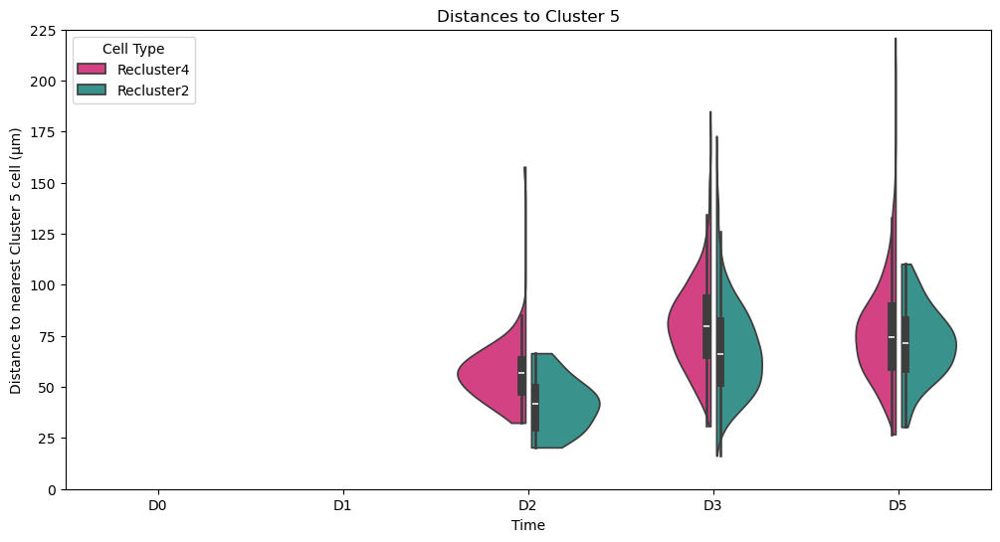

In [130]:
plt.figure(figsize=(12,6))
sns.violinplot(
    data=df_all,
    x="time", y="distance_to_cluster5", hue="cell_type",
    split=True, gap = 0.08, inner="box", cut=0, palette = palette,
    hue_order = ['Recluster4', 'Recluster2']
)
plt.ylabel("Distance to nearest Cluster 5 cell (µm)")
plt.xlabel("Time")
plt.title("Distances to Cluster 5")
plt.ylim(0,225)
plt.legend(title="Cell Type")
plt.show()


In [128]:
print(df_all['distance_to_cluster5'].min())

16.32864261067583


#### gene list scoring

In [37]:
regenlist = ["Spp1", 'Tacstd2', 'Anxa1', 'Anxa8', 'Msln', 'Clu', 'Ereg', 'Ly6d', 'Anxa10', 'Areg']
homeolist = ['Tert', 'Hmga2', 'Bmi1', 'Lgr5', 'Ascl2', 'Olfm4', 'Smoc2', 'Lrig1', 'Top2a', 'Hopx', 'Fgfbp1']

In [38]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]

In [55]:
sc.pp.normalize_per_cell(adata_Verzi, counts_per_cell_after=10**6)
sc.pp.log1p(adata_Verzi)

/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/scanpy/preprocessing/_simple.py:588: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


In [39]:
sc.tl.score_genes(adata_Verzi, regenlist, score_name = 'regenlist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [40]:
sc.tl.score_genes(adata_Verzi, homeolist, score_name = 'homeolist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

um_per_pixel = adata_Verzi.uns["scalefactors"]["microns_per_pixel"]

distances = np.full(adata_Verzi.n_obs, np.nan) 

coords = adata_Verzi.obsm["spatial"]
obs = adata_Verzi.obs

for t in obs["time"].unique():
    
    # cells at this time
    mask_time = (obs["time"] == t)

    # cluster 5 cells at this time
    mask_cluster5 = mask_time & (obs["GraphBased"] == "Cluster 5")
    cluster5_coords = coords[mask_cluster5]

    if cluster5_coords.shape[0] == 0:
        continue

    tree = cKDTree(cluster5_coords)

    # all cells at this time
    coords_subset = coords[mask_time]
    dists, _ = tree.query(coords_subset, k=1)
    dists_um = dists * um_per_pixel

    distances[mask_time] = dists_um

adata_Verzi.obs["DistToC5SameTime"] = distances

In [42]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression')
].copy()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
sns.violinplot(
    data=adata_Verzi.obs,
    x="time",
    y="DistToC5SameTime",
    cut=0
)
plt.title("Distance to Cluster 5 (same timepoint)")
plt.ylabel("Distance (µm)")
plt.show()


In [ ]:
adata_Verzi.obs

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = adata_Verzi.obs[['DistToC5SameTime', 'regenlist', 'time']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

#  mean score in each bin × time
summary = (
    df.groupby(['time', 'dist_bin'])['regenlist']
      .mean()
      .reset_index()
)

plt.figure(figsize=(8,6))
for t in summary['time'].unique():
    sub = summary[summary['time'] == t]
    plt.plot(sub['dist_bin'], sub['regenlist'], marker='o', label=f'Time {t}')

plt.xlabel('Distance to C5 (μm, binned)')
plt.ylabel('Mean regenlist score')
plt.title('Gene-list score vs distance for each timepoint')
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = filtered_adata.obs[['DistToC5SameTime', 'regenlist', 'time']].copy()

bin_width = 20
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

summary = (
    df.groupby(['time', 'dist_bin'])['regenlist']
      .agg(['mean', 'std', 'count'])
      .reset_index()
)

summary['sem'] = summary['std'] / np.sqrt(summary['count'])  # SEM
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


plt.figure(figsize=(9,7))

for t in summary['time'].unique():
    sub = summary[summary['time'] == t]

    plt.plot(sub['dist_bin'], sub['mean'], label=f"Time {t}")

    plt.fill_between(
        sub['dist_bin'],
        sub['mean'] - sub['sem'],
        sub['mean'] + sub['sem'],
        alpha=0.2
    )

plt.xlabel('Distance to C5 (μm, binned)')
plt.ylabel('Regenlist score')
plt.xlim(0,700)
plt.title('Mean ± SEM regenlist score vs distance')
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
sc.pl.violin(filtered_adata, keys = 'regenlist', groupby = 'time', size = 0.2)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = filtered_adata.obs[['DistToC5SameTime', 'homeolist', 'time']].copy()

bin_width = 20
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

summary = (
    df.groupby(['time', 'dist_bin'])['homeolist']
      .agg(['mean', 'std', 'count'])
      .reset_index()
)

summary['sem'] = summary['std'] / np.sqrt(summary['count'])  # SEM
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


plt.figure(figsize=(9,7))

for t in summary['time'].unique():
    sub = summary[summary['time'] == t]

    plt.plot(sub['dist_bin'], sub['mean'], label=f"Time {t}")

    plt.fill_between(
        sub['dist_bin'],
        sub['mean'] - sub['sem'],
        sub['mean'] + sub['sem'],
        alpha=0.2
    )

plt.xlabel('Distance to C5 (μm, binned)')
plt.ylabel('Homeolist score')
plt.xlim(0,300)
plt.title('Mean ± SEM homeolist score vs distance')
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
filtered_adata.obs

In [134]:
adata_Verzi.obs['n_counts_norm'] = adata_Verzi.X.sum(1).A1

In [48]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Mki67+'] == 'high_expression') &
    ((adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression'))
].copy()

In [ ]:
# counts by distance
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = filtered_adata.obs[['DistToC5SameTime', 'n_counts', 'time']].copy()

    "D0": "#ff7f0e",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    'D5': '#FF0000'}

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

summary = (
    df.groupby(['time', 'dist_bin'])['n_counts']
      .agg(['mean', 'std', 'count'])
      .reset_index()
)

summary['sem'] = summary['std'] / np.sqrt(summary['count'])  # SEM
summary = summary[summary['count'] >= 5] 


plt.figure(figsize=(9,7))

for t in summary['time'].unique():
    sub = summary[summary['time'] == t]

    plt.plot(sub['dist_bin'], sub['mean'], label=f"{t}")

    plt.fill_between(
        sub['dist_bin'],
        sub['mean'] - sub['sem'],
        sub['mean'] + sub['sem'],
        alpha=0.2
    )

plt.xlabel('Distance to C5 (μm, binned)')
plt.ylabel('n_counts')
plt.xlim(0,550)
plt.title('Mean ± SEM n_counts vs distance')
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = filtered_adata.obs[['DistToC5SameTime', 'n_counts_norm', 'time']].copy()

bin_width = 20
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

summary = (
    df.groupby(['time', 'dist_bin'])['n_counts_norm']
      .agg(['mean', 'std', 'count'])
      .reset_index()
)

summary['sem'] = summary['std'] / np.sqrt(summary['count'])  # SEM
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


plt.figure(figsize=(9,7))

for t in summary['time'].unique():
    sub = summary[summary['time'] == t]

    plt.plot(sub['dist_bin'], sub['mean'], label=f"{t}")

    plt.fill_between(
        sub['dist_bin'],
        sub['mean'] - sub['sem'],
        sub['mean'] + sub['sem'],
        alpha=0.2
    )

plt.xlabel('Distance to C5 (μm, binned)')
plt.ylabel('n_counts')
plt.xlim(0,550)
plt.title('Mean ± SEM n_counts_norm vs distance')
plt.legend()
plt.tight_layout()
plt.show()


KeyError: "['n_counts_norm'] not in index"

In [ ]:
import matplotlib as mpl

mpl.rcParams['axes.spines.left']   = True
mpl.rcParams['axes.spines.right']  = True
mpl.rcParams['axes.spines.top']    = True
mpl.rcParams['axes.spines.bottom'] = True

mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['patch.edgecolor'] = 'black'
mpl.rcParams['axes.edgecolor'] = 'black'


mpl.rcParams['xtick.bottom'] = True
mpl.rcParams['xtick.top']    = False
mpl.rcParams['ytick.left']   = True
mpl.rcParams['ytick.right']  = False


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = {
    'regenlist': 'tab:red',
    'homeolist': 'tab:blue'
}

df = filtered_adata.obs[['DistToC5SameTime', 'regenlist', 'homeolist', 'time']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=['regenlist', 'homeolist'],
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in ['regenlist', 'homeolist']:
        ss = sub[sub['score_type'] == score]

        # mean line
        plt.plot(ss['dist_bin'], ss['mean'], label=score, color = colors[score], linewidth = 3)

        # shaded SEM band
        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color = colors[score]
        )

    plt.title(f"Timepoint: {t}")
    #plt.xlabel("Distance to C5 (μm, binned)")
    plt.ylabel("Score")
    plt.ylim(-0.75,1.5)
    plt.xlim(0,300)
    plt.legend()

plt.tight_layout()
#plt.show()


#plt.savefig('/scratch/tht38/rep2segmentation/figs/hrscoredistance.png', dpi = 1500)


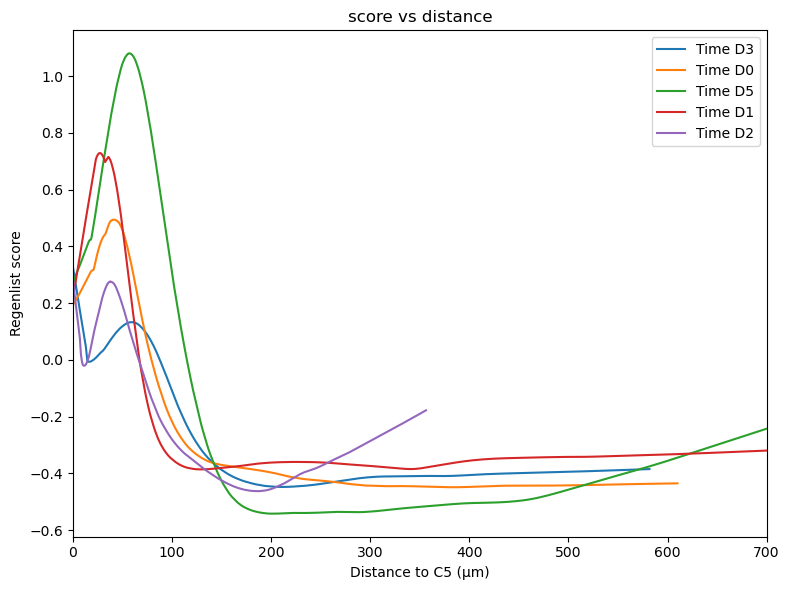

In [ ]:
from statsmodels.nonparametric.smoothers_lowess import lowess
import matplotlib.pyplot as plt

df = adata_Verzi.obs[['DistToC5SameTime', 'regenlist', 'time']].copy()

plt.figure(figsize=(8,6))

for t in df['time'].unique():
    sub = df[df['time'] == t]

    # LOESS smoothing
    smoothed = lowess(sub['regenlist'], sub['DistToC5SameTime'], frac=0.2)
    plt.plot(smoothed[:,0], smoothed[:,1], label=f'Time {t}')

#LOESS-smoothed score vs distance
plt.xlabel('Distance to C5 (μm)')
plt.ylabel('Regenlist score')
plt.title('score vs distance')
plt.xlim(0,700)
plt.legend()
plt.tight_layout()
plt.show()


In [28]:
adata_subset = adata_Verzi[adata_Verzi.obs['Recluster2.16'].isin(['Cluster 2', 'Cluster 4'])].copy()

In [ ]:
from statsmodels.nonparametric.smoothers_lowess import lowess
import matplotlib.pyplot as plt

df = adata_subset.obs[['DistToC5SameTime', 'regenlist', 'Recluster2.16']].copy()

plt.figure(figsize=(8,6))

for t in df['Recluster2.16'].unique():
    sub = df[df['Recluster2.16'] == t]

    # Perform LOESS smoothing
    smoothed = lowess(sub['regenlist'], sub['DistToC5SameTime'], frac=0.2)
    plt.plot(smoothed[:,0], smoothed[:,1], label=f'{t}')

#LOESS-smoothed score vs distance
plt.xlabel('Distance to C5 (μm)')
plt.ylabel('Regenlist score')
plt.title('score vs distance')
#plt.xlim(0,700)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = adata_subset.obs[['DistToC5SameTime', 'regenlist', 'Recluster2.16']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

summary = (
    df.groupby(['Recluster2.16', 'dist_bin'])['regenlist']
      .mean()
      .reset_index()
)

# Plot
plt.figure(figsize=(8,6))
for t in summary['Recluster2.16'].unique():
    sub = summary[summary['Recluster2.16'] == t]
    plt.plot(sub['dist_bin'], sub['regenlist'], marker='o', label=f'{t}')

plt.xlabel('Distance to C5 (μm, binned)')
plt.ylabel('Mean regenlist score')
plt.title('Regen-list score vs distance Recluster 2 and 4')
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = adata_subset.obs[['DistToC5SameTime', 'regenlist', 'Recluster2.16']].copy()

bin_width = 20
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

summary = (
    df.groupby(['Recluster2.16', 'dist_bin'])['regenlist']
      .agg(['mean', 'std', 'count'])
      .reset_index()
)

summary['sem'] = summary['std'] / np.sqrt(summary['count'])  # SEM
summary = summary[summary['count'] >= 5] # min cell threshold in bracket


plt.figure(figsize=(9,7))

for t in summary['Recluster2.16'].unique():
    sub = summary[summary['Recluster2.16'] == t]

    plt.plot(sub['dist_bin'], sub['mean'], label=f"{t}")

    plt.fill_between(
        sub['dist_bin'],
        sub['mean'] - sub['sem'],
        sub['mean'] + sub['sem'],
        alpha=0.2
    )

plt.xlabel('Distance to C5 (μm, binned)')
plt.ylabel('Regenlist score')
plt.title('Mean ± SEM regenlist score vs distance')
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = adata_subset.obs[['DistToC5SameTime', 'homeolist', 'Recluster2.16']].copy()

bin_width = 20
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

summary = (
    df.groupby(['Recluster2.16', 'dist_bin'])['homeolist']
      .agg(['mean', 'std', 'count'])
      .reset_index()
)

summary['sem'] = summary['std'] / np.sqrt(summary['count'])  # SEM
summary = summary[summary['count'] >= 5] # min cell threshold in bracket


plt.figure(figsize=(9,7))

for t in summary['Recluster2.16'].unique():
    sub = summary[summary['Recluster2.16'] == t]

    plt.plot(sub['dist_bin'], sub['mean'], label=f"{t}")

    plt.fill_between(
        sub['dist_bin'],
        sub['mean'] - sub['sem'],
        sub['mean'] + sub['sem'],
        alpha=0.2
    )

plt.xlabel('Distance to C5 (μm, binned)')
plt.ylabel('homeolist score')
plt.title('Mean ± SEM homeolist score vs distance')
plt.legend()
plt.tight_layout()
plt.show()


In [29]:
sc.set_figure_params(dpi=200, figsize=(3,3), fontsize=10, frameon = True)
palette = {
    'Cluster 2': '#2AA198',
    'Cluster 4': '#EB2A80'
}

In [ ]:
import matplotlib.pyplot as plt

sc.pl.violin(
    adata_subset,
    keys='regenlist',
    groupby='Recluster2.16',
    rotation=90,
    stripplot=True,
    jitter=0.1,
    palette=palette,
    order = ['Cluster 4', 'Cluster 2'],
    show=False
)

plt.grid(False)     
plt.show()


In [ ]:
sc.pl.violin(
    adata_subset,
    keys='homeolist',        
    groupby='Recluster2.16',  
    rotation=90,               
    stripplot=True,          
    jitter=0.1,                 
    palette = palette,
    order = ['Cluster 4', 'Cluster 2'],
    show=False
)

plt.grid(False) 
plt.show()

In [ ]:
import pandas as pd
import joypy
import matplotlib.pyplot as plt

df = pd.DataFrame({
    'value': adata_subset.obs['homeolist'].astype(float),
    'group': adata_subset.obs['Recluster2.16']
})

plt.figure(figsize=(8,6))
joypy.joyplot(
    df,
    by="group",
    column="value",
    linewidth=0.5,
    fade=True
)

plt.title("Ridgeline plot of homeolist values")
plt.show()


#### accounting for peyer's patch

In [ ]:
from scipy.spatial import cKDTree

um_per_pixel = adata_Verzi.uns["scalefactors"]["microns_per_pixel"]

distances = np.full(adata_Verzi.n_obs, np.nan) 

coords = adata_Verzi.obsm["spatial"]
obs = adata_Verzi.obs

for t in obs["time"].unique():
    
    mask_time = (obs["time"] == t)

    mask_cluster5 = mask_time & (obs["GraphBased"] == "Cluster 5")
    cluster5_coords = coords[mask_cluster5]

    if cluster5_coords.shape[0] == 0:
        continue

    tree = cKDTree(cluster5_coords)

    coords_subset = coords[mask_time]
    dists, _ = tree.query(coords_subset, k=1)
    dists_um = dists * um_per_pixel

    distances[mask_time] = dists_um

adata_Verzi.obs["DistToC5SameTime"] = distances


In [ ]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression')
].copy()

In [ ]:
filtered_adata
filtered_adata = filtered_adata[filtered_adata.obs["Peyerpatchandabove"] != "PeyerPatchandabove"]

In [ ]:
filtered_adata.obs['Peyerpatchandabove'].value_counts(dropna=False)

In [ ]:
# without cells including and above peyer's patch

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = {
    'Zone 1': 'tab:blue',
    'Zone 2': '#FFED29',
    'Zone 3': 'tab:green',
    'Zone 4': 'tab:orange',
    'Zone 5': 'tab:pink',
}

df = filtered_adata.obs[['DistToC5SameTime', 'Zone 1', 'Zone 2', 'Zone 3', 'Zone 4', 'Zone 5', 'time']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=['Zone 1', 'Zone 2', 'Zone 3', 'Zone 4', 'Zone 5'],
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in ['Zone 1', 'Zone 2', 'Zone 3', 'Zone 4', 'Zone 5']:
        ss = sub[sub['score_type'] == score]

        # mean line
        plt.plot(ss['dist_bin'], ss['mean'], label=score, color = colors[score], linewidth = 3)

        # shaded SEM 
        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color = colors[score]
        )

    plt.title(f"Timepoint: {t}")
    #plt.xlabel("Distance to C5 (μm, binned)")
    plt.ylabel("Score")
#    plt.ylim(-0.75,1.5)
    plt.xlim(0,500)
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# nearest muscle or peyer's patch cell

import numpy as np
from scipy.spatial import cKDTree

um_per_pixel = adata_Verzi.uns["scalefactors"]["microns_per_pixel"]

distances = np.full(adata_Verzi.n_obs, np.nan)

coords = adata_Verzi.obsm["spatial"]
obs = adata_Verzi.obs

for t in obs["time"].unique():

    mask_time = (obs["time"] == t)

    # target cells:
    # Cluster 5 OR C15Peyer
    mask_targets = (
        mask_time &
        (
            (obs["GraphBased"] == "Cluster 5") |
            (obs["C15Peyer"] == "C15Peyer")
        )
    )

    target_coords = coords[mask_targets]

    if target_coords.shape[0] == 0:
        continue

    tree = cKDTree(target_coords)

    coords_subset = coords[mask_time]
    dists, _ = tree.query(coords_subset, k=1)

    distances[mask_time] = dists * um_per_pixel

adata_Verzi.obs["DistToC5SameTime"] = distances

In [ ]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression') 
].copy()

In [ ]:
# without cells including and above peyer's patch

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = {
    'Zone 1': 'tab:blue',
    'Zone 2': '#FFED29',
    'Zone 3': 'tab:green',
    'Zone 4': 'tab:orange',
    'Zone 5': 'tab:pink',
}

df = filtered_adata.obs[['DistToC5SameTime', 'Zone 1', 'Zone 2', 'Zone 3', 'Zone 4', 'Zone 5', 'time']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=['Zone 1', 'Zone 2', 'Zone 3', 'Zone 4', 'Zone 5'],
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in ['Zone 1', 'Zone 2', 'Zone 3', 'Zone 4', 'Zone 5']:
        ss = sub[sub['score_type'] == score]

        # mean line
        plt.plot(ss['dist_bin'], ss['mean'], label=score, color = colors[score], linewidth = 3)

        # shaded SEM band
        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color = colors[score]
        )

    plt.title(f"Timepoint: {t}")
    #plt.xlabel("Distance to C5 (μm, binned)")
    plt.ylabel("Score")
#    plt.ylim(-0.75,1.5)
    plt.xlim(0,500)
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
regenlist = ["Spp1", 'Tacstd2', 'Anxa1', 'Anxa8', 'Msln', 'Clu', 'Ereg', 'Ly6d', 'Anxa10', 'Areg']
homeolist = ['Tert', 'Hmga2', 'Bmi1', 'Lgr5', 'Ascl2', 'Olfm4', 'Smoc2', 'Lrig1', 'Top2a', 'Hopx', 'Fgfbp1']

In [ ]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]

In [ ]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression')
].copy()

In [ ]:
plt.rcParams['figure.dpi'] = 600 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = {
    'regenlist': 'tab:red',
    'homeolist': 'tab:blue'
}

df = filtered_adata.obs[['DistToC5SameTime', 'regenlist', 'homeolist', 'time']].copy()

# Create distance bins
bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

# Compute mean + SEM per (time, distance, score-type)
df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=['regenlist', 'homeolist'],
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


# Plot a panel per timepoint
timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in ['regenlist', 'homeolist']:
        ss = sub[sub['score_type'] == score]

        # mean line
        plt.plot(ss['dist_bin'], ss['mean'], label=score, color = colors[score], linewidth = 3)

        # shaded SEM band
        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color = colors[score]
        )

    plt.title(f"Timepoint: {t}")
    #plt.xlabel("Distance to C5 (μm, binned)")
    plt.ylabel("Score")
    plt.ylim(-0.75,1.5)
    plt.xlim(0,300)
    plt.legend()

plt.tight_layout()
#plt.show()


#plt.savefig('/scratch/tht38/rep2segmentation/figs/hrscoredistance.png', dpi = 1500)


#### other gene list scoring

In [147]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]

/tmp/ipykernel_98581/852323114.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]


In [211]:
sc.pp.normalize_per_cell(adata_Verzi, counts_per_cell_after=10**6)
sc.pp.log1p(adata_Verzi)

/home/tht38/anaconda3/envs/newenv/lib/python3.13/site-packages/scanpy/preprocessing/_simple.py:588: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell


In [212]:
tgfb = 'Tgfb1'

In [213]:
sc.tl.score_genes(adata_Verzi, tgfb, score_name = 'tgfbscore', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [26]:
panethlist = ['Lyz1', 'Mmp7', 'Cd24a']

In [27]:
sc.tl.score_genes(adata_Verzi, panethlist, score_name = 'panethlist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [27]:
tuftlist = ['Avil', 'Dclk1', 'Pou2f3', 'Trpm5']

In [28]:
sc.tl.score_genes(adata_Verzi, tuftlist, score_name = 'tuftlist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [29]:
eeclist = ['Neurog3', 'Neurod1', 'Pax4', 'Chga']

In [30]:
sc.tl.score_genes(adata_Verzi, eeclist, score_name = 'eeclist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [31]:
proliflist = ['Mki67', 'Pcna']

In [32]:
sc.tl.score_genes(adata_Verzi, proliflist, score_name = 'proliflist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [33]:
gobletlist = ['Muc2', 'Tff3']

In [34]:
sc.tl.score_genes(adata_Verzi, gobletlist, score_name = 'gobletlist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [35]:
enterocytelist = ['Alpi', 'Krt20', 'Slc10a2']

In [36]:
sc.tl.score_genes(adata_Verzi, enterocytelist, score_name = 'enterocytelist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [37]:
tcelllist = ['Cd3e', 'Cd3d', 'Cd4', 'Cd8a']
sc.tl.score_genes(adata_Verzi, tcelllist, score_name = 'tcelllist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [38]:
bcelllist = ['Jchain', 'Cd19', 'Ms4a1']
sc.tl.score_genes(adata_Verzi, bcelllist, score_name = 'bcelllist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [39]:
stemlist = ['Olfm4', 'Lgr5']
sc.tl.score_genes(adata_Verzi, stemlist, score_name = 'stemlist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [40]:
fibroblast = ['Pdgfra', 'Col1a1']
sc.tl.score_genes(adata_Verzi, fibroblast, score_name = 'fibroblast', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [41]:
gdtcelllist = ['Tcrg-C1','Tcrg-C2','Tcrg-C4','Tcrg-V1','Tcrg-V4','Tcrg-V5', 'Tcrg-V6','Tcrg-V7','Cd27']
sc.tl.score_genes(adata_Verzi, gdtcelllist, score_name = 'gdtcelllist', ctrl_size = 150, n_bins = 1000, random_state = 1234)

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

um_per_pixel = adata_Verzi.uns["scalefactors"]["microns_per_pixel"]

distances = np.full(adata_Verzi.n_obs, np.nan)    # default NaN

coords = adata_Verzi.obsm["spatial"]
obs = adata_Verzi.obs

for t in obs["time"].unique():
    
    mask_time = (obs["time"] == t)

    mask_cluster5 = mask_time & (obs["GraphBased"] == "Cluster 5")
    cluster5_coords = coords[mask_cluster5]

    if cluster5_coords.shape[0] == 0:
        continue

    tree = cKDTree(cluster5_coords)

    coords_subset = coords[mask_time]
    dists, _ = tree.query(coords_subset, k=1)
    dists_um = dists * um_per_pixel

    distances[mask_time] = dists_um

adata_Verzi.obs["DistToC5SameTime"] = distances

In [62]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression')
].copy()

In [215]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['CC.CellType'] == 'Crypt epithelium') | (adata_Verzi.obs['CC.CellType'] == 'Villus epithelium') | (adata_Verzi.obs['CC.CellType'] == 'Junction')
    | (adata_Verzi.obs['CC.CellType'] == 'Crypt stroma') | (adata_Verzi.obs['CC.CellType'] == 'Villus stroma')
].copy()

In [216]:
adata_Verzi = filtered_adata

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = {
    'tgfbscore': 'tab:red',
    'eeclist': 'tab:blue'
}

df = adata_Verzi.obs[['DistToC5SameTime', 'tgfbscore', 'time']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

# Compute mean + SEM per (time, distance, score-type)
df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=['tgfbscore'],
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in ['tgfbscore']:
        ss = sub[sub['score_type'] == score]

        # mean line
        plt.plot(ss['dist_bin'], ss['mean'], label=score, color = colors[score], linewidth = 3)

        # shaded SEM band
        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color = colors[score]
        )

    #plt.title(f"{t}")
    #plt.xlabel("Distance to C5 (μm, binned)")
#    plt.ylabel("Score")
    plt.ylim(-1,1)
    plt.xlim(0,300)
#    plt.legend()
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1, alpha=0.3)

#plt.ylabel('Tgfb1 expression score')
plt.xlabel('Distance to muscle (µm)')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = {
    'proliflist': 'tab:red',
    'eeclist': 'tab:blue'
}

df = filtered_adata.obs[['DistToC5SameTime', 'proliflist', 'eeclist', 'time']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=['proliflist', 'eeclist'],
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in ['proliflist', 'eeclist']:
        ss = sub[sub['score_type'] == score]

        # mean line
        plt.plot(ss['dist_bin'], ss['mean'], label=score, color = colors[score], linewidth = 3)

        # shaded SEM 
        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color = colors[score]
        )

    plt.title(f"Timepoint: {t}")
    #plt.xlabel("Distance to C5 (μm, binned)")
    plt.ylabel("Score")
#    plt.ylim(-0.75,1.5)
    plt.xlim(0,500)
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = {
    'panethlist': 'tab:red',
    'tuftlist': 'tab:blue'
}

df = filtered_adata.obs[['DistToC5SameTime', 'panethlist', 'tuftlist', 'time']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=['panethlist', 'tuftlist'],
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5] 


timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in ['panethlist', 'tuftlist']:
        ss = sub[sub['score_type'] == score]

        plt.plot(ss['dist_bin'], ss['mean'], label=score, color = colors[score], linewidth = 3)

        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color = colors[score]
        )

    plt.title(f"Timepoint: {t}")
    #plt.xlabel("Distance to C5 (μm, binned)")
    plt.ylabel("Score")
#    plt.ylim(-0.75,1.5)
    plt.xlim(0,500)
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = {
    'gobletlist': 'tab:red',
    'enterocytelist': 'tab:blue'
}

df = filtered_adata.obs[['DistToC5SameTime', 'gobletlist', 'enterocytelist', 'time']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=['gobletlist', 'enterocytelist'],
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in ['gobletlist', 'enterocytelist']:
        ss = sub[sub['score_type'] == score]

        plt.plot(ss['dist_bin'], ss['mean'], label=score, color = colors[score], linewidth = 3)

        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color = colors[score]
        )

    plt.title(f"Timepoint: {t}")
    #plt.xlabel("Distance to C5 (μm, binned)")
    plt.ylabel("Score")
#    plt.ylim(-0.75,1.5)
    plt.xlim(0,500)
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

colors = {
    'stemlist': 'tab:red',
    'fibroblast': 'tab:blue'
}

df = filtered_adata.obs[['DistToC5SameTime', 'stemlist', 'fibroblast', 'time']].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=['stemlist', 'fibroblast'],
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5] #remove brackets with less than 5 cells


timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in ['stemlist', 'fibroblast']:
        ss = sub[sub['score_type'] == score]

        plt.plot(ss['dist_bin'], ss['mean'], label=score, color = colors[score], linewidth = 3)

        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color = colors[score]
        )

    plt.title(f"Timepoint: {t}")
    #plt.xlabel("Distance to C5 (μm, binned)")
    plt.ylabel("Score")
#    plt.ylim(-0.75,1.5)
    plt.xlim(0,500)
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
score_cols = ['panethlist', 'stemlist', 'proliflist', 'bcelllist', 'enterocytelist']

default_colors = plt.cm.tab10.colors
colors = {col: default_colors[i % 10] for i, col in enumerate(score_cols)}

df = filtered_adata.obs[['DistToC5SameTime', 'time'] + score_cols].copy()

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = (
    df.melt(
        id_vars=['time', 'dist_bin'],
        value_vars=score_cols,
        var_name='score_type',
        value_name='score'
    )
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5]

timepoints = sorted(summary['time'].unique())
plots = {}   

for t in timepoints:
    sub = summary[summary['time'] == t]

    fig, ax = plt.subplots(figsize=(7, 5), dpi = 1200)

    for score in score_cols:
        ss = sub[sub['score_type'] == score]
        if ss.empty:
            continue

        # Mean line
        ax.plot(ss['dist_bin'], ss['mean'],
                label=score, color=colors[score], linewidth=2.5)

        # SEM fill
        ax.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2,
            color=colors[score]
        )

    ax.set_title(f"Timepoint: {t}")
    ax.set_xlabel("Distance to C5 (µm)")
    ax.set_ylabel("Score")
    ax.set_xlim(0, 500)
    ax.legend()

    plots[t] = fig 

plt.show()


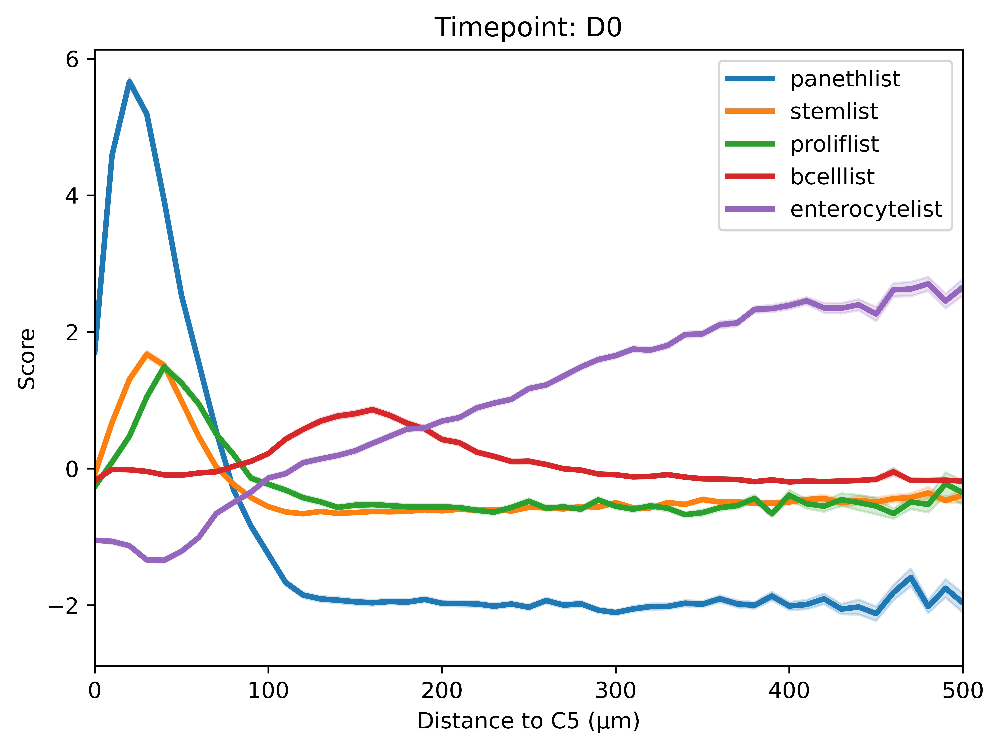

In [ ]:
plots['D0']

In [63]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression')
].copy()

In [ ]:
genes = ["Ascl2", "Lgr5", "Olfm4", "Smoc2", "Hmga2", "Top2a", "Msln", 
         "Lrig1", "Tert", "Hopx", "Bmi1", "Ly6d", "Tacstd2", "Anxa1", 
         "Anxa8", "Anxa10", "Spp1", "Clu", "Areg", "Ereg", "Fgfbp1"]

for g in genes:
    sc.tl.score_genes(
        filtered_adata,
        gene_list=[g],      
        score_name=g,   
        ctrl_size=150,
        n_bins=1000,
        random_state=1234
    )


In [65]:
filtered_adata.obs

,cell_numeric_id,time,GraphBased,Recluster2.16,n_counts,Epcam+,Vil1+,Mki67+,DistToC5SameTime,Ascl2,Lgr5,Olfm4,Smoc2,Hmga2,Top2a,Msln,Lrig1,Tert,Hopx,Bmi1,Ly6d,Tacstd2,Anxa1,Anxa8,Anxa10,Spp1,Clu,Areg,Ereg,Fgfbp1
cellid_000290169-1,290169,D0,Cluster 1,NaN,1775.0,high_expression,high_expression,low_expression,237.410599,0.000000,0.000000,-0.703970,0.000000,0.0,-0.351985,0.0,-1.446399,0.000000,-1.055955,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,-0.703970,-1.446399,0.000000,-0.351985
cellid_000290174-1,290174,D3,Cluster 5,NaN,837.0,high_expression,low_expression,low_expression,0.000000,0.000000,-0.393696,0.000000,0.000000,0.0,-0.432181,0.0,0.000000,0.000000,-0.825876,-0.787391,0.000000,0.0,0.000000,-0.393696,-0.393696,0.0,-0.393696,-1.181087,0.000000,0.000000
cellid_000290175-1,290175,D3,Cluster 2,Cluster 13,1197.0,high_expression,high_expression,high_expression,70.218193,-0.373841,0.000000,-0.373841,0.000000,0.0,5.569136,0.0,-0.373841,0.000000,-2.754825,-0.747681,0.000000,0.0,-0.373841,0.000000,-0.373841,0.0,-0.747681,-1.121522,-0.747681,-0.373841
cellid_000290179-1,290179,D0,Cluster 1,NaN,1214.0,high_expression,high_expression,low_expression,210.172384,0.000000,0.000000,-0.373058,0.000000,0.0,-0.373058,0.0,0.000000,0.000000,5.222815,-0.373058,0.000000,0.0,0.000000,0.000000,0.000000,0.0,-0.746116,6.341990,0.000000,0.000000
cellid_000290180-1,290180,D3,Cluster 6,NaN,1379.0,low_expression,high_expression,low_expression,73.355076,0.000000,-0.365987,-0.365987,-1.097962,0.0,5.855800,0.0,-0.731975,0.000000,-0.365987,0.000000,6.221787,0.0,0.000000,-0.365987,-0.731975,0.0,6.587775,-1.463950,-0.365987,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cellid_000557536-1,557536,D1,Cluster 10,NaN,85.0,high_expression,low_expression,low_expression,97.664075,0.000000,0.000000,0.000000,-0.520719,0.0,0.000000,0.0,-0.520719,-0.520719,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
cellid_000557542-1,557542,D1,Cluster 1,NaN,1637.0,high_expression,high_expression,low_expression,348.214103,0.000000,0.000000,-0.356474,0.000000,0.0,-0.356474,0.0,-0.712947,0.000000,-1.107884,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,-1.820831,0.000000,0.000000
cellid_000557546-1,557546,D1,Cluster 17,NaN,1015.0,high_expression,low_expression,low_expression,418.813516,0.000000,0.000000,0.000000,0.000000,0.0,-0.382993,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
cellid_000557549-1,557549,D1,Cluster 7,NaN,2375.0,high_expression,high_expression,low_expression,248.835794,0.000000,0.000000,-0.671681,-0.335841,0.0,-0.671681,0.0,-0.671681,0.000000,-1.679203,0.000000,0.000000,0.0,-0.335841,0.000000,0.000000,0.0,0.000000,-2.015043,0.000000,-0.335841


In [ ]:
regenlist = ["Spp1", 'Tacstd2', 'Anxa1', 'Anxa8', 'Msln', 'Clu', 'Ereg', 'Ly6d', 'Anxa10', 'Areg']
homeolist = ['Tert', 'Hmga2', 'Bmi1', 'Lgr5', 'Ascl2', 'Olfm4', 'Smoc2', 'Lrig1', 'Top2a', 'Hopx', 'Fgfbp1']

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


score_cols = ["Spp1", 'Tacstd2', 'Anxa1', 'Anxa8', 'Msln', 'Clu', 'Ereg', 'Ly6d', 'Anxa10', 'Areg']

df = filtered_adata.obs[['DistToC5SameTime', 'time'] + score_cols].copy()

import matplotlib.cm as cm
cmap = cm.get_cmap('tab10', len(score_cols))
colors = {score: cmap(i) for i, score in enumerate(score_cols)}

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width


df_long = df.melt(
    id_vars=['time', 'dist_bin'],
    value_vars=score_cols,
    var_name='score_type',
    value_name='score'
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5]  

timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in score_cols:
        ss = sub[sub['score_type'] == score]

        plt.plot(
            ss['dist_bin'], ss['mean'],
            label=score, color=colors[score], linewidth=3
        )

        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2, color=colors[score]
        )

    plt.title(f"Timepoint: {t}")
    plt.ylabel("Score")
    plt.xlim(0, 350)
    plt.ylim(-1.2, 2.6)
    plt.legend(loc = 'right')

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


score_cols = ['Tert', 'Hmga2', 'Bmi1', 'Lgr5', 'Ascl2', 'Olfm4', 'Smoc2', 'Lrig1', 'Top2a', 'Hopx', 'Fgfbp1']

df = filtered_adata.obs[['DistToC5SameTime', 'time'] + score_cols].copy()

import matplotlib.cm as cm
cmap = plt.get_cmap('tab20', len(score_cols))
colors = {score: cmap(i) for i, score in enumerate(score_cols)}


bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = df.melt(
    id_vars=['time', 'dist_bin'],
    value_vars=score_cols,
    var_name='score_type',
    value_name='score'
)

summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5]  

timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 3.5 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in score_cols:
        ss = sub[sub['score_type'] == score]

        plt.plot(
            ss['dist_bin'], ss['mean'],
            label=score, color=colors[score], linewidth=3
        )

        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2, color=colors[score]
        )

    plt.title(f"Timepoint: {t}")
    plt.ylabel("Score")
    plt.xlim(0, 350)
    plt.ylim(-1.2, 7.2)
    plt.legend(loc = 'right')

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


score_cols = ['Tert', 'Hmga2', 'Bmi1', 'Lgr5', 'Ascl2', 'Olfm4', 'Smoc2', 'Lrig1', 'Top2a', 'Hopx', 'Fgfbp1', "Spp1", 'Tacstd2', 'Anxa1', 'Anxa8', 'Msln', 'Clu', 'Ereg', 'Ly6d', 'Anxa10', 'Areg']

df = filtered_adata.obs[['DistToC5SameTime', 'time'] + score_cols].copy()

import matplotlib.cm as cm
cmap = plt.get_cmap('tab20', len(score_cols))
colors = {score: cmap(i) for i, score in enumerate(score_cols)}

bin_width = 10
df['dist_bin'] = (df['DistToC5SameTime'] // bin_width) * bin_width

df_long = df.melt(
    id_vars=['time', 'dist_bin'],
    value_vars=score_cols,
    var_name='score_type',
    value_name='score'
)


summary = (
    df_long.groupby(['time', 'dist_bin', 'score_type'])['score']
    .agg(['mean', 'std', 'count'])
    .reset_index()
)
summary['sem'] = summary['std'] / np.sqrt(summary['count'])
summary = summary[summary['count'] >= 5]  

timepoints = sorted(summary['time'].unique())
n = len(timepoints)

plt.figure(figsize=(10, 9 * n))

for i, t in enumerate(timepoints, start=1):
    sub = summary[summary['time'] == t]
    plt.subplot(n, 1, i)

    for score in score_cols:
        ss = sub[sub['score_type'] == score]

        plt.plot(
            ss['dist_bin'], ss['mean'],
            label=score, color=colors[score], linewidth=3
        )

        plt.fill_between(
            ss['dist_bin'],
            ss['mean'] - ss['sem'],
            ss['mean'] + ss['sem'],
            alpha=0.2, color=colors[score]
        )

    plt.title(f"Timepoint: {t}")
    plt.ylabel("Score")
    plt.xlim(0, 350)
    plt.legend(loc = 'right')

plt.tight_layout()
plt.show()


### old co-occurrence

In [ ]:
sq.pl.co_occurrence(
    adata_d1,
    cluster_key="STHD_pred_ct",
    clusters="p_ct_Villi tip",
    figsize=(12, 12),
)

In [ ]:
sq.pl.co_occurrence(
    adata_d1,
    cluster_key="STHD_pred_ct",
    clusters = 'p_ct_EC 29',
    figsize=(12, 12),
)

### other reviewer

In [35]:
sc.set_figure_params(dpi=450, figsize=(4,4), fontsize=8)

In [15]:
adata_Verzi.obs

,cell_numeric_id,time,GraphBased,Recluster2.16,CC.CellType,n_counts
cellid_000290166-1,290166,D3,Cluster 5,NaN,NaN,1319.0
cellid_000290167-1,290167,D3,Cluster 5,NaN,NaN,691.0
cellid_000290169-1,290169,D0,Cluster 1,NaN,Villus epithelium,1775.0
cellid_000290170-1,290170,D0,Cluster 5,NaN,NaN,1277.0
cellid_000290172-1,290172,D0,Cluster 11,NaN,Crypt stroma,675.0
...,...,...,...,...,...,...
cellid_000557536-1,557536,D1,Cluster 10,NaN,Crypt stroma,85.0
cellid_000557542-1,557542,D1,Cluster 1,NaN,Villus epithelium,1637.0
cellid_000557546-1,557546,D1,Cluster 17,NaN,Villus stroma,1015.0
cellid_000557549-1,557549,D1,Cluster 7,NaN,Villus epithelium,2375.0


In [17]:
adata = adata_Verzi

In [ ]:
import pandas as pd
import numpy as np

gene = "Tgfb1"
groupby = "time"

gene_idx = adata.var_names.get_loc(gene)
expr = adata.X[:, gene_idx]

if not isinstance(expr, np.ndarray):
    expr = expr.toarray().flatten()
else:
    expr = expr.flatten()

df = pd.DataFrame({
    "expression": expr,
    "condition": adata.obs[groupby].values
})

percent_expressing = (
    df.groupby("condition")["expression"]
    .apply(lambda x: (x > 0).mean() * 100)
)

print(percent_expressing)

condition
D0     3.411113
D1     3.382616
D2     6.758509
D3    10.690547
D5     7.451897
Name: expression, dtype: float64


/tmp/ipykernel_31661/3866897787.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby("condition")["expression"]


In [24]:
filtered_adata = adata_Verzi[adata_Verzi.obs['time'] == 'D3'].copy()

In [25]:
filtered_adata.obs

,cell_numeric_id,time,GraphBased,Recluster2.16,CC.CellType,n_counts
cellid_000290166-1,290166,D3,Cluster 5,NaN,NaN,1319.0
cellid_000290167-1,290167,D3,Cluster 5,NaN,NaN,691.0
cellid_000290174-1,290174,D3,Cluster 5,NaN,NaN,837.0
cellid_000290175-1,290175,D3,Cluster 2,Cluster 13,Crypt epithelium,1197.0
cellid_000290178-1,290178,D3,Cluster 5,NaN,NaN,1236.0
...,...,...,...,...,...,...
cellid_000521315-1,521315,D3,Cluster 5,NaN,NaN,459.0
cellid_000521354-1,521354,D3,Cluster 16,Cluster 1,Crypt epithelium,1940.0
cellid_000521410-1,521410,D3,Cluster 5,NaN,NaN,1480.0
cellid_000521440-1,521440,D3,Cluster 2,Cluster 2,Crypt epithelium,1685.0


In [45]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]

/tmp/ipykernel_98581/852323114.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]


In [46]:

filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Mki67+'] == 'high_expression') &
    ((adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression'))
].copy()

In [47]:
sc.pp.normalize_per_cell(filtered_adata, counts_per_cell_after=10**6)
sc.pp.log1p(filtered_adata)
#sc.pp.scale(adata_subset)

In [ ]:
sc.pl.dotplot(filtered_adata, ['Ppat', 'Prps1', 'Prps2', 'Impdh1', 'Impdh2', 'Cad', 'Dhodh', 'Rrm1', 'Rrm2'], groupby = 'time', standard_scale = 'var')

In [ ]:
import numpy as np
import pandas as pd

geneA = "Rrm2"
geneB = "Prps1"

exprA = filtered_adata[:, geneA].X
exprB = filtered_adata[:, geneB].X

if not isinstance(exprA, np.ndarray):
    exprA = exprA.toarray().flatten()
    exprB = exprB.toarray().flatten()

ratio = np.where(exprB > 0, exprA / exprB, np.nan)

filtered_adata.obs["GeneA_GeneB_ratio"] = ratio

avg_ratio = (
    filtered_adata.obs
    .groupby("time")["GeneA_GeneB_ratio"]
    .mean()
)

print(avg_ratio)

time
D0    0.706461
D1    0.353484
D2    0.623991
D3    0.953486
D5    0.716762
Name: GeneA_GeneB_ratio, dtype: float32


/tmp/ipykernel_31661/3483836471.py:16: RuntimeWarning: divide by zero encountered in divide
  ratio = np.where(exprB > 0, exprA / exprB, np.nan)
/tmp/ipykernel_31661/3483836471.py:16: RuntimeWarning: invalid value encountered in divide
  ratio = np.where(exprB > 0, exprA / exprB, np.nan)
/tmp/ipykernel_31661/3483836471.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("time")["GeneA_GeneB_ratio"]


In [65]:
mean_expr = (
    sc.get.obs_df(filtered_adata, keys=[geneA, geneB, "time"])
      .groupby("time")
      .mean()
)

mean_expr["ratio"] = mean_expr[geneA] / (mean_expr[geneB] + 1e-9)

print(mean_expr)

          Rrm2     Prps1      ratio
time                               
D0    2.805655  0.236078  11.884425
D1    1.921526  0.150451  12.771734
D2    2.728645  0.305829   8.922113
D3    3.937528  0.444366   8.861011
D5    3.045775  0.303351  10.040418


/tmp/ipykernel_31661/1155197491.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("time")


In [ ]:

gene = "Rrm1"

gene_idx = filtered_adata.var_names.get_loc(gene)
gene_expr = filtered_adata.X[:, gene_idx]

if not isinstance(gene_expr, np.ndarray):
    gene_expr = gene_expr.toarray().flatten()
else:
    gene_expr = gene_expr.flatten()

ratios = gene_expr / filtered_adata.obs["n_counts"].values

filtered_adata.obs["gene_ratio"] = ratios

avg_ratio_per_sample = (
    adata.obs
    .groupby("sample")["gene_ratio"]
    .mean()
)


In [72]:
gene = "Rrm2"

gene_expr = filtered_adata[:, gene].X.toarray().flatten()
filtered_adata.obs["gene_ratio"] = gene_expr / filtered_adata.obs["n_counts"].values

avg_ratio = filtered_adata.obs.groupby("time")["gene_ratio"].mean()

print(avg_ratio)

time
D0    0.001375
D1    0.000980
D2    0.001002
D3    0.001039
D5    0.000801
Name: gene_ratio, dtype: float32


/tmp/ipykernel_31661/834498506.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_ratio = filtered_adata.obs.groupby("time")["gene_ratio"].mean()


In [73]:
df = filtered_adata.obs.copy()
df["gene_expr"] = gene_expr

ratio_of_sums = (
    df.groupby("time")[["gene_expr", "n_counts"]]
      .sum()
      .eval("gene_expr / n_counts")
)

print(ratio_of_sums)

time
D0    0.001127
D1    0.000748
D2    0.000795
D3    0.000847
D5    0.000629
dtype: float32


/tmp/ipykernel_31661/426142604.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby("time")[["gene_expr", "n_counts"]]


In [63]:
sc.tl.rank_genes_groups(filtered_adata, groupby = 'time', reference = 'D0')

In [64]:
test_rank = sc.get.rank_genes_groups_df(filtered_adata, None)
test_rank

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,D1,Dmbt1,27.466246,4.092218,7.397328e-153,1.566507e-149
1,D1,Car4,24.318939,3.975898,7.042235e-120,1.220163e-116
2,D1,Gvin1,23.255121,3.431840,1.698289e-112,2.311977e-109
3,D1,H2afv,20.627638,2.728512,5.188115e-90,4.299143e-87
4,D1,Pigr,20.498102,2.254511,1.612135e-88,1.280236e-85
...,...,...,...,...,...,...
76231,D5,Defa21,-27.485373,-4.000999,2.585193e-147,5.598999e-145
76232,D5,Ptp4a3,-28.720247,-3.650517,1.119046e-157,3.439984e-155
76233,D5,Ang4,-30.251507,-4.223024,2.345955e-173,9.935902e-171
76234,D5,AY761184,-36.340191,-5.273750,2.272666e-234,2.165737e-231


In [65]:
test_rank.loc[test_rank['names'] == 'Rrm1']

,group,names,scores,logfoldchanges,pvals,pvals_adj
17835,D1,Rrm1,-3.572285,-0.539034,3.578621e-04,3.083406e-03
35413,D2,Rrm1,-1.111071,-0.307563,2.671127e-01,5.346980e-01
38479,D3,Rrm1,17.740547,2.196058,5.673139e-68,2.946168e-66
62403,D5,Rrm1,8.216746,0.941664,3.024611e-16,1.083369e-15


In [ ]:
sc.get.rank_genes_groups_df(filtered_adata, group = 'time')

In [53]:
results['Mki67']

KeyError: 'Mki67'

In [24]:
adata = adata_Verzi

In [26]:
adata_Verzi.obs["GB"] = adata_Verzi.obs["GraphBased"].str.replace("Cluster ", "", regex=False)

/tmp/ipykernel_44027/3254627971.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Verzi.obs["GB"] = adata_Verzi.obs["GraphBased"].str.replace("Cluster ", "", regex=False)


In [ ]:
adata_Verzi.obs['GB'] = adata_Verzi.obs['GB'].astype(str)
gb_to_celltype = {
    '1': "Upper villus epithelium",
    '2': "Crypt epithelium",
    '3': "NA",
    '4': "Villus stroma",
    '5': "Muscle",
    '6': "Crypt stroma",
    '7': "Lower villus epithelium",
    '8': "D3 villus epithelium",
    '9': "Junction",
    '10': "Crypt stroma",
    '11': "Crypt stroma",
    '12': "Junction",
    '13': "Tip epithelium",
    '14': "Tip epithelium",
    '15': "Peyer's patch",
    '16': "Paneth cells",
    '17': "Villus stroma",
    '18': "Junction",
    '19': "Neuroendocrine",
    '20': "Neuroendocrine",
    '21': "Adipose"
}

adata_Verzi.obs['mapping'] = adata_Verzi.obs['GB'].map(gb_to_celltype)

In [28]:
adata_Verzi.obs['mapping'].value_counts()

mapping
Upper villus epithelium    25885
Crypt stroma               24333
Crypt epithelium           22066
Villus stroma              18088
Junction                   15013
Muscle                     14448
Lower villus epithelium     9988
D3 villus epithelium        8410
Tip epithelium              7906
Peyer's patch               2570
Paneth cells                2127
Neuroendocrine              1190
NA                           413
Adipose                      121
Name: count, dtype: int64

In [29]:
adata_Verzi = adata_Verzi[adata_Verzi.obs["mapping"] != "NA"].copy()

In [ ]:
ax = sc.pl.violin(adata_Verzi, 'n_counts', groupby = 'GB', show = False)
ax.set_ylim(bottom=0,top=15000)

In [ ]:
ax = sc.pl.violin(adata_Verzi, 'n_counts', groupby = 'mapping', show = False, rotation = 90)
ax.set_ylim(bottom=0,top=15000)

In [32]:
filteredhold = adata_Verzi

In [33]:
filteredhold.obs["mapping"] = filteredhold.obs["mapping"].replace("D3 villus epithelium", "Villus epithelium")
filteredhold.obs["mapping"] = filteredhold.obs["mapping"].replace("Lower villus epithelium", "Villus epithelium")
filteredhold.obs["mapping"] = filteredhold.obs["mapping"].replace("Upper villus epithelium", "Villus epithelium")

In [34]:
filtered_set = filteredhold[filteredhold.obs["mapping"] == 'Villus epithelium'].copy()

In [ ]:
filtered_set = filteredhold[filteredhold.obs["mapping"] == "Tip epithelium"].copy()
filtered_set.uns['time_colors'] = ['#FFA500', '#0000ff', '#C589E2', '#00FFFF', '#FF0000']
sc.pl.violin(filtered_set, 'n_counts', groupby = 'time')

In [76]:
import scipy.stats as stats

group0 = filtered_set.obs.loc[filtered_set.obs['time'] == 'D0', 'n_counts']
group2 = filtered_set.obs.loc[filtered_set.obs['time'] == 'D1', 'n_counts']

stat, pval = stats.mannwhitneyu(group2, group0, alternative='less')
print(stat, pval)

7101705.5 3.977165145072569e-06


In [84]:

filtered_adata = adata_Verzi[(adata_Verzi.obs['GB'] == '10') | (adata_Verzi.obs['GB'] == '11') | (adata_Verzi.obs['GB'] == '15') | (adata_Verzi.obs['GB'] == '19') 
    | (adata_Verzi.obs['GB'] == '21') | (adata_Verzi.obs['GB'] == '1') | (adata_Verzi.obs['GB'] == '2')
].copy()

In [ ]:
gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["GB"] = filtered_adata.obs["GB"].values

average_counts = (
    gene_counts.groupby("GB")
    .mean()
    .transpose()  
)

log_transformed_counts = np.log2(average_counts + 1)

log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

x = np.arange(top_percent.shape[0])
genes = top_percent.index

times = filtered_adata.obs["GB"].unique()
custom_colors = {
    "1": "#FF0000",
    "2": "#000000",
    "15": "#00FF00",
    "D3": "#00FFFF",
    'D5': '#FF0000'}
    

plt.figure(figsize=(14, 6))
for sampleIDs in filtered_adata.obs["GB"].unique():
    y = top_percent[sampleIDs].values
    plt.scatter(x, y, label=sampleIDs, s= 5, alpha=0.4, color=custom_colors.get(sampleIDs), edgecolors='none',marker='o')

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
plt.title(f"Log-Transformed Gene Expression (Top {percent_label}% of Genes) Across Samples")
plt.legend(title="Sample (sampleIDs)")
plt.ylim(0, 2)
#plt.xlim(0, 10000)
plt.xticks([], [])
plt.gca().invert_xaxis()
#plt.savefig('/scratch/tht38/refigtest.png', dpi = 1200)
plt.tight_layout()


In [144]:
adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]

/tmp/ipykernel_31661/852323114.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]


In [145]:

filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Mki67+'] == 'high_expression') &
    ((adata_Verzi.obs['Epcam+'] == 'high_expression') | (adata_Verzi.obs['Vil1+'] == 'high_expression'))
].copy()

In [146]:
filtered_adata.obs

,cell_numeric_id,time,GraphBased,Recluster2.16,CC.CellType,n_counts,Epcam+,Vil1+,Mki67+
cellid_000290175-1,290175,D3,Cluster 2,Cluster 13,Crypt epithelium,1197.0,high_expression,high_expression,high_expression
cellid_000290210-1,290210,D0,Cluster 5,NaN,NaN,686.0,low_expression,high_expression,high_expression
cellid_000290330-1,290330,D3,Cluster 2,Cluster 4,Crypt epithelium,1597.0,high_expression,low_expression,high_expression
cellid_000290363-1,290363,D3,Cluster 2,Cluster 13,Crypt epithelium,1598.0,high_expression,low_expression,high_expression
cellid_000290405-1,290405,D3,Cluster 2,Cluster 4,Crypt epithelium,3335.0,high_expression,high_expression,high_expression
...,...,...,...,...,...,...,...,...,...
cellid_000557287-1,557287,D1,Cluster 2,Cluster 3,Crypt epithelium,1166.0,high_expression,low_expression,high_expression
cellid_000557316-1,557316,D1,Cluster 2,Cluster 3,Crypt epithelium,1351.0,high_expression,high_expression,high_expression
cellid_000557333-1,557333,D1,Cluster 9,NaN,Junction,1850.0,high_expression,high_expression,high_expression
cellid_000557383-1,557383,D1,Cluster 12,NaN,Junction,1580.0,high_expression,low_expression,high_expression


In [95]:

filtered_adata = adata_Verzi[
    ((adata_Verzi.obs['GraphBased'] == 'Cluster 12'))
].copy()

In [102]:

filtered_adata = adata_Verzi[
    ((adata_Verzi.obs['GraphBased'] == 'Cluster 13') | (adata_Verzi.obs['GraphBased'] == 'Cluster 14'))
].copy()

In [133]:

filtered_adata = adata_Verzi[
    ((adata_Verzi.obs['GraphBased'] == 'Cluster 13') | (adata_Verzi.obs['GraphBased'] == 'Cluster 14') | (adata_Verzi.obs['GraphBased'] == 'Cluster 12'))
].copy()

In [134]:

filtered_adata = filtered_adata[
    ((filtered_adata.obs['time'] == 'D3'))
].copy()

In [135]:
filtered_adata

AnnData object with n_obs × n_vars = 3060 × 19059
    obs: 'cell_numeric_id', 'time', 'GraphBased', 'Recluster2.16', 'CC.CellType', 'n_counts', 'GB', 'mapping'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'cell_polygons', 'scalefactors', 'GB_colors'
    obsm: 'spatial'

In [136]:
filtered_adata.obs["GraphBased"] = filtered_adata.obs["GraphBased"].replace({
    "Cluster 13": "Tip",
    "Cluster 14": "Tip",
    'Cluster 12': 'Junction'
})

In [ ]:
gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["GraphBased"] = filtered_adata.obs["GraphBased"].values

average_counts = (
    gene_counts.groupby("GraphBased")
    .mean()
    .transpose()  # Genes as rows, samples as columns
)

log_transformed_counts = np.log2(average_counts + 1)

log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

x = np.arange(top_percent.shape[0])
genes = top_percent.index

times = filtered_adata.obs["GraphBased"].unique()
custom_colors = {
    "Tip": "#ff7f0e",
    "Junction": "#1f77b4",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    'D5': '#FF0000'}
    

plt.figure(figsize=(14, 6))
for sampleIDs in filtered_adata.obs["GraphBased"].unique():
    y = top_percent[sampleIDs].values
    plt.scatter(x, y, label=sampleIDs, s= 5, alpha=0.4, color=custom_colors.get(sampleIDs), edgecolors='none',marker='o')

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
#plt.title(f"Log-Transformed Gene Expression (Top {percent_label}% of Genes) Across Samples")
plt.legend(title="")
plt.ylim(0, 4)
#plt.xlim(0, 10000)
plt.xticks([], [])
plt.grid(False)
plt.gca().invert_xaxis()
#plt.savefig('/home/tht38/spatial.python/rep2/rep2geneplot20.dpi1200.png', dpi = 1200)
plt.tight_layout()
plt.show()



In [ ]:
sc.pl.dotplot(adata_Verzi, 'Tgfb1', groupby = 'GraphBased')

### dna vs rna increases

In [ ]:
#### DNA vs RNA increases
## ki67neg clu+ d3/5 vs d0 ki67 olfm4 pos

adata_Verzi.obs['Epcam+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Epcam'].X]
adata_Verzi.obs['Vil1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Vil1'].X]
adata_Verzi.obs['Mki67+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Mki67'].X]

adata_Verzi.obs['Olfm4+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Olfm4'].X]
#adata_Verzi.obs['Rmark+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Areg'].X]

In [67]:
adata_Verzi.obs['Rmark+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Anxa1'].X]

In [68]:
adata = adata_Verzi

In [69]:
cond = (
    ((adata.obs['Epcam+'] == 'high_expression') | (adata.obs['Vil1+'] == 'high_expression')) &
    (adata.obs['Rmark+'] == 'high_expression') &
    (adata.obs['Mki67+'] == 'low_expression')
    & (adata.obs['time'].isin(['D3', 'D5']))
)

adata.obs['RegenEpiNki67'] = cond.map({True: 'Yes', False: 'No'})

In [70]:
cond = (
    ((adata.obs['Epcam+'] == 'high_expression') | (adata.obs['Vil1+'] == 'high_expression')) &
    (adata.obs['Olfm4+'] == 'high_expression') &
    (adata.obs['Mki67+'] == 'high_expression')
    & (adata.obs['time'].isin(['D0']))
)

adata.obs['Olfm4EpiKi67'] = cond.map({True: 'Yes', False: 'No'})

In [71]:
adata.obs['Olfm4EpiKi67'].value_counts()

Olfm4EpiKi67
No     151492
Yes      1066
Name: count, dtype: int64

In [72]:
filtered_adata = adata[
    (adata.obs['RegenEpiNki67'] == 'Yes') | (adata.obs['Olfm4EpiKi67'] == 'Yes')
].copy()

In [73]:
filtered_adata.obs['CellState'] = filtered_adata.obs['RegenEpiNki67'].map({
    'Yes': 'NonProlifRegen',
    'No': 'ProlifHomeo'
})

In [74]:
filtered_adata.obs['Olfm4EpiKi67'].value_counts()

Olfm4EpiKi67
No     2747
Yes    1066
Name: count, dtype: int64

In [75]:
filtered_adata.obs['CellState'].value_counts()

CellState
NonProlifRegen    2747
ProlifHomeo       1066
Name: count, dtype: int64

In [ ]:
sc.pl.violin(filtered_adata, 'n_counts', groupby = 'CellState')

In [ ]:
sc.pl.violin(filtered_adata, 'n_counts', groupby = 'CellState')

In [ ]:
gene_counts = pd.DataFrame(filtered_adata.X.toarray(), columns=filtered_adata.var.index)  # Convert sparse matrix to dense
gene_counts["CellState"] = filtered_adata.obs["CellState"].values

average_counts = (
    gene_counts.groupby("CellState")
    .mean()
    .transpose()  # Genes as rows, samples as columns
)

log_transformed_counts = np.log2(average_counts + 1)

log_transformed_counts["overall_mean"] = log_transformed_counts.mean(axis=1)
sorted_log_counts = log_transformed_counts.sort_values(by="overall_mean", ascending=False)

top_gene_fraction = 0.2
top_percent = sorted_log_counts.iloc[: int(sorted_log_counts.shape[0] * top_gene_fraction)]

x = np.arange(top_percent.shape[0])
genes = top_percent.index

custom_colors = {
    "D0": "#ff7f0e",
    "D1": "#0000ff",
    "D2": "#C589E2",
    "D3": "#00FFFF",
    'D5': '#FF0000'}
    

plt.figure(figsize=(14, 6))
for sampleIDs in filtered_adata.obs["CellState"].unique():
    y = top_percent[sampleIDs].values
    plt.scatter(x, y, label=sampleIDs, s= 5, alpha=0.4, color=custom_colors.get(sampleIDs), edgecolors='none',marker='o')

percent_label = int(top_gene_fraction * 100)
plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
plt.title(f"Log-Transformed Gene Expression (Top {percent_label}% of Genes) Across Samples")
plt.legend(title="Sample (sampleIDs)")
plt.ylim(0, 2)
#plt.xlim(0, 10000)
plt.xticks([], [])
plt.gca().invert_xaxis()
#plt.savefig('/home/tht38/spatial.python/rep2/rep2geneplot20.dpi1200.png', dpi = 1200)
plt.tight_layout()



In [ ]:

plt.figure(figsize=(14, 6))
for sampleIDs in filtered_adata.obs["CellState"].unique():
    y = top_percent[sampleIDs].values
    
    y_smooth = pd.Series(y).rolling(window=100, center=True).mean()
    
    plt.plot(
        x,
        y_smooth,
        label=sampleIDs,
        color=custom_colors.get(sampleIDs),
        linewidth=1.5
    )

percent_label = int(top_gene_fraction * 100)
#plt.xlabel(f"Top {percent_label}% of Genes (ordered by overall log-transformed average count)")
plt.ylabel("Log2(Counts + 1)")
plt.title(f"Log-Transformed Gene Expression")
plt.legend(title="")
plt.ylim(0, 2)
#plt.xlim(0, 10000)
plt.xticks([], [])
plt.gca().invert_xaxis()
#plt.savefig('/home/tht38/spatial.python/rep2/rep2geneplot20.dpi1200.png', dpi = 1200)
plt.tight_layout()



In [155]:
adata_Verzi.obs['Tgfb1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Tgfb1'].X]


/tmp/ipykernel_44027/4141497975.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Verzi.obs['Tgfb1+'] = ['high_expression' if x >= 1 else 'low_expression' for x in adata_Verzi[:, 'Tgfb1'].X]


In [179]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['Tgfb1+'] == 'high_expression') & (adata_Verzi.obs['time'] == 'D5') &
    ((adata_Verzi.obs['CC.CellType'] == 'Crypt stroma') | (adata_Verzi.obs['CC.CellType'] == 'Villus stroma') | (adata_Verzi.obs['CC.CellType'] == 'Junction'))
].copy()


In [181]:
filtered_adata = adata_Verzi[
    (adata_Verzi.obs['time'] == 'D5') &
    ((adata_Verzi.obs['CC.CellType'] == 'Crypt stroma') | (adata_Verzi.obs['CC.CellType'] == 'Villus stroma') | (adata_Verzi.obs['CC.CellType'] == 'Junction'))
].copy()
